# Feedback

Overall very good and extensive work.

A few suggestions:
- Consider checking the temporal aspect of the data, e.g. see how the score for a country evolves over time
- 

# Regression Notebook

In this task, we will work on some multivariable regression problems. The dataset we will be working on is a world happiness report from years `2015` to `2022`. It is a survey of the state of global happiness based on local economic production, social welfares, and etc.

Remember that this is an artifical use case which is supposed to serve a **Contributor level** purposes. Thereafter, you should practice skills such as **Data Preprocessing, Data Visualisation, Preparing Data for ML** and only after you receive feedback on your initial work it is recommended to try **to fit some baseline Machine Learning Model**.

Some insipirations that we can get out of this dataset: 
- imagine that you want to create a complete new country with the goal of having the happiest citizens, which factors or some variables that you might want to pay attention the most?
- imagine that you are the president of your country, how can you improve the happiness level of your country? What are some of the factors that you might want to look out for?

````
Goal: to find out which couple factors contribute the most to the happiness score that we have. Show a strong correlation between the factors that you can come up with.
````
    
One thing to keep in mind is that the result that you get at the end is highly subjective. Try to have a good correlation score, be creative, and be ready to explain the reasoning behind your work.

## 1. Dataset Information
We have 8 different files inside the ``Datasets`` folder prepared for you: `2015.csv`, `2016.csv`, ..., `2022.csv`. The name of the file corresponds to the year of which this report is describing.
    
Below is an explanation of our variables from the dataset:

### Country's profile:
- `country` the respective country
- `region` the region that the country belongs to
- `happiness rank` the ranking of this country based on its happiness score
- `happiness score` the happiness score

### Independent variables contributing to happiness score:
 - `economy gdp per capita` the monetary value of all finished goods and services made within a country during a specific period. 
 - `family` the national average of the binary responses (either 0 or 1) to the Gallup World Poll (GWP) question “If you were in trouble, do you have relatives or friends you can count on to help you whenever you need them, or not?”
 - `health life expectancy` the expected number of remaining years of life spent in good health from a particular age, typically birth
 - `freedom` freedom to make life choices, the national average of binary responses to the GWP question “Are you satisfied or dissatisfied with your freedom to choose what you do with your life?”
 - `trust government corruption` people's perception of corruption
 - `generosity`  the residual of regressing the national average of GWP responses to the question “Have you donated money to a charity in the past month?” on GDP per capita <br>
 Explanations are taken from: [world happiness report](https://worldhappiness.report/ed/2019/changing-world-happiness/)

### Other attributes:
- `dystopia` dystopia is an imaginary country that has the world’s least-happy people. The dystopia happiness score (1.85) i.e. the score of a hypothetical country that has a lower rank than the lowest ranking country on the report, plus the residual value of each country (a number that is left over from the normalization of the variables which cannot be explained)

## 2. Importing The Dataset
To import a dataset, you will need to specify the **relative** path of the csv-file, for example:
````python
'Datasets/2015.csv'
````
This is specific to our repository.

## 3. Task: Regression
The steps below are served as a **guide** to solve this problem. They are by no means a must or the only way to solve this partcular dataset. Feel free to use what you have learned in the previous classrooms and to be creative. Try to find out your own approach to this problem.


**Step 1: Data Loading & Describing**
- load the dataset into your Python Notebook
- convert the dataset to the desired format that you want to work with (dataframe, numpy.array, list, etc.)
- explore the dataset
- observe the variables carefully, and try to understand each variable and its meaning

**Step 2: Data Visualisation & Exploration**
- employ various visualization techniques to understand the data even more thoroughly
- `bonus: ` ex. correlation between happiness score & GDP
    
**Step 3: Data Preprocessing**
- harmonize the column names in all 5 files
- merge all 8 files into one big dataframe (or numpy.array, list, no restrictions here)
- speical treatment to null values 

**Step 4: Data Modelling**
- separate variables & labels
- split dataset into training & testing dataset
- pick one data modelling approach respectively the Python modelling package that you would like to use
- fit the training dataset to the model and train the model
- output the model 
- make prediction on testing dataset

**Step 5: OPTIONAL Fine Tuning the Model For a Better Result**
- map the prediction of the testing dataset against real numbers from your dataset and compare the result
- make adjustments on your model for a better result (but make sure don't overfit the model)
    
**Step 6: Result Extration & Interpretation**
- make your conclusions and interpretation on the model and final results
- evaluate the performance of your model and algorithm using different KPIs <br>
- `bonus: ` use more visualization techniques to demonstrate the correlation between one or more variables to the happiness score
- `bonus: ` as well as the difference between your prediction and the actual score

**Note!** Important criteria for evaluating your use case are well-documented cells, a good structure of the notebook with headers which are depicting various parts of it, and short comments on each part with reflections and insights that you gained.

## 4. Additional Resources: 

**Packages that might be useful for you:**
- pandas: https://pandas.pydata.org/pandas-docs/stable/reference/index.html
- numpy: https://numpy.org/doc/
- scikit-learn: https://scikit-learn.org/stable/
- plotly: https://plotly.com/python-api-reference/
- lightGBM: https://lightgbm.readthedocs.io/en/latest/
- seaborn: https://seaborn.pydata.org/api.html

**Useful Links:**
- Die Pipeline: https://wiki.rbinternational.com/confluence/display/AAT/MGF+-+Die+Pipeline
- Scikit homepage: https://scikit-learn.org/stable/
- https://scikit-learn.org/
- https://seaborn.pydata.org/
- https://plotly.com/python/
- https://matplotlib.org/
- https://medium.com/pursuitnotes/multiple-linear-regression-model-in-7-steps-with-python-c6f40c0a527
- https://medium.com/analytics-vidhya/a-beginners-guide-to-linear-regression-in-python-with-scikit-learn-6b0fe70b32d7

Dataset citation: <https://worldhappiness.report/ed/2020/social-environments-for-world-happiness/>

In [215]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns #https://towardsdatascience.com/a-major-seaborn-plotting-tip-i-wish-i-had-learned-earlier-d8209ad0a20e
import pandas as pd
import missingno as msno

In [216]:
df_list = []                                # create empty list, where all dataframes are stored. In next steps, we can print the results with loop or access the df with index 

for x in range(2015, 2024):
    var_df = r'Datasets/' + str(x) + '.csv' # create a variable dataset name for each year
    print(var_df)                           # print for text
    df = pd.read_csv(var_df)                # read csv 
    df['Year'] = x                          # add year column to dataframe
    df.name = 'df_' + str(x)                # add df name
    df_list.append(df)                      # add df names into a list  

Datasets/2015.csv
Datasets/2016.csv
Datasets/2017.csv
Datasets/2018.csv
Datasets/2019.csv
Datasets/2020.csv
Datasets/2021.csv
Datasets/2022.csv
Datasets/2023.csv


In [217]:
for i in df_list:
    print(i.name) # print the names of dataframes

df_2015
df_2016
df_2017
df_2018
df_2019
df_2020
df_2021
df_2022
df_2023


In [218]:
from IPython.display import display

for i in df_list:
    display(i.head(2)) # display dataframes (only the first 2 rows for columns)

,Country,Region,Happiness Rank,Happiness Score,Standard Error,Economy (GDP per Capita),Family,Health (Life Expectancy),Freedom,Trust (Government Corruption),Generosity,Dystopia Residual,Year
0,Switzerland,Western Europe,1,7.587,0.03411,1.39651,1.34951,0.94143,0.66557,0.41978,0.29678,2.51738,2015
1,Iceland,Western Europe,2,7.561,0.04884,1.30232,1.40223,0.94784,0.62877,0.14145,0.43630,2.70201,2015


,Country,Region,Happiness Rank,Happiness Score,Lower Confidence Interval,Upper Confidence Interval,Economy (GDP per Capita),Family,Health (Life Expectancy),Freedom,Trust (Government Corruption),Generosity,Dystopia Residual,Year
0,Denmark,Western Europe,1,7.526,7.460,7.592,1.44178,1.16374,0.79504,0.57941,0.44453,0.36171,2.73939,2016
1,Switzerland,Western Europe,2,7.509,7.428,7.590,1.52733,1.14524,0.86303,0.58557,0.41203,0.28083,2.69463,2016


,Country,Happiness.Rank,Happiness.Score,Whisker.high,Whisker.low,Economy..GDP.per.Capita.,Family,Health..Life.Expectancy.,Freedom,Generosity,Trust..Government.Corruption.,Dystopia.Residual,Year
0,Norway,1,7.537,7.594445,7.479556,1.616463,1.533524,0.796667,0.635423,0.362012,0.315964,2.277027,2017
1,Denmark,2,7.522,7.581728,7.462272,1.482383,1.551122,0.792566,0.626007,0.355280,0.400770,2.313707,2017


,Overall rank,Country or region,Score,GDP per capita,Social support,Healthy life expectancy,Freedom to make life choices,Generosity,Perceptions of corruption,Year
0,1,Finland,7.632,1.305,1.592,0.874,0.681,0.202,0.393,2018
1,2,Norway,7.594,1.456,1.582,0.861,0.686,0.286,0.340,2018


,Overall rank,Country or region,Score,GDP per capita,Social support,Healthy life expectancy,Freedom to make life choices,Generosity,Perceptions of corruption,Year
0,1,Finland,7.769,1.340,1.587,0.986,0.596,0.153,0.393,2019
1,2,Denmark,7.600,1.383,1.573,0.996,0.592,0.252,0.410,2019


,Country name,Regional indicator,Ladder score,Standard error of ladder score,upperwhisker,lowerwhisker,Logged GDP per capita,Social support,Healthy life expectancy,Freedom to make life choices,...,Perceptions of corruption,Ladder score in Dystopia,Explained by: Log GDP per capita,Explained by: Social support,Explained by: Healthy life expectancy,Explained by: Freedom to make life choices,Explained by: Generosity,Explained by: Perceptions of corruption,Dystopia + residual,Year
0,Finland,Western Europe,7.8087,0.031156,7.869766,7.747634,10.639267,0.954330,71.900825,0.949172,...,0.195445,1.972317,1.285190,1.499526,0.961271,0.662317,0.159670,0.477857,2.762835,2020
1,Denmark,Western Europe,7.6456,0.033492,7.711245,7.579955,10.774001,0.955991,72.402504,0.951444,...,0.168489,1.972317,1.326949,1.503449,0.979333,0.665040,0.242793,0.495260,2.432741,2020


,Country name,Regional indicator,Ladder score,Standard error of ladder score,upperwhisker,lowerwhisker,Logged GDP per capita,Social support,Healthy life expectancy,Freedom to make life choices,...,Perceptions of corruption,Ladder score in Dystopia,Explained by: Log GDP per capita,Explained by: Social support,Explained by: Healthy life expectancy,Explained by: Freedom to make life choices,Explained by: Generosity,Explained by: Perceptions of corruption,Dystopia + residual,Year
0,Finland,Western Europe,7.842,0.032,7.904,7.780,10.775,0.954,72.0,0.949,...,0.186,2.43,1.446,1.106,0.741,0.691,0.124,0.481,3.253,2021
1,Denmark,Western Europe,7.620,0.035,7.687,7.552,10.933,0.954,72.7,0.946,...,0.179,2.43,1.502,1.108,0.763,0.686,0.208,0.485,2.868,2021


,RANK,Country,Happiness score,Whisker-high,Whisker-low,Dystopia (1.83) + residual,Explained by: GDP per capita,Explained by: Social support,Explained by: Healthy life expectancy,Explained by: Freedom to make life choices,Explained by: Generosity,Explained by: Perceptions of corruption,Year
0,1,Finland,"7,821","7,886","7,756","2,518","1,892","1,258","0,775","0,736","0,109","0,534",2022
1,2,Denmark,"7,636","7,710","7,563","2,226","1,953","1,243","0,777","0,719","0,188","0,532",2022


,Country name,Ladder score,Standard error of ladder score,upperwhisker,lowerwhisker,Logged GDP per capita,Social support,Healthy life expectancy,Freedom to make life choices,Generosity,Perceptions of corruption,Ladder score in Dystopia,Explained by: Log GDP per capita,Explained by: Social support,Explained by: Healthy life expectancy,Explained by: Freedom to make life choices,Explained by: Generosity,Explained by: Perceptions of corruption,Dystopia + residual,Year
0,Finland,7.804,0.036,7.875,7.733,10.792,0.969,71.15,0.961,-0.019,0.182,1.778,1.888,1.585,0.535,0.772,0.126,0.535,2.363,2023
1,Denmark,7.586,0.041,7.667,7.506,10.962,0.954,71.25,0.934,0.134,0.196,1.778,1.949,1.548,0.537,0.734,0.208,0.525,2.084,2023


# Checking columns and columns types

## For each year (2015 - 2023)
- As we can see, in each dataset we have some different data and not all columns all the same in all dataframes. <br>
- Each dataset should have a county or region name. This columns should be a string (we can convert this into string). <br>
- Other columns are numbers, we can convert this data into float64. <br>
- The last column is our new created column - year (for timeseries). This column is a integer64. <br>

## First check missing values
- in the first check, dataset info, we can see, that in 3 datasets (years - 2018, 2022 and 2023), we have probably NAN or missing values. This will be examined in detail in next steps. <br>
- 2018: one column - Perceptions of corruption <br>
- 2022: possible by one country we don't have any data <br>
- 2023: in three columns we have possible missing values <br>


In [219]:
for i in df_list:
    print("Dataframe: ", i.name)
    i.info(verbose=True, show_counts=True)
    print()

Dataframe:  df_2015
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 158 entries, 0 to 157
Data columns (total 13 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   Country                        158 non-null    object 
 1   Region                         158 non-null    object 
 2   Happiness Rank                 158 non-null    int64  
 3   Happiness Score                158 non-null    float64
 4   Standard Error                 158 non-null    float64
 5   Economy (GDP per Capita)       158 non-null    float64
 6   Family                         158 non-null    float64
 7   Health (Life Expectancy)       158 non-null    float64
 8   Freedom                        158 non-null    float64
 9   Trust (Government Corruption)  158 non-null    float64
 10  Generosity                     158 non-null    float64
 11  Dystopia Residual              158 non-null    float64
 12  Year                          

## Converting columns in the dataset 2022 to float64 

referencing with index, index 7 = dataset 2022 <br>
- 1: we write the column types <br>
- 2: we display (print) the defined columns, where we need to change the string <br>
- 3: we change the comma to dot (with slice didn't work, then we do it with loop <br>
- 4: we display (print) the defined columns, to look if the replace worked <br>
- 5: converting all needed columns to float64 (to Info: with slice pd.to_numeric didn't work, then changed with column names) <br>
- 6: print column types <br>

In [220]:
print(df_list[7].dtypes)             # print column types
display(df_list[7].iloc[:, 2:12])    # display columns data

for i in range(2,12):                                                  # loop throught defined columns
    df_list[7].iloc[:, i] = df_list[7].iloc[:, i].str.replace(',','.') # change comma to dot, that we can convert the column to numeric

display(df_list[7].iloc[:, 2:12])   # display columns data (we can compare if the string is correctly changed

# CHANGE COLUMNS TYPES
print("Change columns types:")
df_list[7][["Happiness score", 
            "Whisker-high", 
            "Whisker-low",
            "Dystopia (1.83) + residual",
            "Explained by: GDP per capita",
            "Explained by: Social support",
            "Explained by: Healthy life expectancy",
            "Explained by: Freedom to make life choices",
            "Explained by: Generosity",
            "Explained by: Perceptions of corruption"]] = df_list[7][["Happiness score", 
                                                                      "Whisker-high", 
                                                                      "Whisker-low",
                                                                      "Dystopia (1.83) + residual",
                                                                      "Explained by: GDP per capita",
                                                                      "Explained by: Social support",
                                                                      "Explained by: Healthy life expectancy",
                                                                      "Explained by: Freedom to make life choices",
                                                                      "Explained by: Generosity",
                                                                      "Explained by: Perceptions of corruption"]].apply(pd.to_numeric)
print(df_list[7].dtypes)             # print column types

RANK                                           int64
Country                                       object
Happiness score                               object
Whisker-high                                  object
Whisker-low                                   object
Dystopia (1.83) + residual                    object
Explained by: GDP per capita                  object
Explained by: Social support                  object
Explained by: Healthy life expectancy         object
Explained by: Freedom to make life choices    object
Explained by: Generosity                      object
Explained by: Perceptions of corruption       object
Year                                           int64
dtype: object


,Happiness score,Whisker-high,Whisker-low,Dystopia (1.83) + residual,Explained by: GDP per capita,Explained by: Social support,Explained by: Healthy life expectancy,Explained by: Freedom to make life choices,Explained by: Generosity,Explained by: Perceptions of corruption
0,"7,821","7,886","7,756","2,518","1,892","1,258","0,775","0,736","0,109","0,534"
1,"7,636","7,710","7,563","2,226","1,953","1,243","0,777","0,719","0,188","0,532"
2,"7,557","7,651","7,464","2,320","1,936","1,320","0,803","0,718","0,270","0,191"
3,"7,512","7,586","7,437","2,153","2,026","1,226","0,822","0,677","0,147","0,461"
4,"7,415","7,471","7,359","2,137","1,945","1,206","0,787","0,651","0,271","0,419"
...,...,...,...,...,...,...,...,...,...,...
142,"3,268","3,462","3,074","0,536","0,785","0,133","0,462","0,621","0,187","0,544"
143,"2,995","3,110","2,880","0,548","0,947","0,690","0,270","0,329","0,106","0,105"
144,"2,955","3,049","2,862","0,216","1,392","0,498","0,631","0,103","0,082","0,034"
145,"2,404","2,469","2,339","1,263","0,758","0,000","0,289","0,000","0,089","0,005"


,Happiness score,Whisker-high,Whisker-low,Dystopia (1.83) + residual,Explained by: GDP per capita,Explained by: Social support,Explained by: Healthy life expectancy,Explained by: Freedom to make life choices,Explained by: Generosity,Explained by: Perceptions of corruption
0,7.821,7.886,7.756,2.518,1.892,1.258,0.775,0.736,0.109,0.534
1,7.636,7.710,7.563,2.226,1.953,1.243,0.777,0.719,0.188,0.532
2,7.557,7.651,7.464,2.320,1.936,1.320,0.803,0.718,0.270,0.191
3,7.512,7.586,7.437,2.153,2.026,1.226,0.822,0.677,0.147,0.461
4,7.415,7.471,7.359,2.137,1.945,1.206,0.787,0.651,0.271,0.419
...,...,...,...,...,...,...,...,...,...,...
142,3.268,3.462,3.074,0.536,0.785,0.133,0.462,0.621,0.187,0.544
143,2.995,3.110,2.880,0.548,0.947,0.690,0.270,0.329,0.106,0.105
144,2.955,3.049,2.862,0.216,1.392,0.498,0.631,0.103,0.082,0.034
145,2.404,2.469,2.339,1.263,0.758,0.000,0.289,0.000,0.089,0.005


Change columns types:
RANK                                            int64
Country                                        object
Happiness score                               float64
Whisker-high                                  float64
Whisker-low                                   float64
Dystopia (1.83) + residual                    float64
Explained by: GDP per capita                  float64
Explained by: Social support                  float64
Explained by: Healthy life expectancy         float64
Explained by: Freedom to make life choices    float64
Explained by: Generosity                      float64
Explained by: Perceptions of corruption       float64
Year                                            int64
dtype: object


# Dataset manipulation

As we have seen, the dataset have different columns. After looking throught I decided, work only with the same columns. In this, I've manipulated the datasets, that all the datasets have the same columns with the same meaning. In this case, I can do all the basis statistics and data visualisations to the same data and after, I can create an one big dataset with all the years. <br>

After the analysis of dataset we decided to work only with 9 columns, which we have in all our datasets. The columns are: <br>
- 1: Country <br>
- 2: Happiness Score <br>             
- 3: Economy (GDP per Capita) <br>       
- 4: Family (Social support) <br>
- 5: Health (Life Expectancy) <br>                                
- 6: Freedom <br>
- 7: Trust (Government Corruption) or Perceptions of corruption <br>     
- 8: Generosity <br>                     
- 9: Year <br>

We deleted from all datasets the columns, that we didn't need any more.         

In [221]:
df_list[0].drop(df_list[0].columns[[1, 2, 4, 11]], axis = 1, inplace = True) # 2015
df_list[1].drop(df_list[1].columns[[1, 2, 4, 5, 12]], axis = 1, inplace = True) # 2016
df_list[2].drop(df_list[2].columns[[1, 3, 4, 11]], axis = 1, inplace = True) # 2017
df_list[3].drop(df_list[3].columns[[0]], axis = 1, inplace = True) # 2018
df_list[4].drop(df_list[4].columns[[0]], axis = 1, inplace = True) # 2019
df_list[5].drop(df_list[5].columns[[1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 19]], axis = 1, inplace = True) # 2020
df_list[6].drop(df_list[6].columns[[1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 19]], axis = 1, inplace = True) # 2021
df_list[7].drop(df_list[7].columns[[0, 3, 4, 5]], axis = 1, inplace = True) # 2021
df_list[8].drop(df_list[8].columns[[2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 18]], axis = 1, inplace = True) # 2023

for i in df_list:
    print("Dataset: ", i.name)
    print(i.dtypes)
    print()

Dataset:  df_2015
Country                           object
Happiness Score                  float64
Economy (GDP per Capita)         float64
Family                           float64
Health (Life Expectancy)         float64
Freedom                          float64
Trust (Government Corruption)    float64
Generosity                       float64
Year                               int64
dtype: object

Dataset:  df_2016
Country                           object
Happiness Score                  float64
Economy (GDP per Capita)         float64
Family                           float64
Health (Life Expectancy)         float64
Freedom                          float64
Trust (Government Corruption)    float64
Generosity                       float64
Year                               int64
dtype: object

Dataset:  df_2017
Country                           object
Happiness.Score                  float64
Economy..GDP.per.Capita.         float64
Family                           float64
Health..Life.E

After this step, also we change the column positions, that all the columns are in order:
- 1: Country <br>
- 2: Happiness Score <br>             
- 3: Economy (GDP per Capita) <br>       
- 4: Family (Social support) <br>
- 5: Health (Life Expectancy) <br>                                
- 6: Freedom <br>
- 7: Trust (Government Corruption) or Perceptions of corruption <br>     
- 8: Generosity <br>                     
- 9: Year <br>

we only need to change this columns in this datasets: <br>
- df_2015: Generosity before Trust (Government Corruption) <br>    
- df_2016: Generosity before Trust (Government Corruption) <br>    

In [222]:
# Function: move column in dataframe. We move with this function a column in dataframe and after this step, we print the types
# Variable:
# - dataframe: dataframe list
# - index: index of the dataframe in the list
# - columnindex: column index, that should been moved
# - columnname: column name, that should been moved

def move_column(dataframe, index, columnindex, columnname):
    col = dataframe[index].pop(columnname)                    # column to move
    dataframe[index].insert(columnindex, columnname, col)     # move the column    
    print(dataframe[index].dtypes)                            # print dataframe
    print()
    
move_column(df_list, 0, 6, "Generosity") # Move column in dataframe
move_column(df_list, 1, 6, "Generosity") # Move column in dataframe

# Check: print all dataset columns and types
print("Check after columns move: ")
for i in df_list:
    print("Dataset: ", i.name)
    print(i.dtypes)
    print()

Country                           object
Happiness Score                  float64
Economy (GDP per Capita)         float64
Family                           float64
Health (Life Expectancy)         float64
Freedom                          float64
Generosity                       float64
Trust (Government Corruption)    float64
Year                               int64
dtype: object

Country                           object
Happiness Score                  float64
Economy (GDP per Capita)         float64
Family                           float64
Health (Life Expectancy)         float64
Freedom                          float64
Generosity                       float64
Trust (Government Corruption)    float64
Year                               int64
dtype: object

Check after columns move: 
Dataset:  df_2015
Country                           object
Happiness Score                  float64
Economy (GDP per Capita)         float64
Family                           float64
Health (Life Expectancy

After this step, we have in all datasets the same columns with the order, we decide to rename all the columns, that we habe the same columns in datasets. <br>
Defined new column names: <br>
- 1: Country <br>
- 2: Happiness_Score <br>
- 3: Economy_GDP_Per_Capita <br>
- 4: Social_Support <br>
- 5: Health_Life_Expectancy <br>
- 6: Freedom <br>
- 7: Generosity <br>
- 8: Perceptions_Of_Corruption <br>
- 9: Year <br>

In [223]:
column_names = ["Country", "Happiness_Score", "Economy_GDP_Per_Capita", "Social_Support", "Health_Life_Expectancy", "Freedom", "Generosity", "Perceptions_Of_Corruption", "Year"]

for i in df_list:
    i.rename(columns = lambda x, y = iter(column_names): next(y), inplace = True) # Change column names

# Check: print all dataset columns and types
print("Check after columns move: ")
for i in df_list:
    print("Dataset: ", i.name)
    print(i.dtypes)
    print()

Check after columns move: 
Dataset:  df_2015
Country                       object
Happiness_Score              float64
Economy_GDP_Per_Capita       float64
Social_Support               float64
Health_Life_Expectancy       float64
Freedom                      float64
Generosity                   float64
Perceptions_Of_Corruption    float64
Year                           int64
dtype: object

Dataset:  df_2016
Country                       object
Happiness_Score              float64
Economy_GDP_Per_Capita       float64
Social_Support               float64
Health_Life_Expectancy       float64
Freedom                      float64
Generosity                   float64
Perceptions_Of_Corruption    float64
Year                           int64
dtype: object

Dataset:  df_2017
Country                       object
Happiness_Score              float64
Economy_GDP_Per_Capita       float64
Social_Support               float64
Health_Life_Expectancy       float64
Freedom                      float64
G

# Round all columns except year to 4 decimal places

In [224]:
column_names = ["Happiness_Score", "Economy_GDP_Per_Capita", "Social_Support", "Health_Life_Expectancy", "Freedom", "Generosity", "Perceptions_Of_Corruption"]

for i in df_list:
    for col in column_names:
        i[col] = i[col].apply(lambda x: round(x, 4) if isinstance(x, float) else x)

# Describing datasets for basic statistics
- we manipulated the datasets (deleting columns, that we have the same data and order columns)
- we changed the dataset 2022 column types to numeric, also we can do the basic statistics

In [225]:
for i in df_list:
    print("Dataset = ", i.name, ", Standard Statistics")
    display(i.describe())
    print()

Dataset =  df_2015 , Standard Statistics


,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year
count,158.000000,158.000000,158.000000,158.000000,158.000000,158.000000,158.000000,158.0
mean,5.375734,0.846137,0.991046,0.630259,0.428616,0.237294,0.143422,2015.0
std,1.145010,0.403119,0.272370,0.247079,0.150694,0.126686,0.120032,0.0
min,2.839000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2015.0
25%,4.526000,0.545825,0.856800,0.439150,0.328350,0.150525,0.061700,2015.0
50%,5.232500,0.910250,1.029550,0.696700,0.435550,0.216100,0.107200,2015.0
75%,6.243750,1.158450,1.214375,0.811025,0.549075,0.309850,0.180250,2015.0
max,7.587000,1.690400,1.402200,1.025200,0.669700,0.795900,0.551900,2015.0



Dataset =  df_2016 , Standard Statistics


,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year
count,157.000000,157.000000,157.000000,157.000000,157.000000,157.000000,157.000000,157.0
mean,5.382185,0.953883,0.793620,0.557617,0.370995,0.242638,0.137623,2016.0
std,1.141674,0.412596,0.266703,0.229347,0.145505,0.133759,0.111036,0.0
min,2.905000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2016.0
25%,4.404000,0.670200,0.641800,0.382900,0.257500,0.154600,0.061300,2016.0
50%,5.314000,1.027800,0.841400,0.596600,0.397500,0.222500,0.105500,2016.0
75%,6.269000,1.279600,1.021500,0.729900,0.484500,0.311900,0.175500,2016.0
max,7.526000,1.824300,1.183300,0.952800,0.608500,0.819700,0.505200,2016.0



Dataset =  df_2017 , Standard Statistics


,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year
count,155.000000,155.000000,155.000000,155.000000,155.000000,155.000000,155.000000,155.0
mean,5.354019,0.984717,1.188896,0.551340,0.408785,0.246888,0.123119,2017.0
std,1.131230,0.420801,0.287260,0.237076,0.149995,0.134782,0.101660,0.0
min,2.693000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2017.0
25%,4.505500,0.663350,1.042650,0.369850,0.303650,0.154100,0.057300,2017.0
50%,5.279000,1.064600,1.253900,0.606000,0.437500,0.231500,0.089800,2017.0
75%,6.101500,1.318050,1.414300,0.723000,0.516550,0.323750,0.153300,2017.0
max,7.537000,1.870800,1.610600,0.949500,0.658200,0.838100,0.464300,2017.0



Dataset =  df_2018 , Standard Statistics


,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year
count,156.000000,156.000000,156.000000,156.000000,156.000000,156.000000,155.000000,156.0
mean,5.375917,0.891449,1.213237,0.597346,0.454506,0.181006,0.112000,2018.0
std,1.119506,0.391921,0.302372,0.247579,0.162424,0.098471,0.096492,0.0
min,2.905000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2018.0
25%,4.453750,0.616250,1.066750,0.422250,0.356000,0.109500,0.051000,2018.0
50%,5.378000,0.949500,1.255000,0.644000,0.487000,0.174000,0.082000,2018.0
75%,6.168500,1.197750,1.463000,0.777250,0.578500,0.239000,0.137000,2018.0
max,7.632000,2.096000,1.644000,1.030000,0.724000,0.598000,0.457000,2018.0



Dataset =  df_2019 , Standard Statistics


,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year
count,156.000000,156.000000,156.000000,156.000000,156.000000,156.000000,156.000000,156.0
mean,5.407096,0.905147,1.208814,0.725244,0.392571,0.184846,0.110603,2019.0
std,1.113120,0.398389,0.299191,0.242124,0.143289,0.095254,0.094538,0.0
min,2.853000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2019.0
25%,4.544500,0.602750,1.055750,0.547750,0.308000,0.108750,0.047000,2019.0
50%,5.379500,0.960000,1.271500,0.789000,0.417000,0.177500,0.085500,2019.0
75%,6.184500,1.232500,1.452500,0.881750,0.507250,0.248250,0.141250,2019.0
max,7.769000,1.684000,1.624000,1.141000,0.631000,0.566000,0.453000,2019.0



Dataset =  df_2020 , Standard Statistics


,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year
count,153.00000,153.000000,153.000000,153.000000,153.000000,153.000000,153.000000,153.0
mean,5.47324,0.868771,1.155607,0.692863,0.463580,0.189374,0.130717,2020.0
std,1.11227,0.372414,0.286864,0.254090,0.141171,0.100400,0.113101,0.0
min,2.56690,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2020.0
25%,4.72410,0.575900,0.986700,0.495400,0.381500,0.115000,0.055800,2020.0
50%,5.51500,0.918500,1.204000,0.759800,0.483300,0.176700,0.098400,2020.0
75%,6.22850,1.169200,1.387100,0.867200,0.576700,0.255500,0.163100,2020.0
max,7.80870,1.536700,1.547600,1.137800,0.693300,0.569800,0.533200,2020.0



Dataset =  df_2021 , Standard Statistics


,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year
count,149.000000,149.000000,149.000000,149.000000,149.000000,149.000000,149.000000,149.0
mean,5.532839,0.977161,0.793315,0.520161,0.498711,0.178047,0.135141,2021.0
std,1.073924,0.404740,0.258871,0.213019,0.137888,0.098270,0.114361,0.0
min,2.523000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2021.0
25%,4.852000,0.666000,0.647000,0.357000,0.409000,0.105000,0.060000,2021.0
50%,5.534000,1.025000,0.832000,0.571000,0.514000,0.164000,0.101000,2021.0
75%,6.255000,1.323000,0.996000,0.665000,0.603000,0.239000,0.174000,2021.0
max,7.842000,1.751000,1.172000,0.897000,0.716000,0.541000,0.547000,2021.0



Dataset =  df_2022 , Standard Statistics


,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year
count,146.000000,146.000000,146.000000,146.000000,146.000000,146.000000,146.000000,147.0
mean,5.553575,1.410445,0.905863,0.586171,0.517226,0.147377,0.154781,2022.0
std,1.086843,0.421663,0.280122,0.176336,0.145859,0.082799,0.127514,0.0
min,2.404000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2022.0
25%,4.888750,1.095500,0.732000,0.463250,0.440500,0.089000,0.068250,2022.0
50%,5.568500,1.445500,0.957500,0.621500,0.543500,0.132500,0.119500,2022.0
75%,6.305000,1.784750,1.114250,0.719750,0.626000,0.197750,0.198500,2022.0
max,7.821000,2.209000,1.320000,0.942000,0.740000,0.468000,0.587000,2022.0



Dataset =  df_2023 , Standard Statistics


,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year
count,137.000000,137.000000,137.000000,136.000000,137.000000,137.000000,137.000000,137.0
mean,5.539796,1.406985,1.156212,0.366176,0.540000,0.148474,0.145898,2023.0
std,1.139929,0.432963,0.326322,0.156691,0.149501,0.076053,0.126723,0.0
min,1.859000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2023.0
25%,4.724000,1.099000,0.962000,0.248500,0.455000,0.097000,0.060000,2023.0
50%,5.684000,1.449000,1.227000,0.389500,0.557000,0.137000,0.111000,2023.0
75%,6.334000,1.798000,1.401000,0.487500,0.656000,0.199000,0.187000,2023.0
max,7.804000,2.200000,1.620000,0.702000,0.772000,0.422000,0.561000,2023.0


## for loop for each year

### 2015:
- ***Count statistics:*** - we don't have a "nan" numbers <br>
- ***Other statistics:*** - we can see for example the min and max value, mean etc. for our dataset <br>
### 2016:
- ***Count statistics:*** - we don't have a "nan" numbers <br>
- ***Other statistics:*** - we can see for example the min and max value, mean etc. for our dataset <br>
### 2017:
- ***Count statistics:*** - we don't have a "nan" numbers <br>
- ***Other statistics:*** - we can see for example the min and max value, mean etc. for our dataset <br>
### 2018:
- ***Count statistics:*** - we have a "nan" numbers *Perceptions_Of_Corruption* <br>
- ***Other statistics:*** - we can see for example the min and max value, mean etc. for our dataset <br>
### 2019:
- ***Count statistics:*** - we don't have a "nan" numbers <br>
- ***Other statistics:*** - we can see for example the min and max value, mean etc. for our dataset <br>
### 2020:
- ***Count statistics:*** - we don't have a "nan" numbers <br>
- ***Other statistics:*** - we can see for example the min and max value, mean etc. for our dataset <br>
### 2021:
- ***Count statistics:*** - we don't have a "nan" numbers <br>
- ***Other statistics:*** - we can see for example the min and max value, mean etc. for our dataset <br>
### 2022:
- ***Count statistics:*** - we don't have a "nan" numbers <br>
- ***Other statistics:*** - we can see for example the min and max value, mean etc. for our dataset <br>
### 2023:
- ***Count statistics:*** - we can see, that *Health_Life_Expectancy* must have a "nan" numbers <br>
- ***Other statistics:*** - we can see for example the min and max value, mean etc. for our dataset <br>




# Print Lists with types of columns

we can see the type of columns for all our columns in dataset
- we see, that only Country name is as string column
- all other columns are numbers

In [226]:
for i in df_list:
    print("Dataset: ", i.name)
    print("Numbers =", i.select_dtypes(include="number").columns)
    print("Objects =", i.select_dtypes(include="object").columns)
    print("Category = ", i.select_dtypes(include="category").columns)
    print()

Dataset:  df_2015
Numbers = Index(['Happiness_Score', 'Economy_GDP_Per_Capita', 'Social_Support',
       'Health_Life_Expectancy', 'Freedom', 'Generosity',
       'Perceptions_Of_Corruption', 'Year'],
      dtype='object')
Objects = Index(['Country'], dtype='object')
Category =  Index([], dtype='object')

Dataset:  df_2016
Numbers = Index(['Happiness_Score', 'Economy_GDP_Per_Capita', 'Social_Support',
       'Health_Life_Expectancy', 'Freedom', 'Generosity',
       'Perceptions_Of_Corruption', 'Year'],
      dtype='object')
Objects = Index(['Country'], dtype='object')
Category =  Index([], dtype='object')

Dataset:  df_2017
Numbers = Index(['Happiness_Score', 'Economy_GDP_Per_Capita', 'Social_Support',
       'Health_Life_Expectancy', 'Freedom', 'Generosity',
       'Perceptions_Of_Corruption', 'Year'],
      dtype='object')
Objects = Index(['Country'], dtype='object')
Category =  Index([], dtype='object')

Dataset:  df_2018
Numbers = Index(['Happiness_Score', 'Economy_GDP_Per_Capita',

# Check for missing values

In [227]:
for i in df_list:
    print("Dataset = ", i.name)
    print(i.isnull().sum())
    print()

Dataset =  df_2015
Country                      0
Happiness_Score              0
Economy_GDP_Per_Capita       0
Social_Support               0
Health_Life_Expectancy       0
Freedom                      0
Generosity                   0
Perceptions_Of_Corruption    0
Year                         0
dtype: int64

Dataset =  df_2016
Country                      0
Happiness_Score              0
Economy_GDP_Per_Capita       0
Social_Support               0
Health_Life_Expectancy       0
Freedom                      0
Generosity                   0
Perceptions_Of_Corruption    0
Year                         0
dtype: int64

Dataset =  df_2017
Country                      0
Happiness_Score              0
Economy_GDP_Per_Capita       0
Social_Support               0
Health_Life_Expectancy       0
Freedom                      0
Generosity                   0
Perceptions_Of_Corruption    0
Year                         0
dtype: int64

Dataset =  df_2018
Country                      0
Happiness_Scor

As mentoined/excepted, we have **missing values**: <br>

**Year 2018:** <br>
- Perceptions_Of_Corruption <br>

**Year 2022:** <br>
- Happiness_Score <br>
- Economy_GDP_Per_Capita <br>
- Social_Support <br>
- Health_Life_Expectancy <br>
- Freedom <br>
- Generosity <br>
- Perceptions_Of_Corruption <br>

**Year 2023:** <br>
- Health_Life_Expectancy <br>



# Checking for wrong entries like symbols -,?,#,*,etc.

in this step we are looking for unique values in all columns. We can identify possible wrong entries in our dataset, which we can clean up in next steps

In [228]:
for i in df_list:
    print("Dataset =", i.name)
    for col in i.columns:
        print('{} : {}'.format(col, i[col].unique()))
        print() # print an empty line, only for a better difference between columns
    print()

Dataset = df_2015
Country : ['Switzerland' 'Iceland' 'Denmark' 'Norway' 'Canada' 'Finland'
 'Netherlands' 'Sweden' 'New Zealand' 'Australia' 'Israel' 'Costa Rica'
 'Austria' 'Mexico' 'United States' 'Brazil' 'Luxembourg' 'Ireland'
 'Belgium' 'United Arab Emirates' 'United Kingdom' 'Oman' 'Venezuela'
 'Singapore' 'Panama' 'Germany' 'Chile' 'Qatar' 'France' 'Argentina'
 'Czech Republic' 'Uruguay' 'Colombia' 'Thailand' 'Saudi Arabia' 'Spain'
 'Malta' 'Taiwan' 'Kuwait' 'Suriname' 'Trinidad and Tobago' 'El Salvador'
 'Guatemala' 'Uzbekistan' 'Slovakia' 'Japan' 'South Korea' 'Ecuador'
 'Bahrain' 'Italy' 'Bolivia' 'Moldova' 'Paraguay' 'Kazakhstan' 'Slovenia'
 'Lithuania' 'Nicaragua' 'Peru' 'Belarus' 'Poland' 'Malaysia' 'Croatia'
 'Libya' 'Russia' 'Jamaica' 'North Cyprus' 'Cyprus' 'Algeria' 'Kosovo'
 'Turkmenistan' 'Mauritius' 'Hong Kong' 'Estonia' 'Indonesia' 'Vietnam'
 'Turkey' 'Kyrgyzstan' 'Nigeria' 'Bhutan' 'Azerbaijan' 'Pakistan' 'Jordan'
 'Montenegro' 'China' 'Zambia' 'Romania' 'Serbia' 

# Result of unique values:

we also write here some other columns with numbers, where we have a zero value. I'm not 100% sure, if this value is correct. In the next code, we try to search in this column, how often we have here the zero values. Columns, where we must check whe values or clean the values (missing values):

## Year 2015:
- Economy_GDP_Per_Capita - 0 <br>
- Social_Support - 0 <br>
- Health_Life_Expectancy - 0 <br>
- Freedom - 0 <br>
- Generosity - 0 <br>
- Perceptions_Of_Corruption - 0 <br>

## Year 2016:
- Economy_GDP_Per_Capita - 0 <br>
- Social_Support - 0 <br>
- Health_Life_Expectancy - 0 <br>
- Freedom - 0 <br>
- Generosity - 0 <br>
- Perceptions_Of_Corruption - 0 <br>

## Year 2017:
- Economy_GDP_Per_Capita - 0 <br>
- Social_Support - 0 <br>
- Health_Life_Expectancy - 0 <br>
- Freedom - 0 <br>
- Generosity - 0 <br>
- Perceptions_Of_Corruption - 0 <br>

## Year 2018:
- Economy_GDP_Per_Capita - 0 <br>
- Social_Support - 0 <br>
- Health_Life_Expectancy - 0 <br>
- Freedom - 0 <br>
- Generosity - 0 <br>
- Perceptions_Of_Corruption - we have nan number <br>

## Year 2019:
- Economy_GDP_Per_Capita - 0 <br>
- Social_Support - 0 <br>
- Health_Life_Expectancy - 0 <br>
- Freedom - 0 <br>
- Generosity - 0 <br>
- Perceptions_Of_Corruption - 0 <br>

## Year 2020:
- Economy_GDP_Per_Capita - 0 <br>
- Social_Support - 0 <br>
- Health_Life_Expectancy - 0 <br>
- Freedom - 0 <br>
- Generosity - 0 <br>
- Perceptions_Of_Corruption - 0 <br>

## Year 2021:
- Economy_GDP_Per_Capita - 0 <br>
- Social_Support - 0 <br>
- Health_Life_Expectancy - 0 <br>
- Freedom - 0 <br>
- Generosity - 0 <br>
- Perceptions_Of_Corruption - 0 <br>

## Year 2022:
- Country: some countries have a "*" by the name. We can delete this character
- Country: "xx", we have a row for this country with nan values. We can delete this one row, don't needed for our analysis. 
- Economy_GDP_Per_Capita - 0 <br>
- Social_Support - 0 <br>
- Health_Life_Expectancy - 0 <br>
- Freedom - 0 <br>
- Generosity - 0 <br>
- Perceptions_Of_Corruption - 0 <br>

## Year 2023:
- Economy_GDP_Per_Capita - 0 <br>
- Social_Support - 0 <br>
- Health_Life_Expectancy - 0 <br>
- Freedom - 0 <br>
- Generosity - 0 <br>
- Perceptions_Of_Corruption - 0 <br>


## Delete defined country:
- YEAR 2022: Delete "xx" country
- YEAR 2022: Delete "*" character from country

In [229]:
df_list[7].name # Dataset name

xx_country = df_list[7][df_list[7].Country == "xx"].index         # get index of the row, that we are deleting
display(df_list[7].loc[xx_country])                               # test - display the country by index
df_list[7].drop(xx_country, inplace = True)                       # delete the row

df_list[7].iloc[:, 0] = df_list[7].iloc[:, 0].str.replace('*','') # delete the "*" character from country

display(df_list[7])                                               # print the dataset without the one row and special character

,Country,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year
146,xx,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2022


,Country,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year
0,Finland,7.821,1.892,1.258,0.775,0.736,0.109,0.534,2022
1,Denmark,7.636,1.953,1.243,0.777,0.719,0.188,0.532,2022
2,Iceland,7.557,1.936,1.320,0.803,0.718,0.270,0.191,2022
3,Switzerland,7.512,2.026,1.226,0.822,0.677,0.147,0.461,2022
4,Netherlands,7.415,1.945,1.206,0.787,0.651,0.271,0.419,2022
...,...,...,...,...,...,...,...,...,...
141,Botswana,3.471,1.503,0.815,0.280,0.571,0.012,0.102,2022
142,Rwanda,3.268,0.785,0.133,0.462,0.621,0.187,0.544,2022
143,Zimbabwe,2.995,0.947,0.690,0.270,0.329,0.106,0.105,2022
144,Lebanon,2.955,1.392,0.498,0.631,0.103,0.082,0.034,2022


In [230]:
for i in df_list:
    print("Dataset = ", i.name)
    print(i.isnull().sum())
    print()

Dataset =  df_2015
Country                      0
Happiness_Score              0
Economy_GDP_Per_Capita       0
Social_Support               0
Health_Life_Expectancy       0
Freedom                      0
Generosity                   0
Perceptions_Of_Corruption    0
Year                         0
dtype: int64

Dataset =  df_2016
Country                      0
Happiness_Score              0
Economy_GDP_Per_Capita       0
Social_Support               0
Health_Life_Expectancy       0
Freedom                      0
Generosity                   0
Perceptions_Of_Corruption    0
Year                         0
dtype: int64

Dataset =  df_2017
Country                      0
Happiness_Score              0
Economy_GDP_Per_Capita       0
Social_Support               0
Health_Life_Expectancy       0
Freedom                      0
Generosity                   0
Perceptions_Of_Corruption    0
Year                         0
dtype: int64

Dataset =  df_2018
Country                      0
Happiness_Scor

# Search in columns with zero, how often they occur

- Economy_GDP_Per_Capita <br>
- Social_Support <br>
- Health_Life_Expectancy <br>
- Freedom <br>
- Generosity <br>
- Perceptions_Of_Corruption <br>

In [231]:
for i in df_list:
    print("Dataset = ", i.name)
    
    Economy_GDP_Per_Capita = i[i["Economy_GDP_Per_Capita"] == 0]
    display(Economy_GDP_Per_Capita.head())

    Social_Support = i[i["Social_Support"] == 0]
    display(Social_Support.head())

    Health_Life_Expectancy = i[i["Health_Life_Expectancy"] == 0]
    display(Health_Life_Expectancy.head())

    Freedom = i[i["Freedom"] == 0]
    display(Freedom.head())

    Generosity = i[i["Generosity"] == 0]
    display(Generosity.head())

    Perceptions_Of_Corruption = i[i["Perceptions_Of_Corruption"] == 0]
    display(Perceptions_Of_Corruption.head())

Dataset =  df_2015


,Country,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year
119,Congo (Kinshasa),4.517,0.0,1.0012,0.0981,0.2261,0.2483,0.0762,2015


,Country,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year
147,Central African Republic,3.678,0.0785,0.0,0.067,0.4888,0.2384,0.0829,2015


,Country,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year
122,Sierra Leone,4.507,0.3302,0.9557,0.0,0.4084,0.2149,0.0879,2015


,Country,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year
111,Iraq,4.677,0.9855,0.8189,0.6024,0.0,0.1792,0.1379,2015


,Country,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year
101,Greece,4.857,1.1541,0.9293,0.8821,0.077,0.0,0.014,2015


,Country,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year
73,Indonesia,5.399,0.8283,1.0871,0.6379,0.4661,0.5153,0.0,2015


Dataset =  df_2016


,Country,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year
75,Somalia,5.44,0.0,0.3361,0.1147,0.5678,0.2722,0.3118,2016


,Country,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year
154,Togo,3.303,0.2812,0.0,0.2481,0.3468,0.1752,0.1159,2016


,Country,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year
110,Sierra Leone,4.635,0.3649,0.628,0.0,0.3069,0.239,0.082,2016


,Country,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year
132,Sudan,4.139,0.6307,0.8193,0.2976,0.0,0.1808,0.1004,2016


,Country,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year
98,Greece,5.033,1.2489,0.7547,0.8003,0.0582,0.0,0.0413,2016


,Country,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year
86,Bosnia and Herzegovina,5.163,0.9338,0.6437,0.7077,0.0951,0.2989,0.0,2016


Dataset =  df_2017


,Country,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year
154,Central African Republic,2.693,0.0,0.0,0.0188,0.2708,0.2809,0.0566,2017


,Country,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year
154,Central African Republic,2.693,0.0,0.0,0.0188,0.2708,0.2809,0.0566,2017


,Country,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year
138,Lesotho,3.808,0.521,1.1901,0.0,0.3907,0.1575,0.1191,2017


,Country,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year
139,Angola,3.795,0.8584,1.1044,0.0499,0.0,0.0979,0.0697,2017


,Country,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year
86,Greece,5.227,1.2895,1.2394,0.8102,0.0957,0.0,0.0433,2017


,Country,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year
89,Bosnia and Herzegovina,5.182,0.9824,1.0693,0.7052,0.2044,0.3289,0.0,2017


Dataset =  df_2018


,Country,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year
97,Somalia,4.982,0.0,0.712,0.115,0.674,0.238,0.282,2018


,Country,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year
154,Central African Republic,3.083,0.024,0.0,0.01,0.305,0.218,0.038,2018


,Country,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year
112,Sierra Leone,4.571,0.256,0.813,0.0,0.355,0.238,0.053,2018


,Country,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year
141,Angola,3.795,0.73,1.125,0.269,0.0,0.079,0.061,2018


,Country,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year
78,Greece,5.358,1.154,1.202,0.879,0.131,0.0,0.044,2018


,Country,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year
66,Moldova,5.640,0.657,1.301,0.620,0.232,0.171,0.0,2018
92,Bosnia and Herzegovina,5.129,0.915,1.078,0.758,0.280,0.216,0.0,2018


Dataset =  df_2019


,Country,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year
111,Somalia,4.668,0.0,0.698,0.268,0.559,0.243,0.27,2019


,Country,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year
154,Central African Republic,3.083,0.026,0.0,0.105,0.225,0.235,0.035,2019


,Country,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year
134,Swaziland,4.212,0.811,1.149,0.0,0.313,0.074,0.135,2019


,Country,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year
153,Afghanistan,3.203,0.35,0.517,0.361,0.0,0.158,0.025,2019


,Country,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year
81,Greece,5.287,1.181,1.156,0.999,0.067,0.0,0.034,2019


,Country,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year
70,Moldova,5.529,0.685,1.328,0.739,0.245,0.181,0.0,2019


Dataset =  df_2020


,Country,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year
139,Burundi,3.7753,0.0,0.4036,0.2952,0.2754,0.1874,0.2122,2020


,Country,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year
148,Central African Republic,3.4759,0.0411,0.0,0.0,0.2928,0.2535,0.0283,2020


,Country,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year
148,Central African Republic,3.4759,0.0411,0.0,0.0,0.2928,0.2535,0.0283,2020


,Country,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year
152,Afghanistan,2.5669,0.3007,0.3564,0.2661,0.0,0.1352,0.0012,2020


,Country,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year
76,Greece,5.515,1.1281,1.169,0.9794,0.1735,0.0,0.0488,2020


,Country,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year
95,Bulgaria,5.1015,1.0466,1.4606,0.7778,0.4178,0.1038,0.0,2020


Dataset =  df_2021


,Country,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year
139,Burundi,3.775,0.0,0.062,0.155,0.298,0.172,0.212,2021


,Country,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year
148,Afghanistan,2.523,0.37,0.0,0.126,0.0,0.122,0.01,2021


,Country,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year
127,Chad,4.355,0.255,0.353,0.0,0.24,0.215,0.084,2021


,Country,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year
148,Afghanistan,2.523,0.37,0.0,0.126,0.0,0.122,0.01,2021


,Country,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year
67,Greece,5.723,1.273,0.811,0.76,0.243,0.0,0.074,2021


,Country,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year
59,Croatia,5.882,1.251,1.039,0.703,0.453,0.111,0.0,2021


Dataset =  df_2022


,Country,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year
107,Venezuela,4.925,0.0,0.968,0.578,0.283,0.225,0.082,2022


,Country,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year
145,Afghanistan,2.404,0.758,0.0,0.289,0.0,0.089,0.005,2022


,Country,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year
140,Lesotho,3.512,0.839,0.848,0.0,0.419,0.076,0.018,2022


,Country,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year
145,Afghanistan,2.404,0.758,0.0,0.289,0.0,0.089,0.005,2022


,Country,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year
104,Georgia,4.973,1.467,0.612,0.595,0.508,0.0,0.208,2022


,Country,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year
46,Croatia,6.125,1.705,1.183,0.709,0.535,0.109,0.0,2022


Dataset =  df_2023


,Country,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year
87,Venezuela,5.211,0.0,1.257,0.341,0.369,0.205,0.084,2023


,Country,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year
136,Afghanistan,1.859,0.645,0.0,0.087,0.0,0.093,0.059,2023


,Country,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year
96,Mozambique,4.954,0.57,0.885,0.0,0.625,0.161,0.192,2023


,Country,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year
136,Afghanistan,1.859,0.645,0.0,0.087,0.0,0.093,0.059,2023


,Country,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year
89,Georgia,5.109,1.477,0.947,0.366,0.539,0.0,0.201,2023


,Country,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year
23,Romania,6.589,1.726,1.28,0.423,0.631,0.044,0.0,2023


# Visualisation - Missing values

Visualisation of missing values, for each dataset we print ont heatmap with title: <br>
- in the first heatmap we can see, where the missing values are. It's showing, that only in the year 2018 and 2023 we have missing values. Also we can decide, that the missing values are only by one country. <br>
- in the second plot we can see, that in the years 2018 and 2023, we have missing only 1 value <br>
- in the third plot - matrix, we can also identify the missing values in the year 2018 and 2023 <br>
- the the fourth heatmap, we can see where the missing values are <br>


# <font color=red>Feedback</font>

Great for utilizing all the visualization techniques for missing values!
Keep in mind that in this data set there are very few missing values.
These techniques come in really handy if the relative amount of missing data is higher and you want to determine if there is a pattern to the missing values.

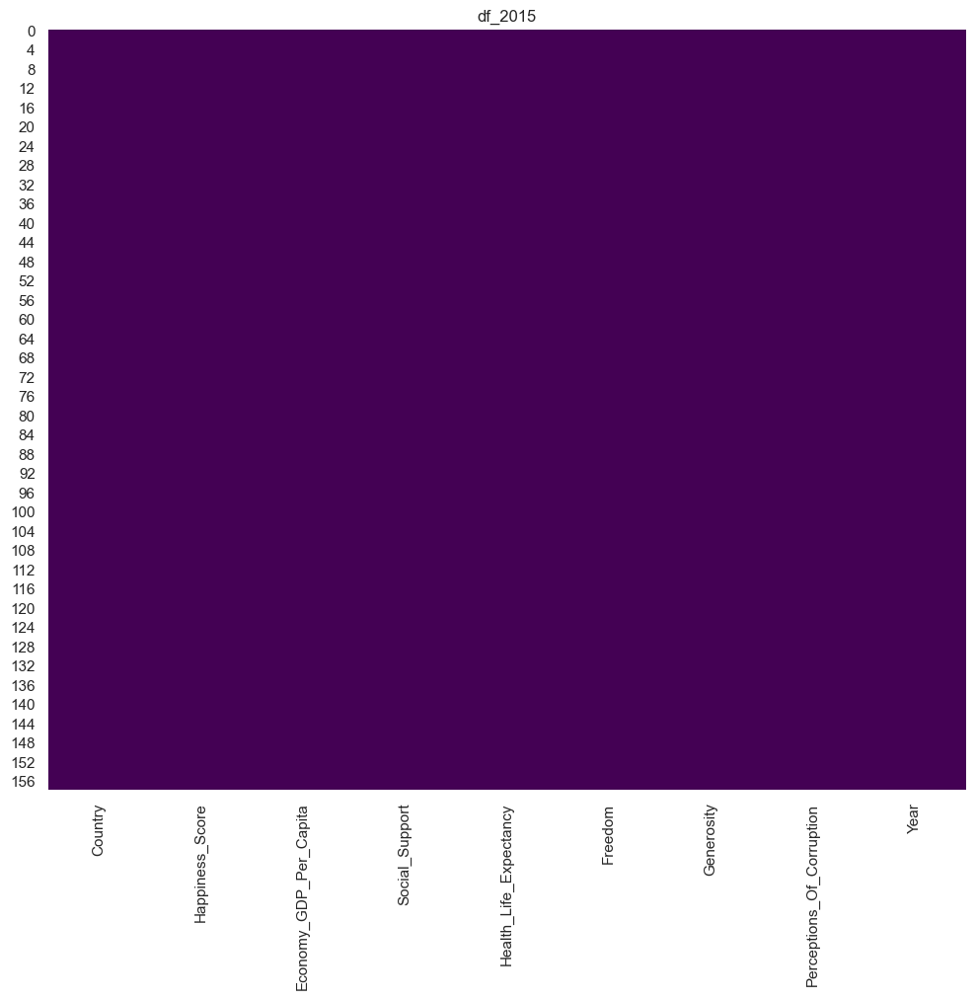

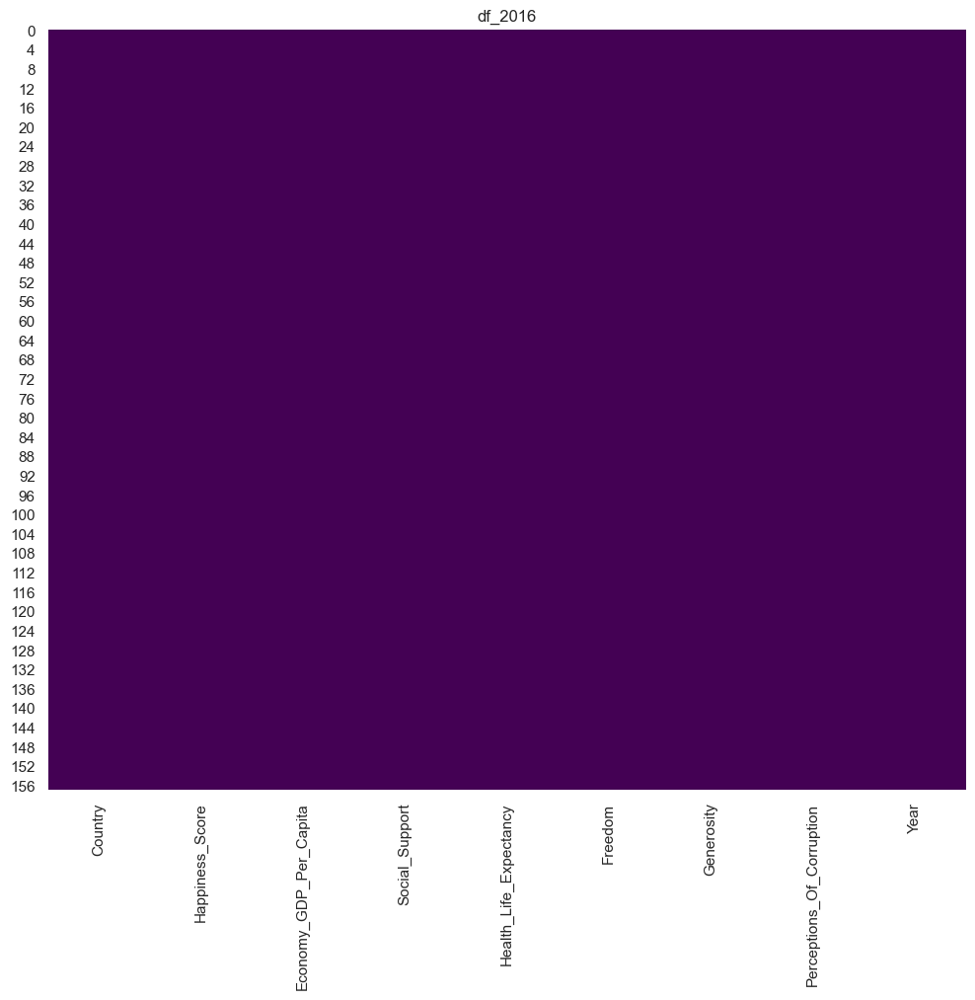

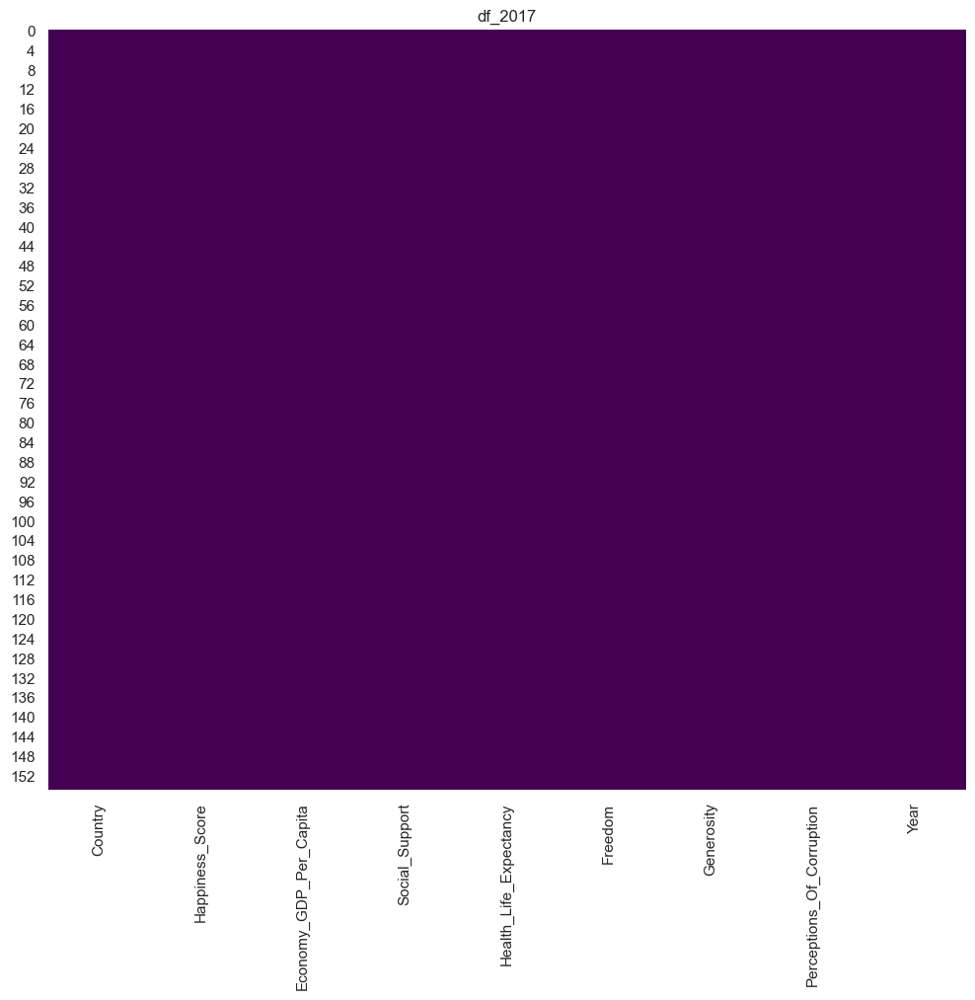

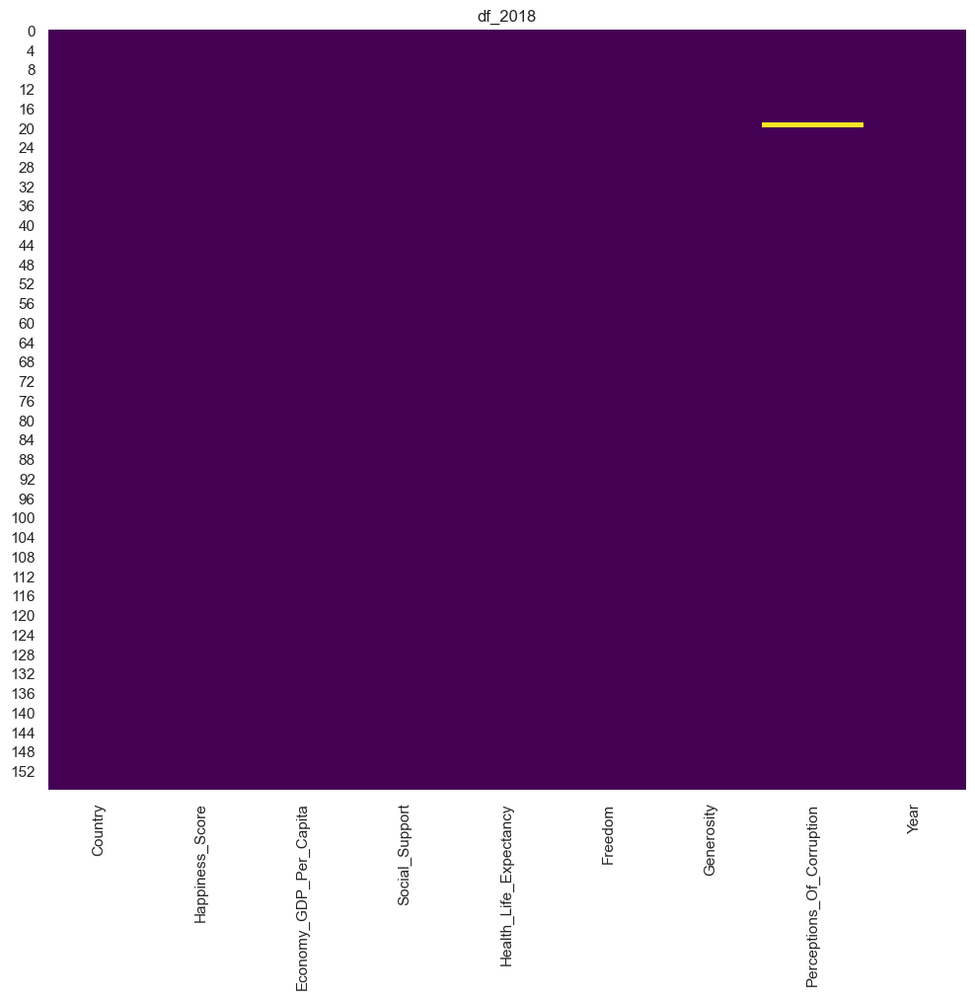

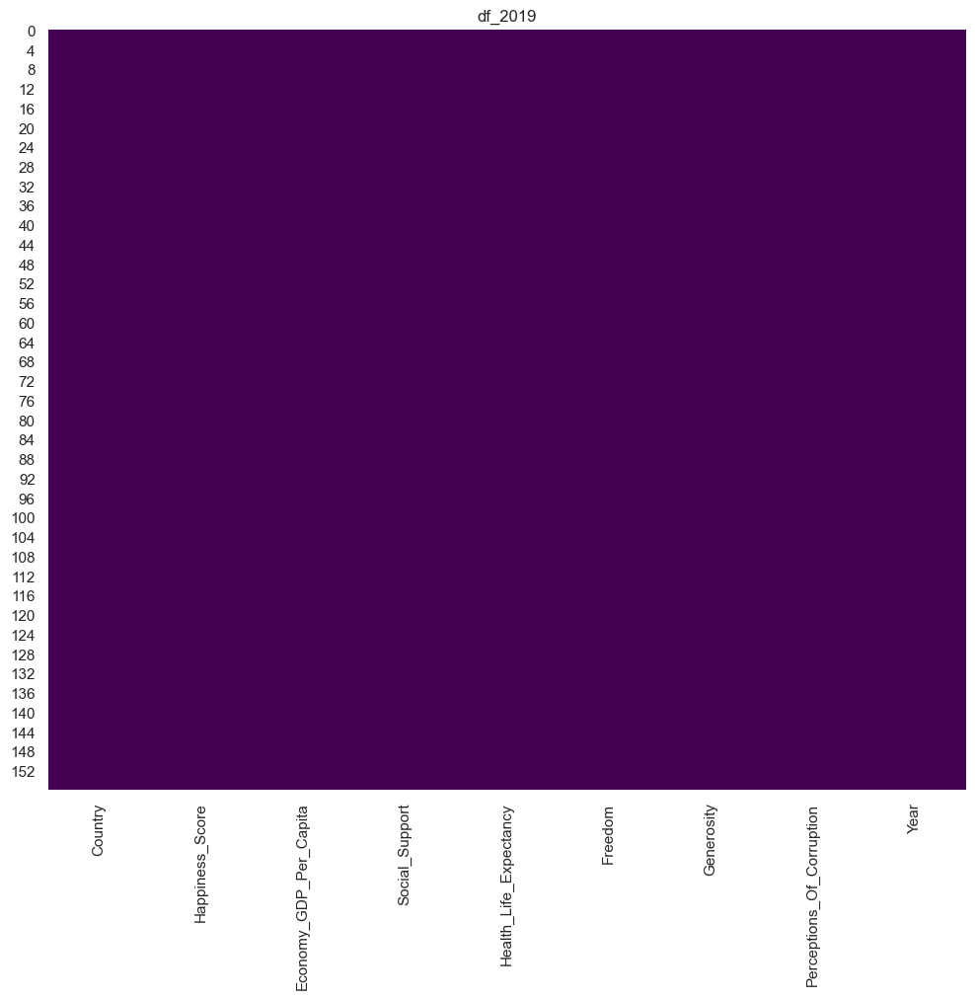

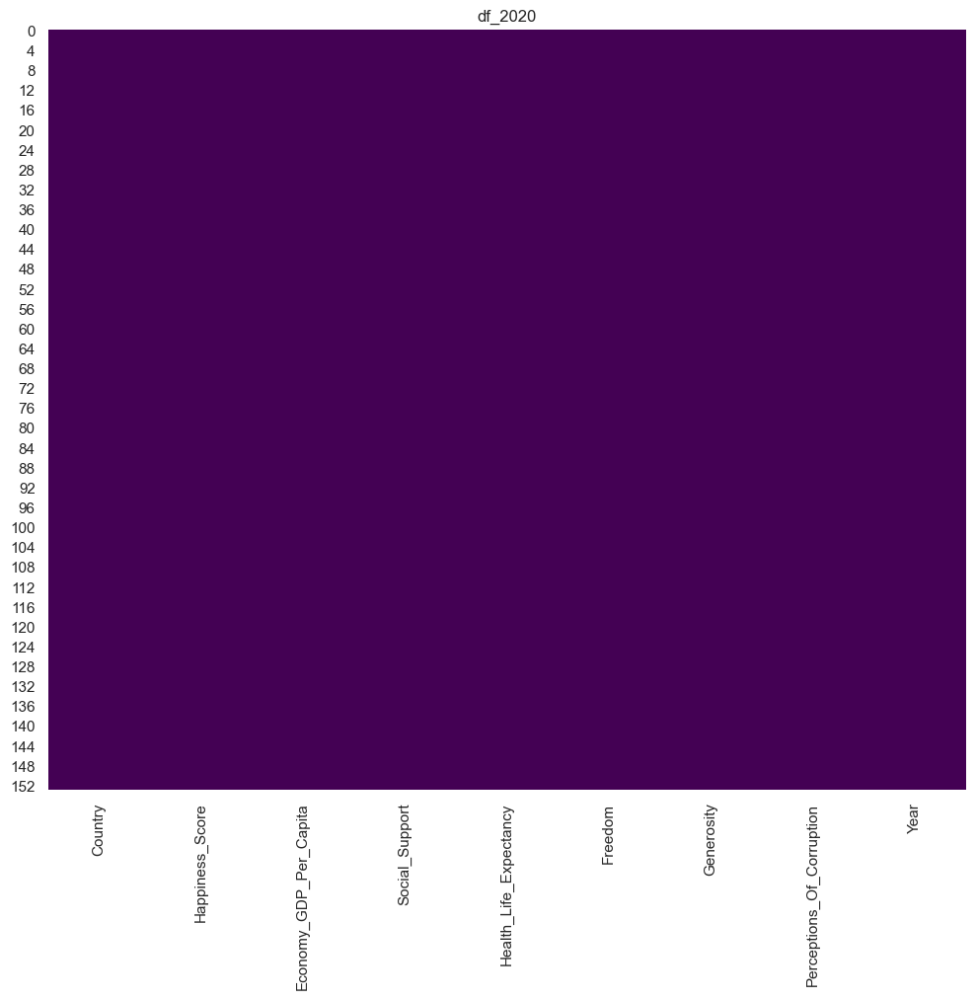

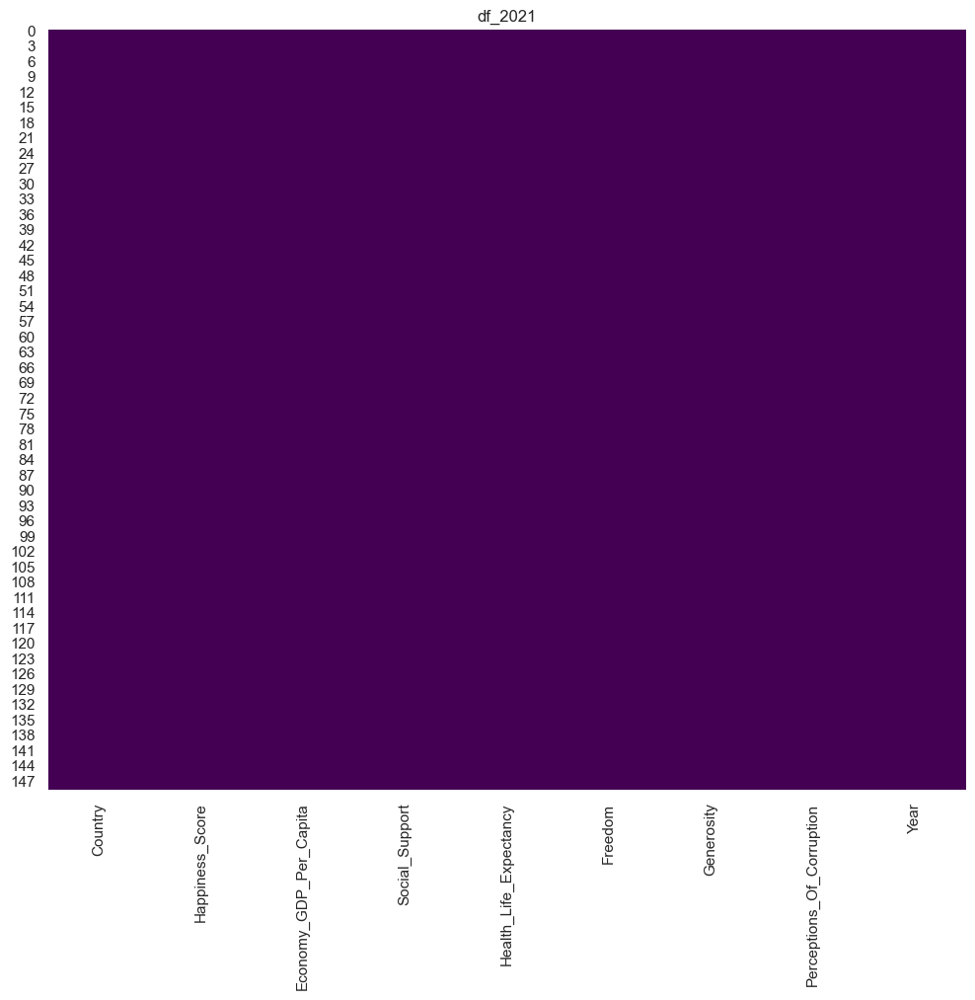

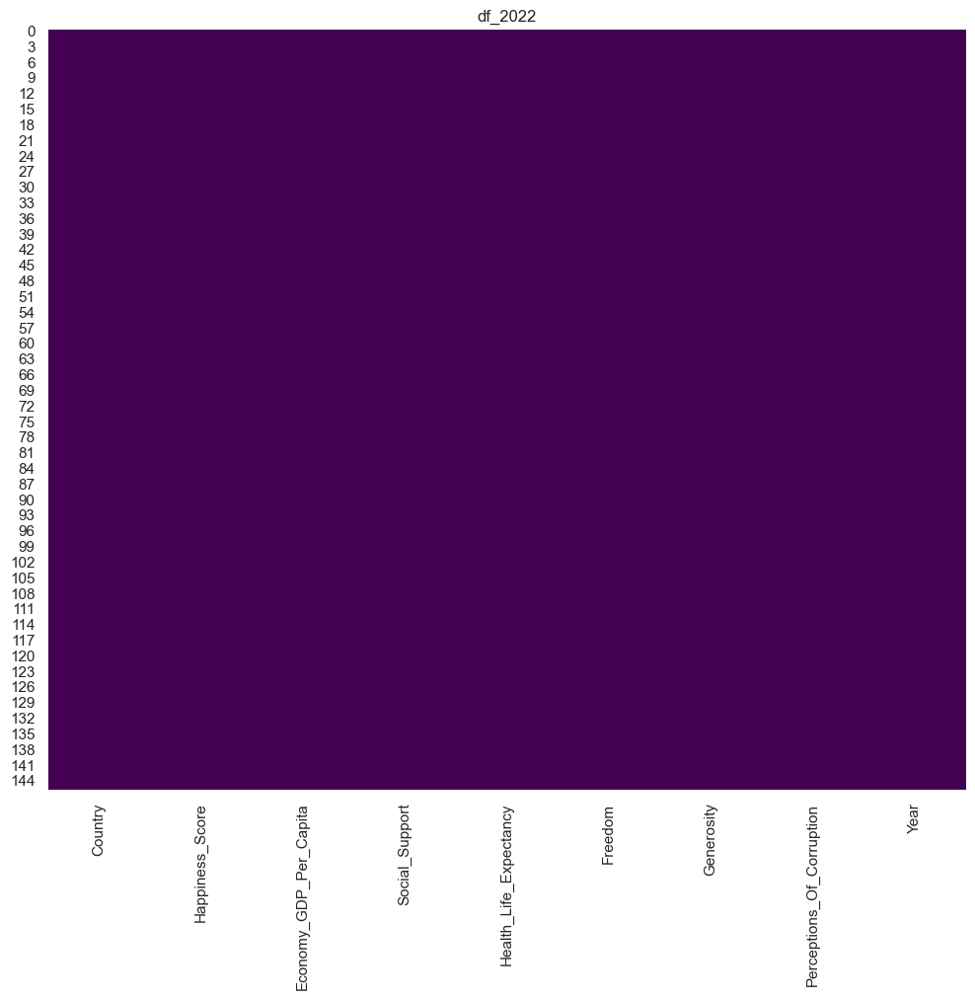

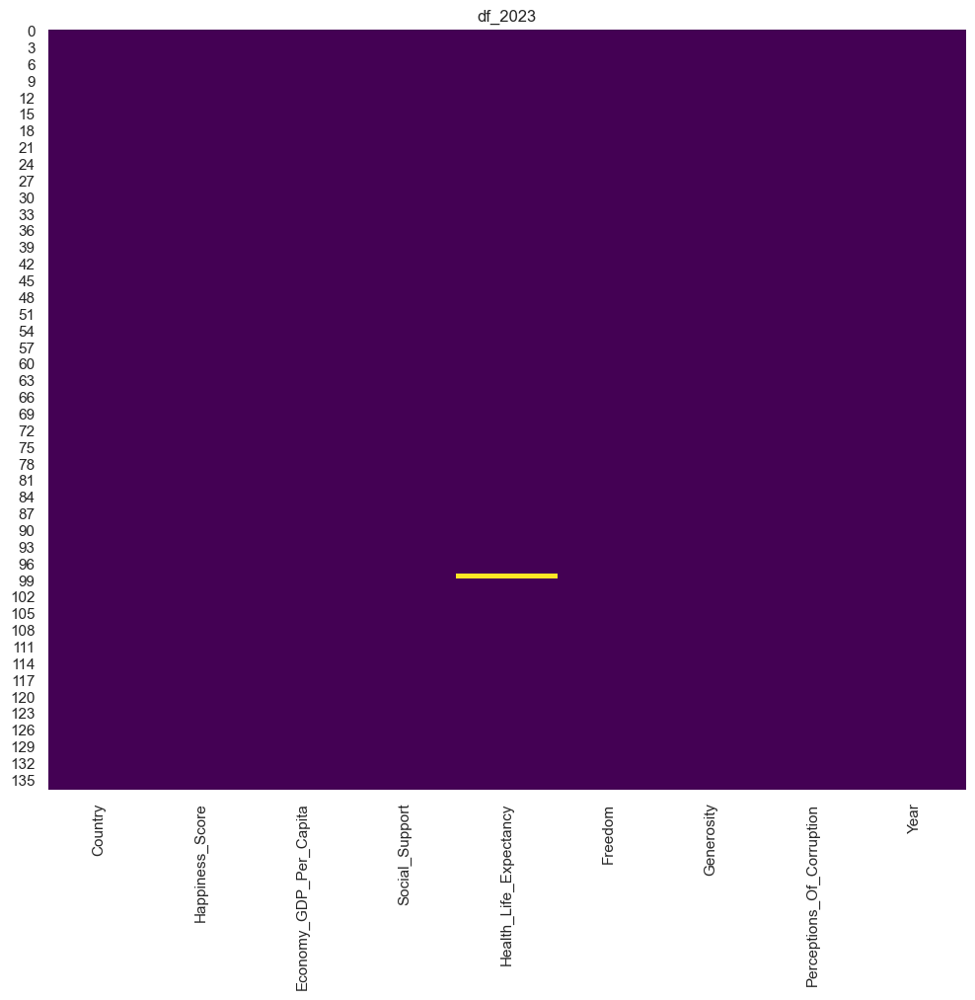

In [232]:
for i in df_list:
    plt.figure(figsize=(12,10))
    sns.heatmap(i.isnull(),cbar=False,cmap='viridis')
    plt.title(i.name)

df_2015


<Axes: >

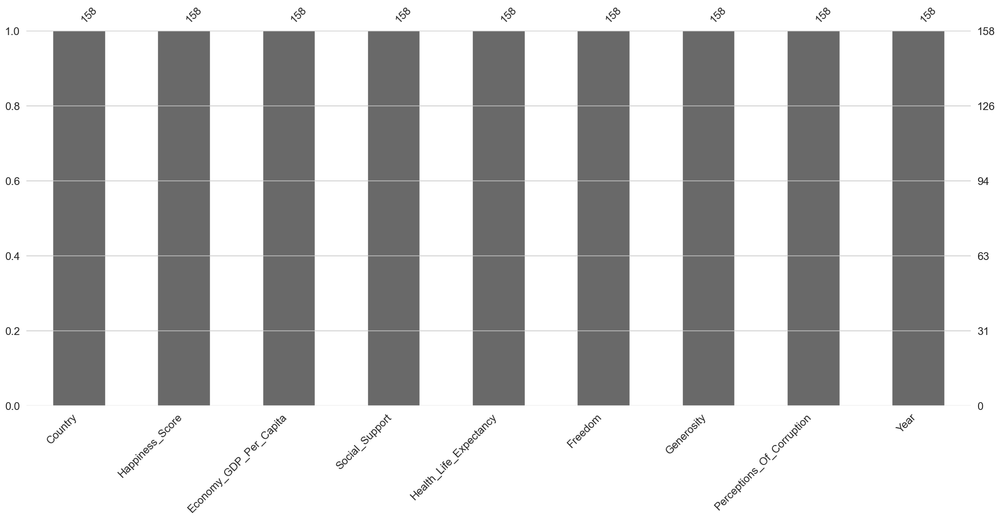

In [233]:
print(df_list[0].name)
msno.bar(df_list[0])

df_2016


<Axes: >

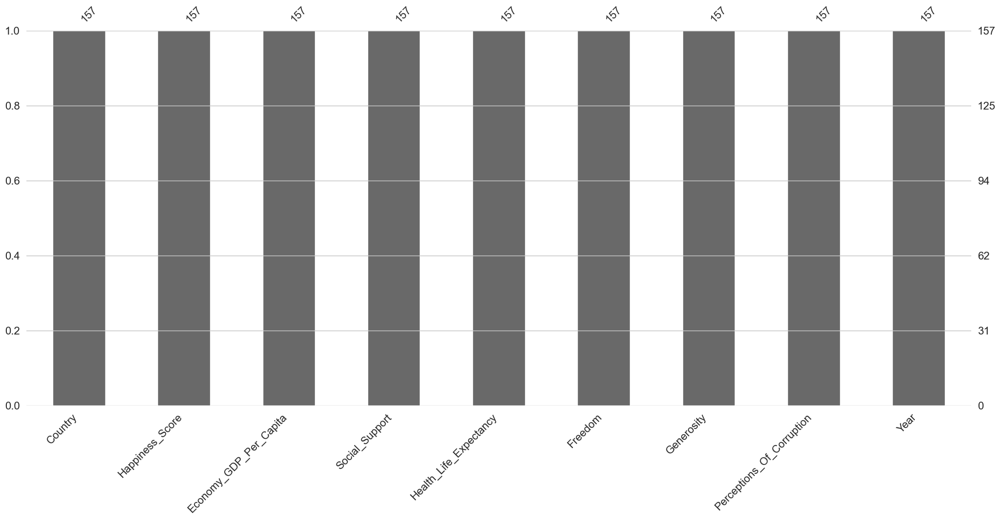

In [234]:
print(df_list[1].name)
msno.bar(df_list[1])

df_2017


<Axes: >

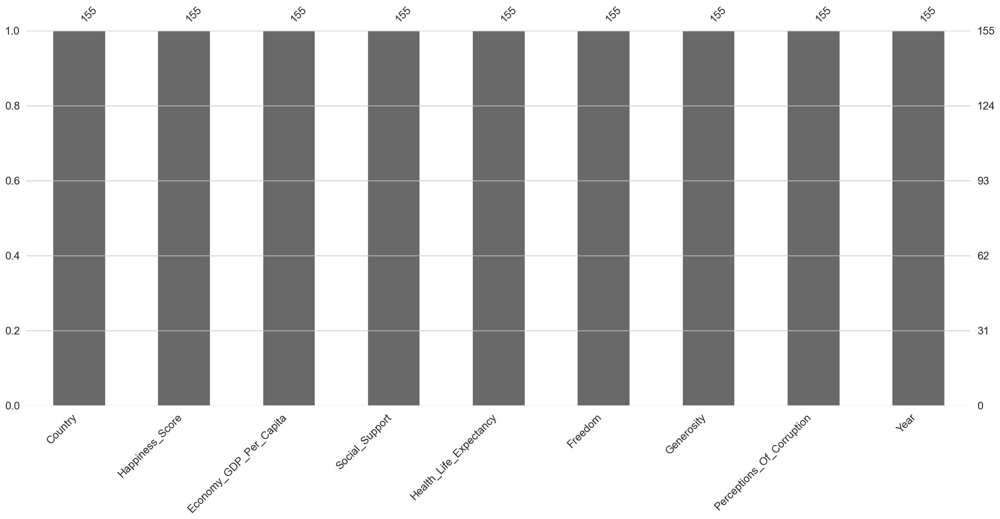

In [235]:
print(df_list[2].name)
msno.bar(df_list[2])

df_2018


<Axes: >

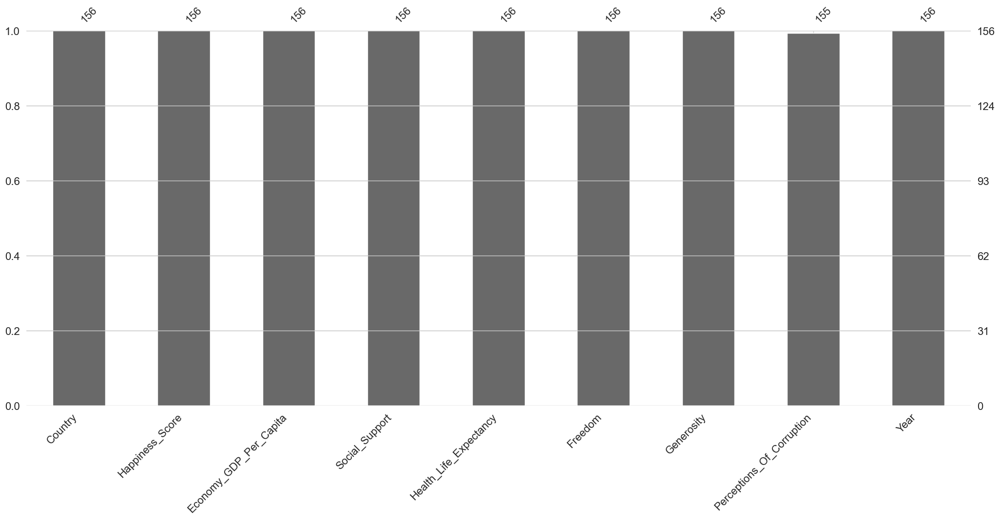

In [236]:
print(df_list[3].name)
msno.bar(df_list[3])

df_2019


<Axes: >

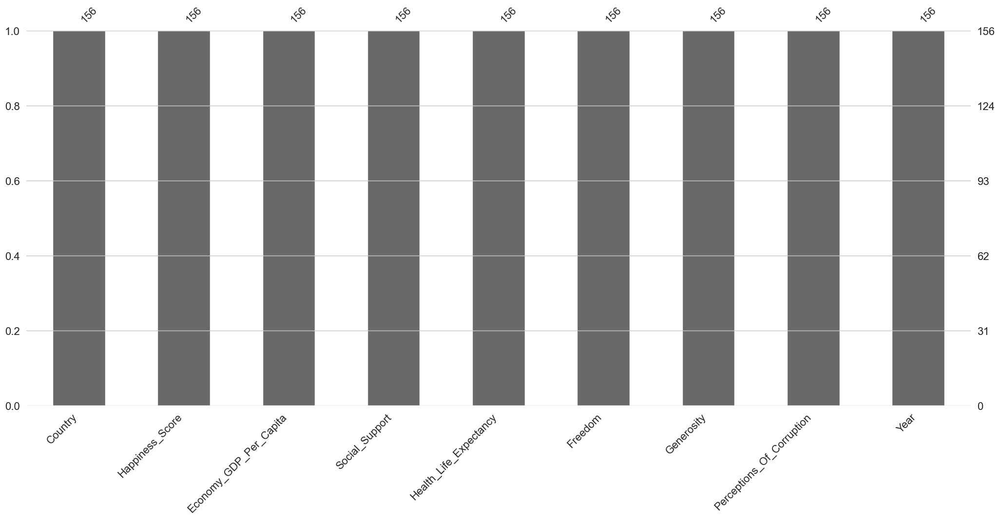

In [237]:
print(df_list[4].name)
msno.bar(df_list[4])

df_2020


<Axes: >

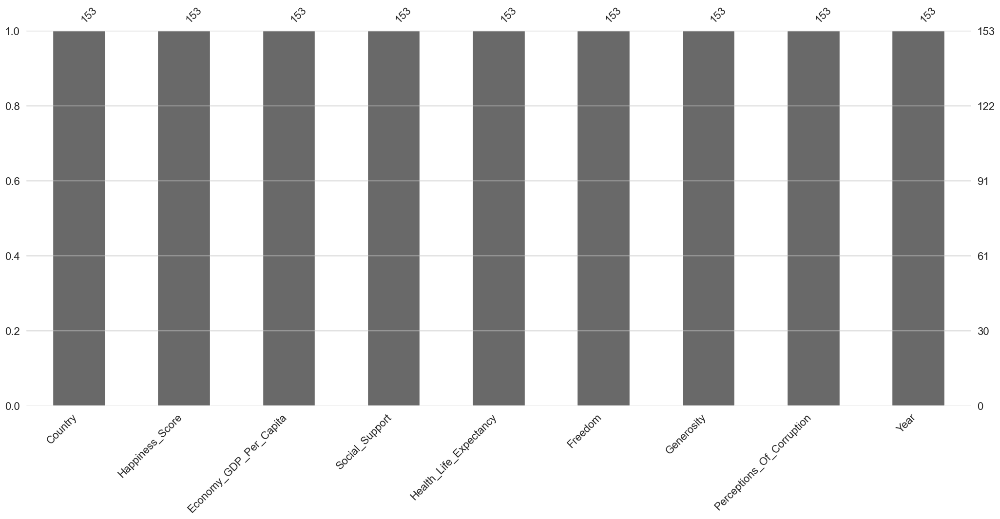

In [238]:
print(df_list[5].name)
msno.bar(df_list[5])

df_2021


<Axes: >

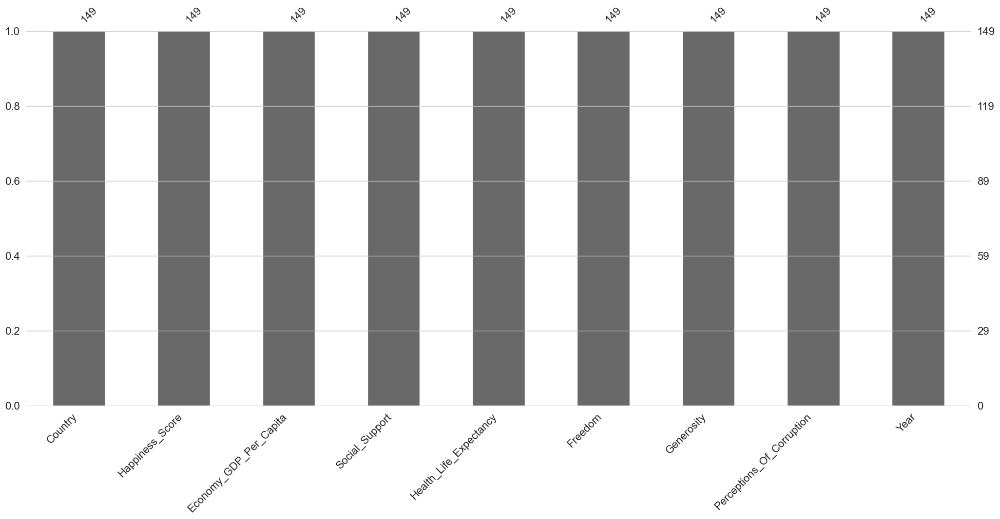

In [239]:
print(df_list[6].name)
msno.bar(df_list[6])

df_2022


<Axes: >

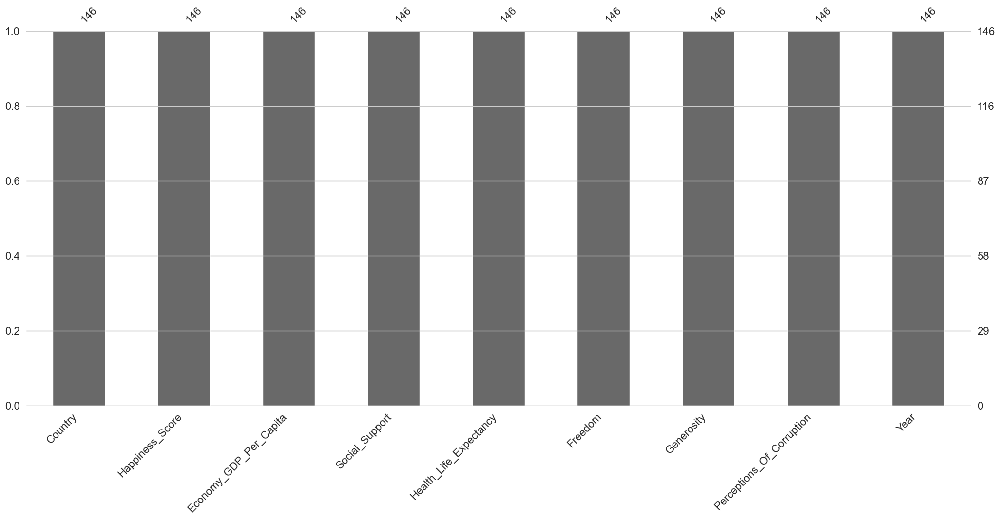

In [240]:
print(df_list[7].name)
msno.bar(df_list[7])

df_2023


<Axes: >

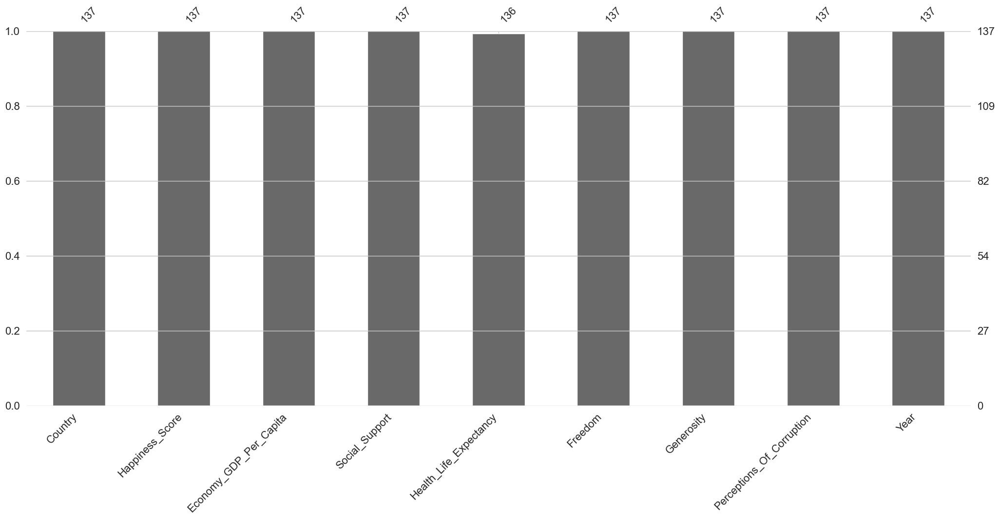

In [241]:
print(df_list[8].name)
msno.bar(df_list[8])

df_2015


<Axes: >

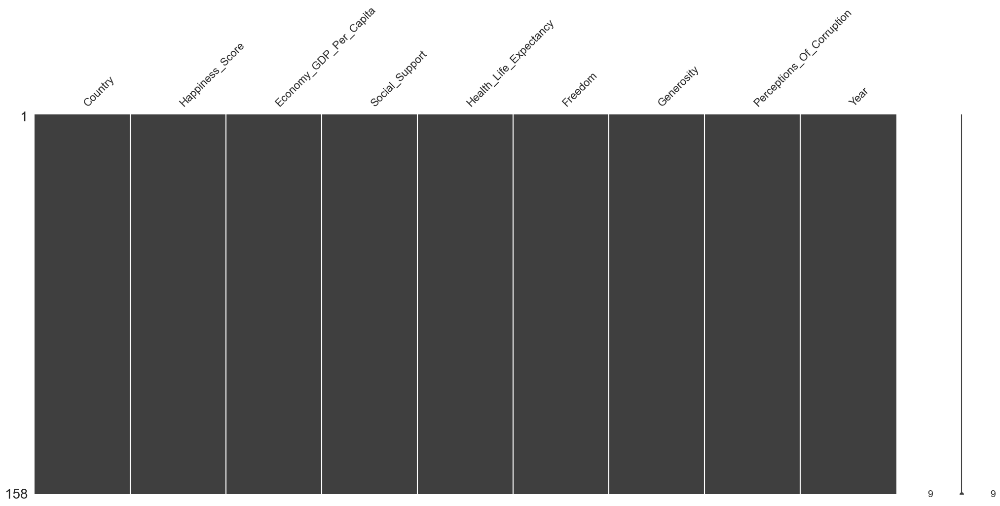

In [242]:
print(df_list[0].name)
msno.matrix(df_list[0])

df_2016


<Axes: >

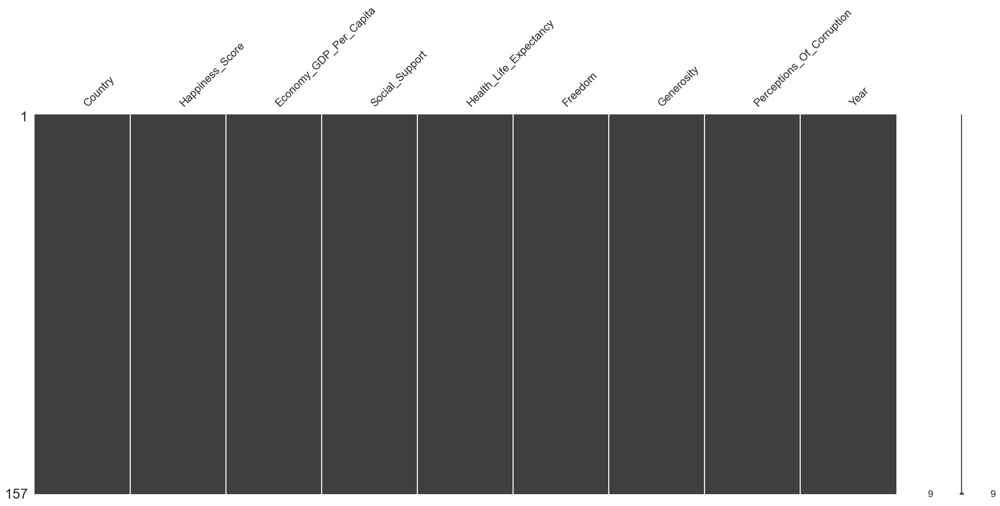

In [243]:
print(df_list[1].name)
msno.matrix(df_list[1])

df_2017


<Axes: >

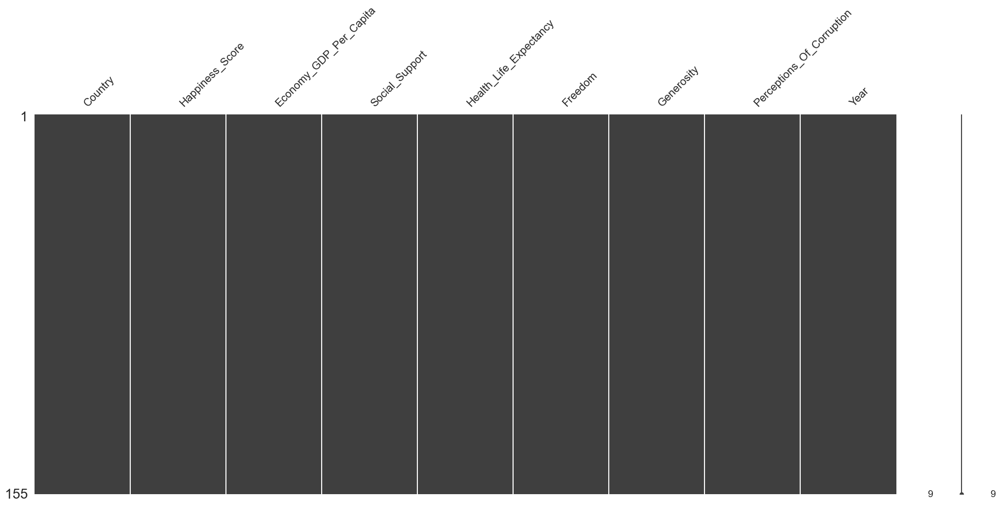

In [244]:
print(df_list[2].name)
msno.matrix(df_list[2])

df_2018


<Axes: >

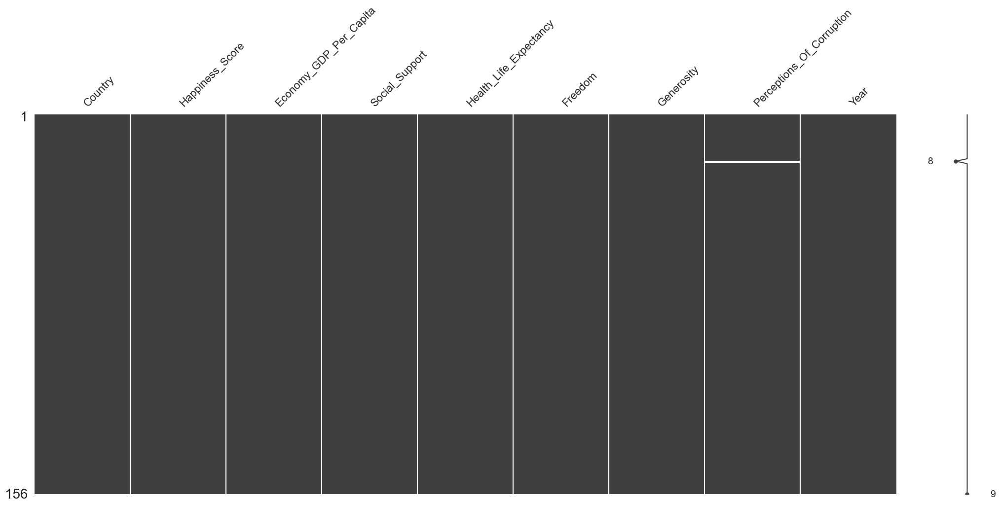

In [245]:
print(df_list[3].name)
msno.matrix(df_list[3])

df_2019


<Axes: >

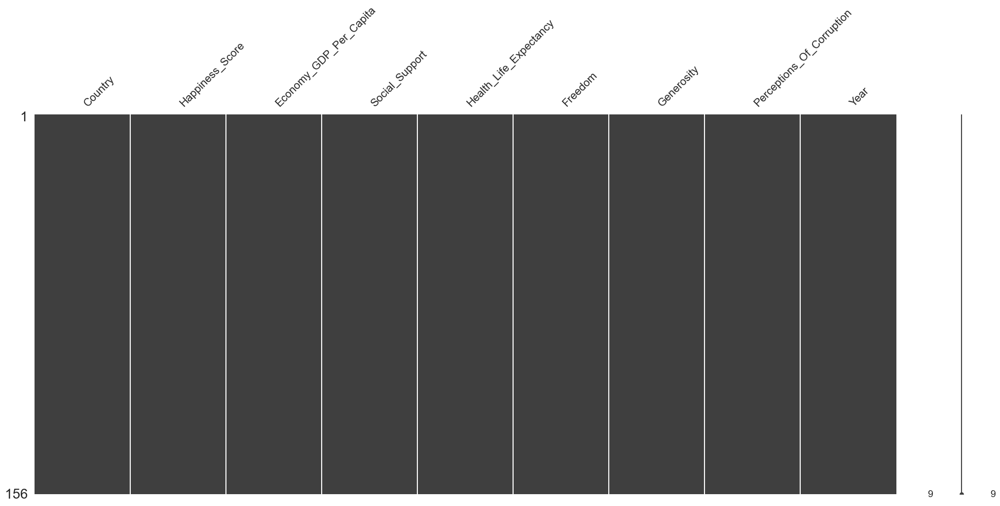

In [246]:
print(df_list[4].name)
msno.matrix(df_list[4])

df_2020


<Axes: >

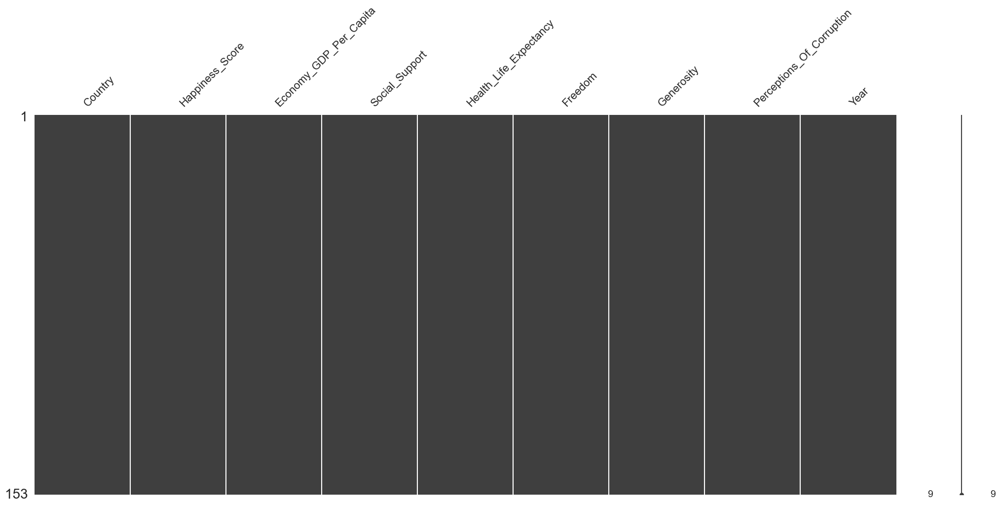

In [247]:
print(df_list[5].name)
msno.matrix(df_list[5])

df_2021


<Axes: >

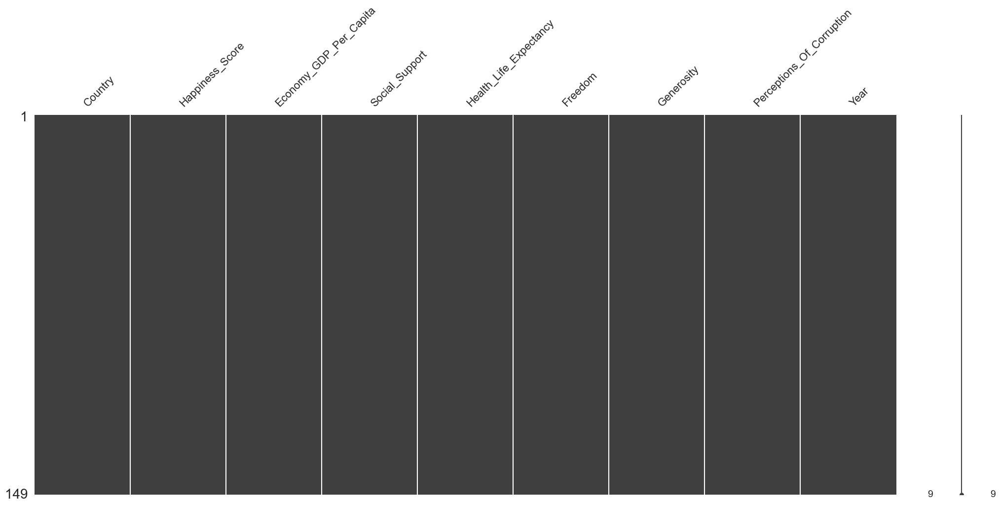

In [248]:
print(df_list[6].name)
msno.matrix(df_list[6])

df_2022


<Axes: >

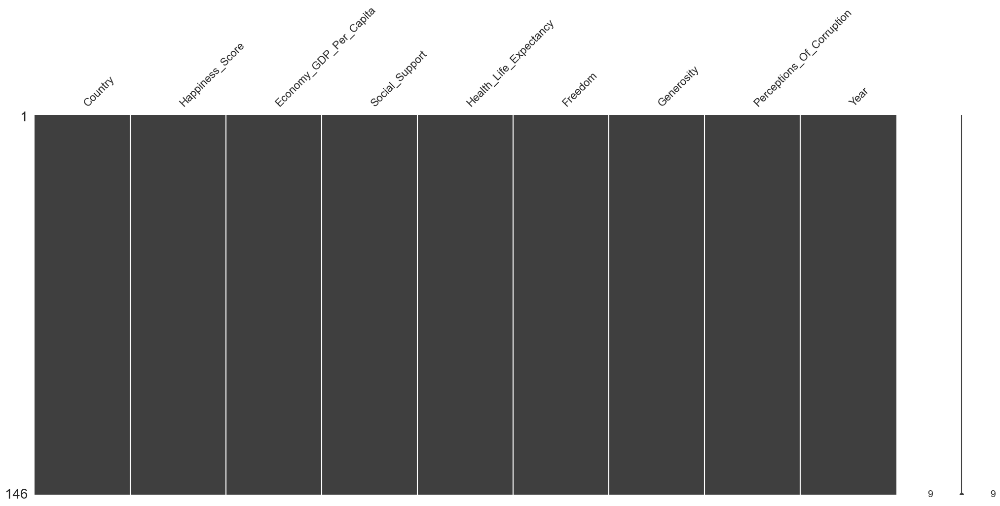

In [249]:
print(df_list[7].name)
msno.matrix(df_list[7])

df_2023


<Axes: >

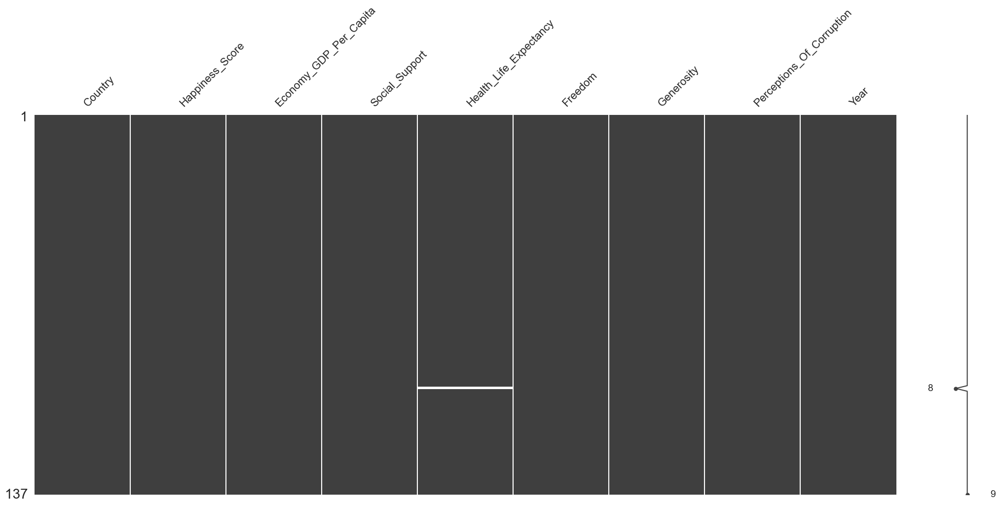

In [250]:
print(df_list[8].name)
msno.matrix(df_list[8])

df_2018


<Axes: >

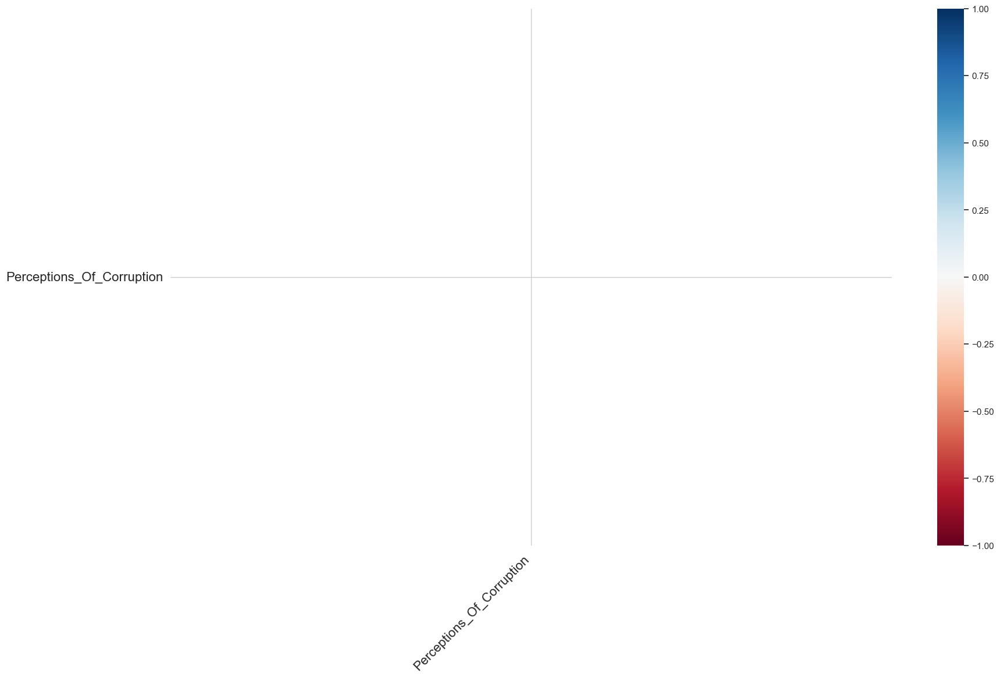

In [251]:
print(df_list[3].name)
msno.heatmap(df_list[3])

df_2023


<Axes: >

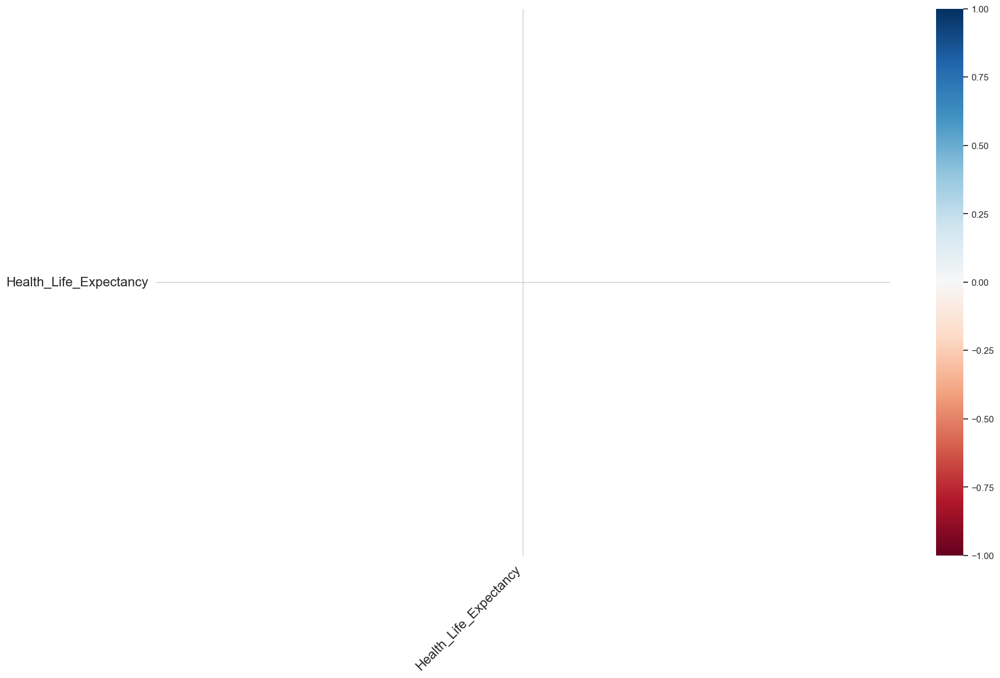

In [252]:
print(df_list[8].name)
msno.heatmap(df_list[8])

# Finding missing values

in this code, we find the Country's with columns, which have missing values:
- we created a loop over all datasets and print the row with missing values
- we can see, that only in year 2018 (United Arab Emirates) - Perceptions_Of_Corruption and 2023 (State of Palestine) - Health_Life_Expectancy we have missing values

In [253]:
for i in df_list:
    display(i[i.isnull().any(axis = 1)]) # display rows with missing values

,Country,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year


,Country,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year


,Country,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year


,Country,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year
19,United Arab Emirates,6.774,2.096,0.776,0.67,0.284,0.186,NaN,2018


,Country,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year


,Country,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year


,Country,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year


,Country,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year


,Country,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year
98,State of Palestine,4.908,1.144,1.309,NaN,0.416,0.065,0.067,2023


# Replacing missing values 

For the replacing of missing values, we use in this step the mean.
- 2018: Perceptions_Of_Corruption
- 2023: Health_Life_Expectancy

# <font color=red>Feedback</font>

Replacing missing values often is a viable method.
Considering that we have missing values for "State of Palestine" and "United Arab Emirates", which both might not be the most average countries using other methods could yield good results as well.
Again comming back to the nature of the data, we have data for the same country for different years.
This means we could also use the information from other years to fill in the missing values.

Another aspect in this regard is to check wether you have information for all the countries for all the years (2015-2023).
Most likely this is not the case since the datasets are of different sizes.

In the code below we show some of the other methods you could use.

In [258]:
# concatenate the DataFrames to have the information for all the years
df = pd.concat(df_list)

# have a look at only the "United Arab Emirates" as an example.
df_sample = df[df['Country'] == 'United Arab Emirates']
display(df_sample)

# you replace it with the mean of all countries for the same year
print(f"Mean 'Perceptions of Corruption' in 2018: {df_list[3]['Perceptions_Of_Corruption'].mean()}")

# using the interpolate method
df_sample["Perceptions_Of_Corruption"].interpolate()

,Country,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year
19,United Arab Emirates,6.9010,1.4273,1.1258,0.8093,0.6416,0.2643,0.3858,2015
27,United Arab Emirates,6.5730,1.5735,0.8711,0.7299,0.5622,0.2659,0.3556,2016
20,United Arab Emirates,6.6480,1.6263,1.2664,0.7268,0.6083,0.3609,0.3245,2017
19,United Arab Emirates,6.7740,2.0960,0.7760,0.6700,0.2840,0.1860,NaN,2018
20,United Arab Emirates,6.8250,1.5030,1.3100,0.8250,0.5980,0.2620,0.1820,2019
20,United Arab Emirates,6.7908,1.4311,1.2512,0.7878,0.6529,0.2807,0.2202,2020
24,United Arab Emirates,6.5610,1.5550,0.8600,0.5940,0.6700,0.2360,0.2230,2021
23,United Arab Emirates,6.5760,1.9980,0.9800,0.6330,0.7020,0.2040,0.2500,2022
25,United Arab Emirates,6.5710,2.0150,1.2230,0.4010,0.7450,0.1880,0.2470,2023


Mean 'Perceptions of Corruption' in 2018: 0.112


19    0.38580
27    0.35560
20    0.32450
19    0.25325
20    0.18200
20    0.22020
24    0.22300
23    0.25000
25    0.24700
Name: Perceptions_Of_Corruption, dtype: float64

As you can see the value used for filling the missing value is lower than the minimum for this country over all the years.

In [156]:
# code for replacing missing values:
# - replace missing values with mean
# - round the number to 4 decimal
df_list[3]["Perceptions_Of_Corruption"].fillna(df_list[3]["Perceptions_Of_Corruption"].mean(), inplace = True)                                # year 2018
df_list[3]["Perceptions_Of_Corruption"] = df_list[3]["Perceptions_Of_Corruption"].apply(lambda x: round(x, 4) if isinstance(x, float) else x) # round the columns to 4 decimal numbers
df_list[8]["Health_Life_Expectancy"].fillna(df_list[8]["Health_Life_Expectancy"].mean(), inplace = True)                                      # year 2023
df_list[8]["Health_Life_Expectancy"] = df_list[8]["Health_Life_Expectancy"].apply(lambda x: round(x, 4) if isinstance(x, float) else x)       # round the columns to 4 decimal numbers

C:\Users\WZHJUFA\AppData\Local\Temp\1\ipykernel_9640\3142974140.py:4: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df_list[3]["Perceptions_Of_Corruption"].fillna(df_list[3]["Perceptions_Of_Corruption"].mean(), inplace = True)                                # year 2018
C:\Users\WZHJUFA\AppData\Local\Temp\1\ipykernel_9640\3142974140.py:6: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method wi

# Check missing values

- loop over all datasets (2015 - 2023)
- checking the sum of missing values, when result = 0, then OK

In [157]:
for i in df_list:
    print("Dataset: ", i.name)
    print(i.isnull().sum())
    print()

Dataset:  df_2015
Country                      0
Happiness_Score              0
Economy_GDP_Per_Capita       0
Social_Support               0
Health_Life_Expectancy       0
Freedom                      0
Generosity                   0
Perceptions_Of_Corruption    0
Year                         0
dtype: int64

Dataset:  df_2016
Country                      0
Happiness_Score              0
Economy_GDP_Per_Capita       0
Social_Support               0
Health_Life_Expectancy       0
Freedom                      0
Generosity                   0
Perceptions_Of_Corruption    0
Year                         0
dtype: int64

Dataset:  df_2017
Country                      0
Happiness_Score              0
Economy_GDP_Per_Capita       0
Social_Support               0
Health_Life_Expectancy       0
Freedom                      0
Generosity                   0
Perceptions_Of_Corruption    0
Year                         0
dtype: int64

Dataset:  df_2018
Country                      0
Happiness_Score   

# Checking data distibution 

- the columns are in all datasets equal, we need only one list
- we delete the column "YEAR", we don't need this column for data distibution, is only for time series

In [158]:
numeric_cols = df_list[0].select_dtypes(include='number').columns
numeric_cols = numeric_cols.drop("Year")
numeric_cols

Index(['Happiness_Score', 'Economy_GDP_Per_Capita', 'Social_Support',
       'Health_Life_Expectancy', 'Freedom', 'Generosity',
       'Perceptions_Of_Corruption'],
      dtype='object')

- print plots over years:

Dataset =  df_2015


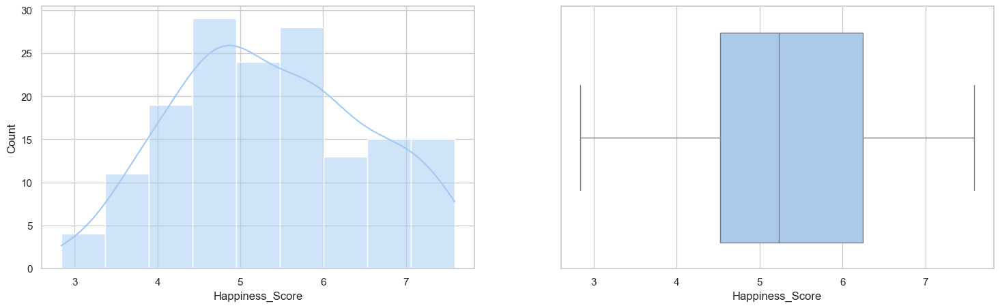

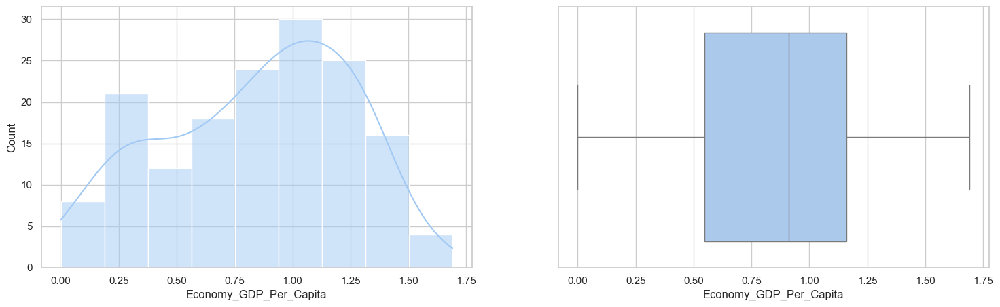

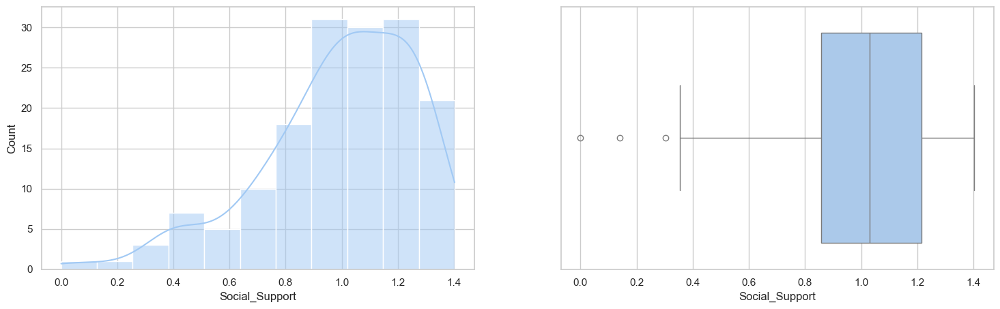

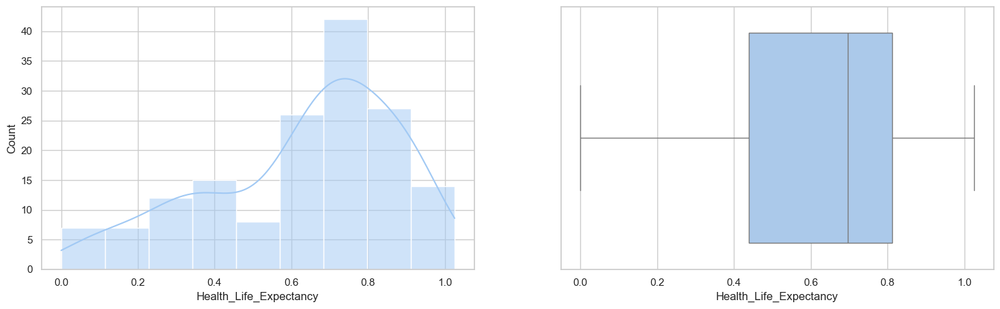

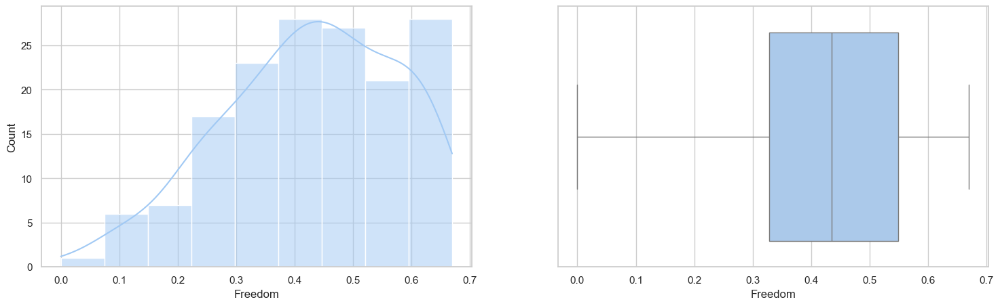

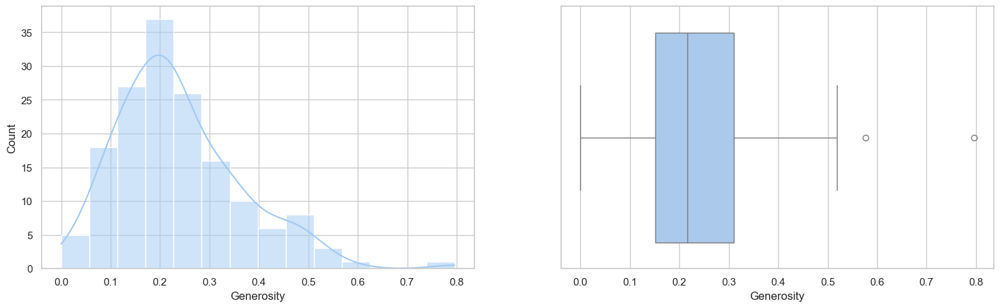

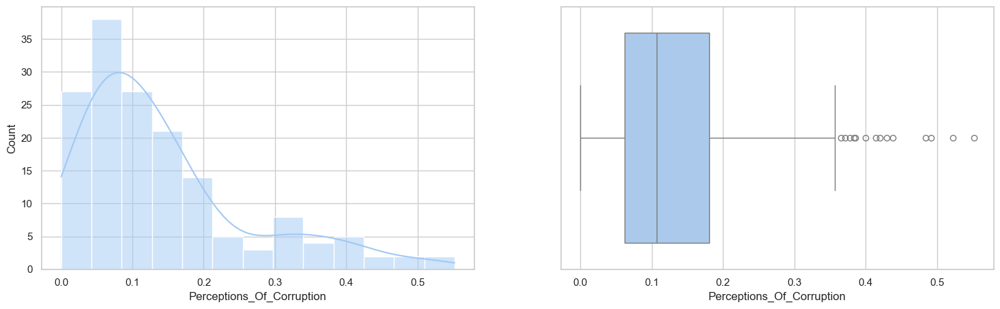

Dataset =  df_2016


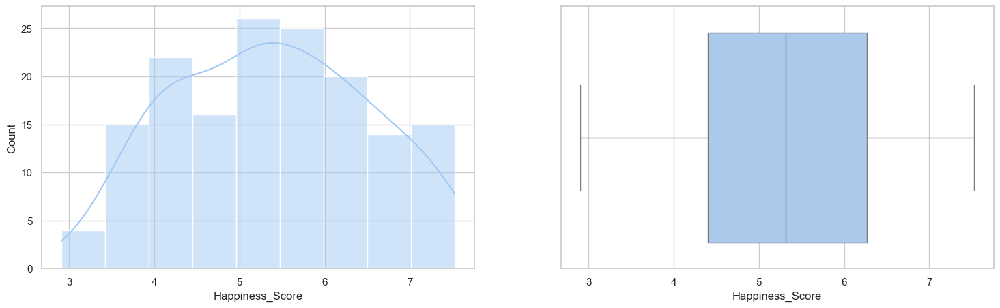

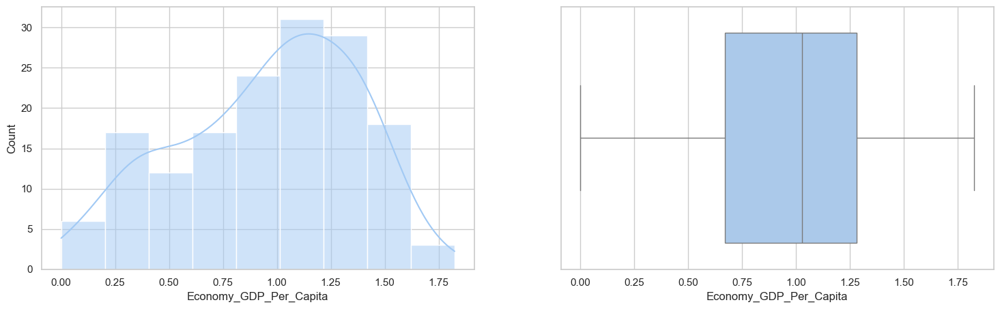

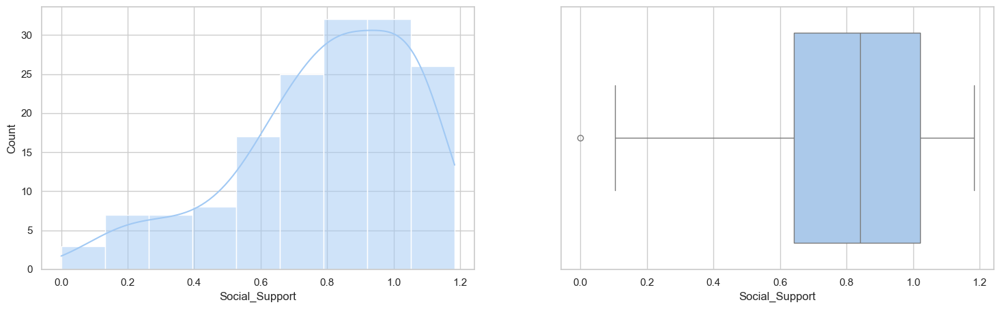

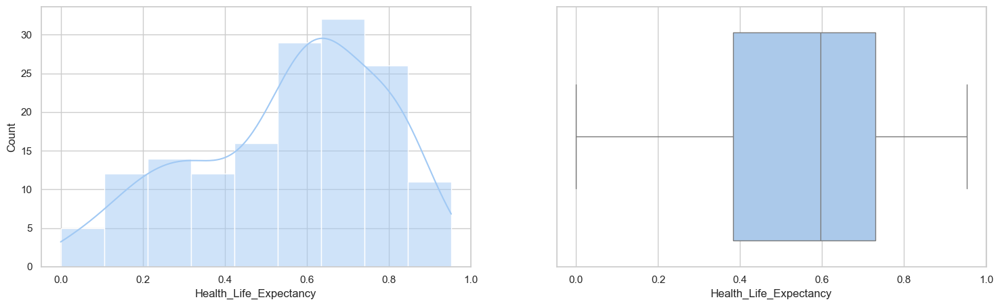

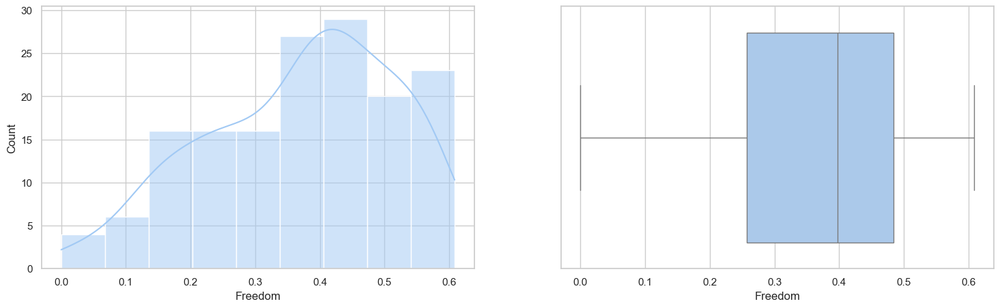

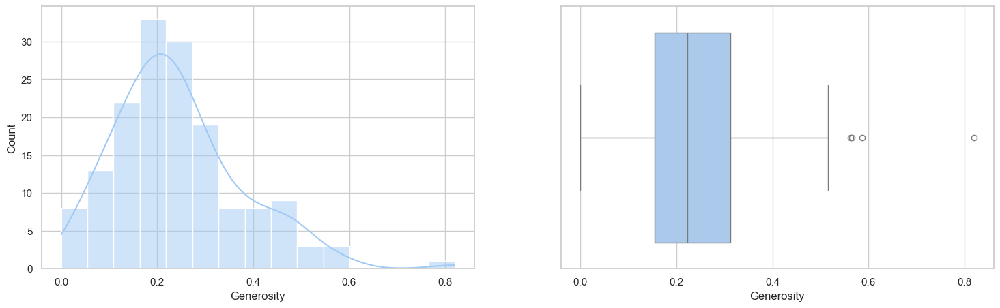

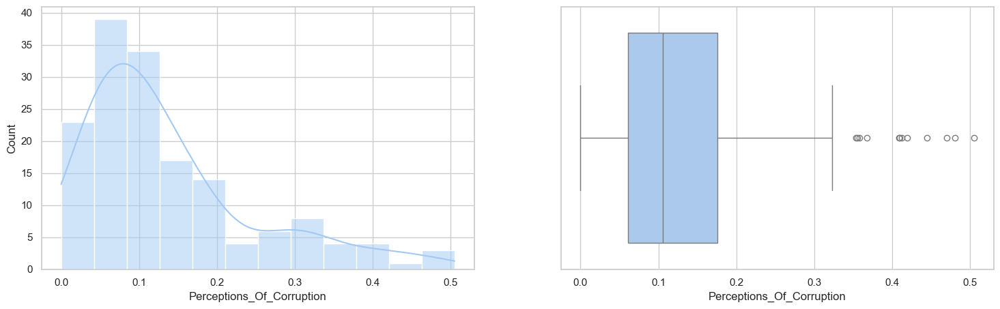

Dataset =  df_2017


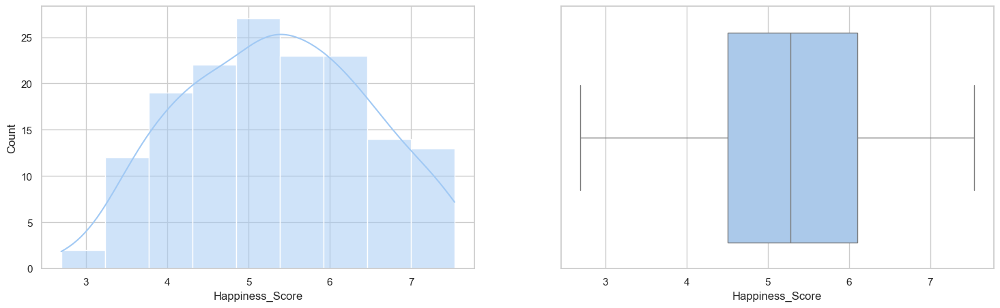

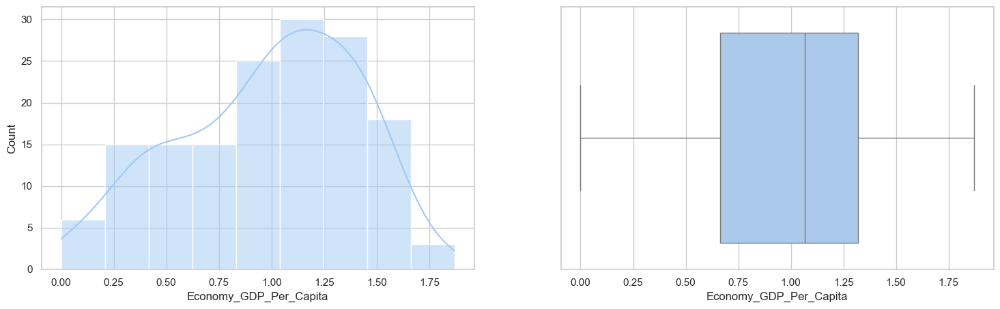

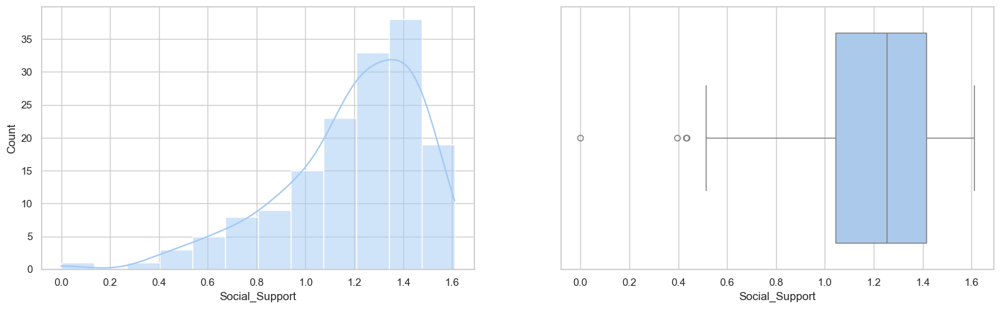

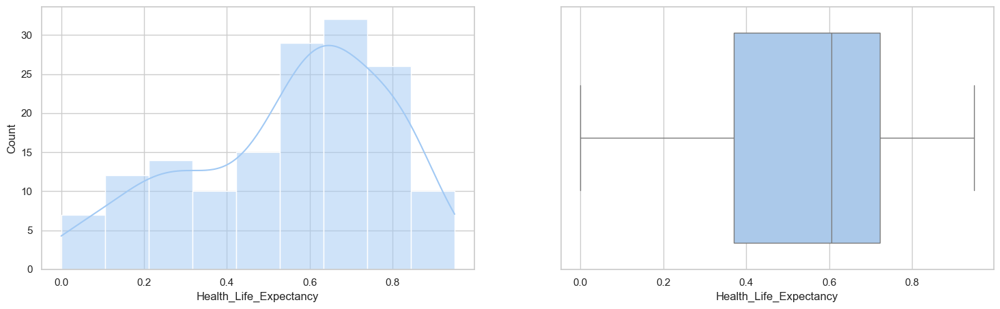

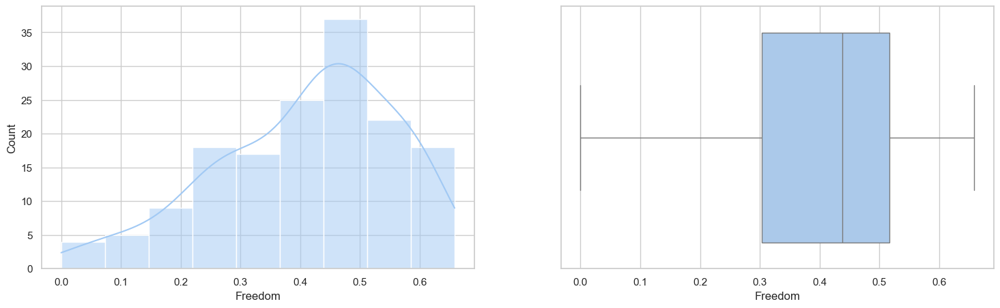

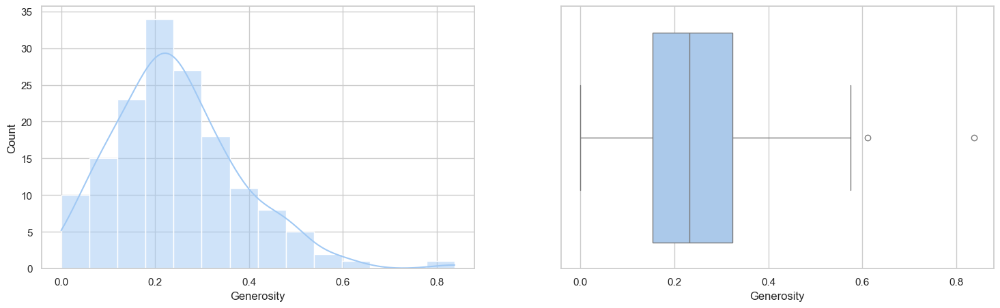

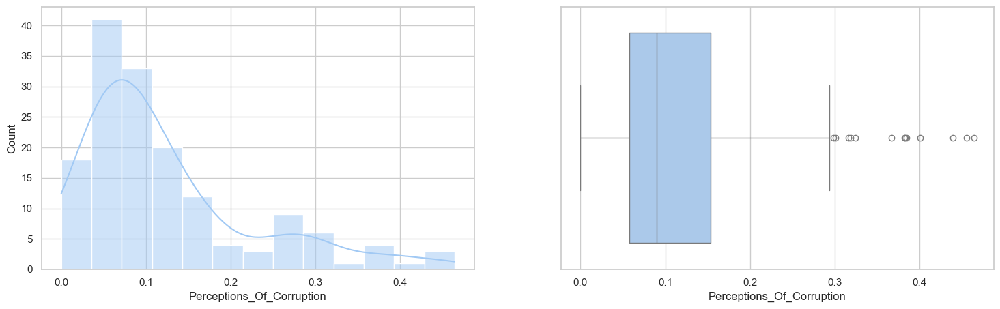

Dataset =  df_2018


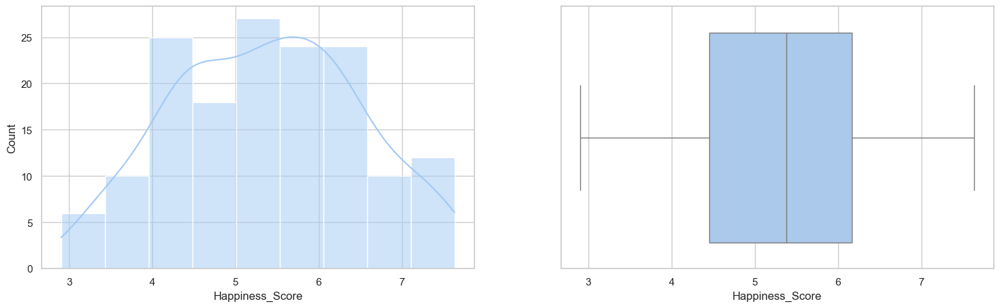

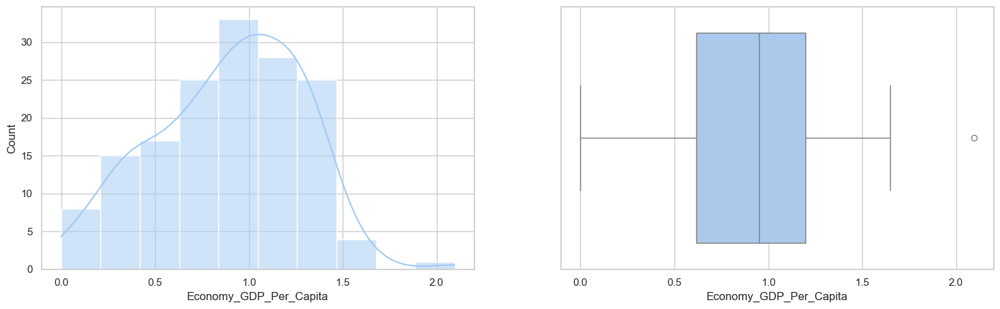

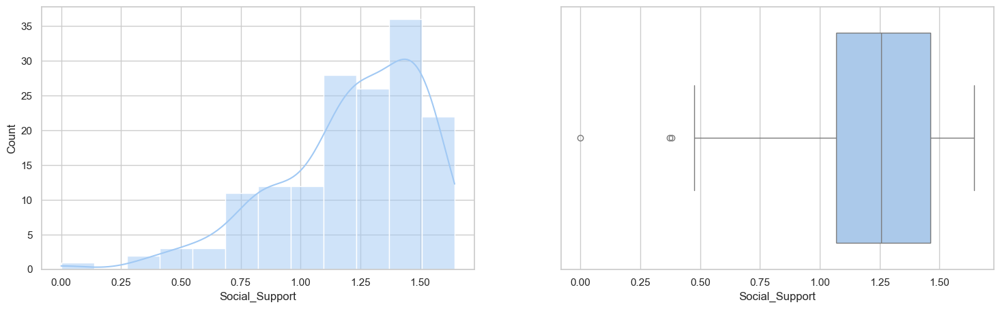

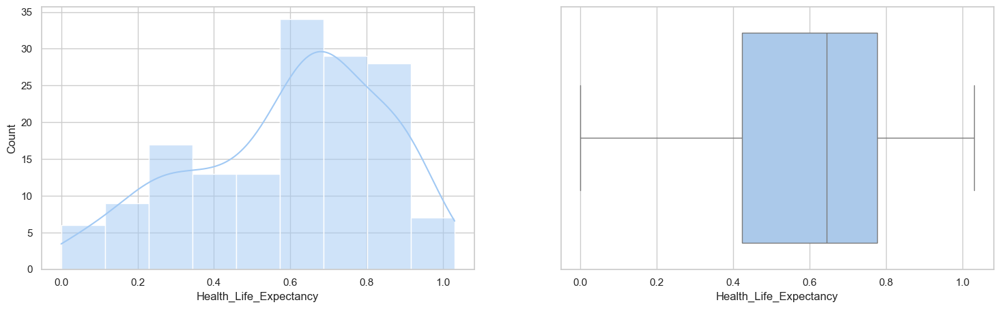

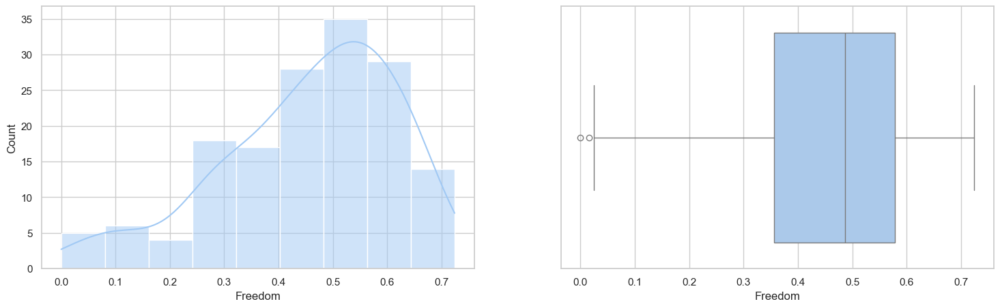

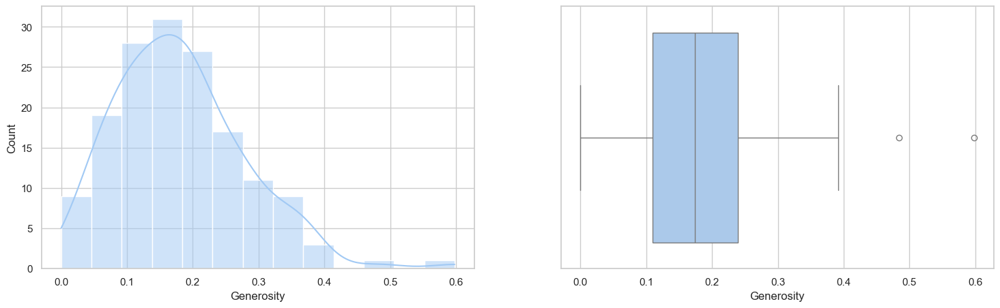

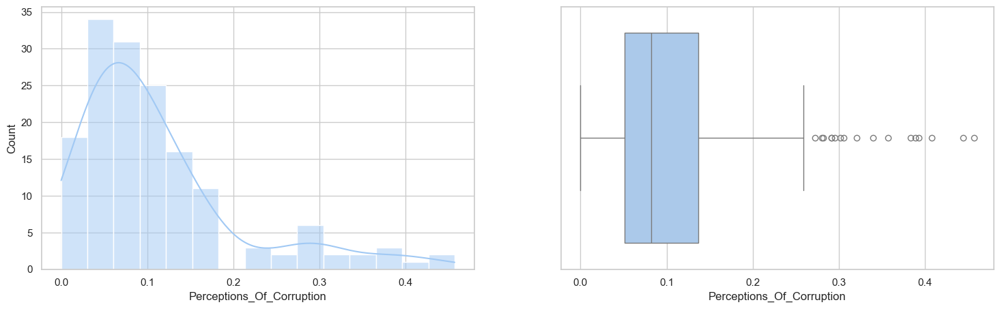

Dataset =  df_2019


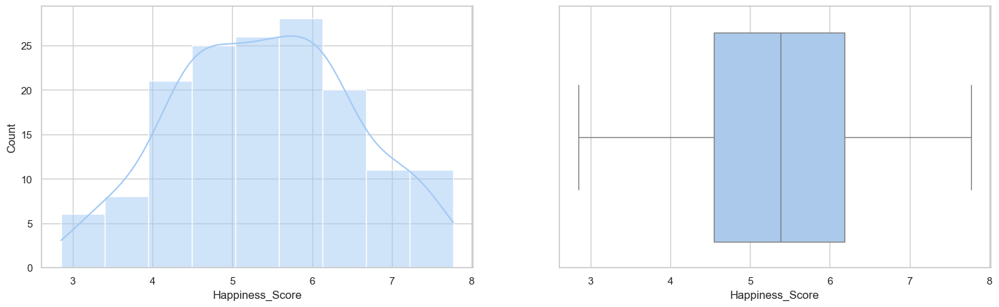

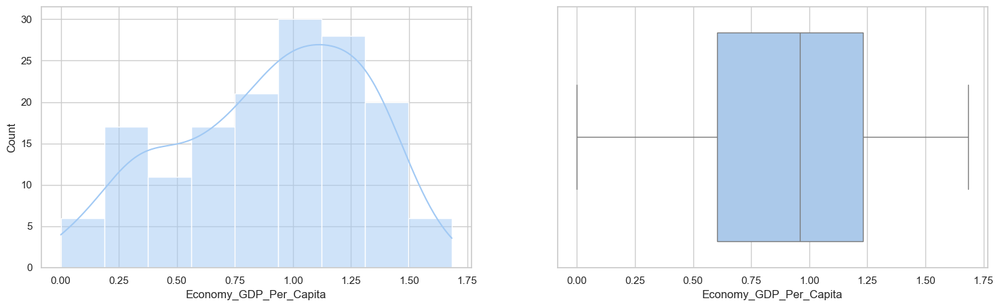

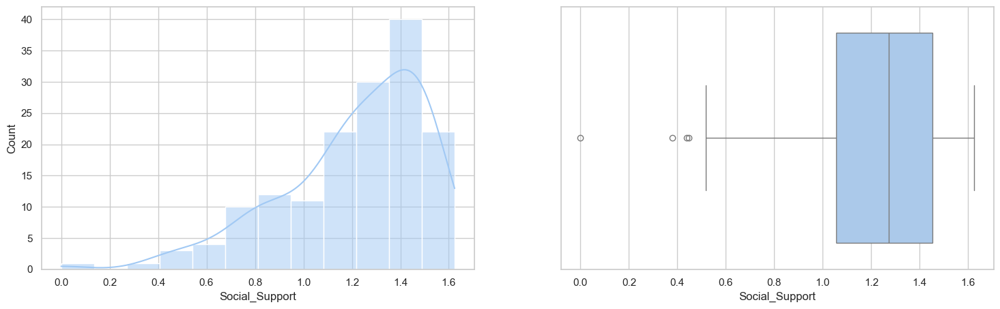

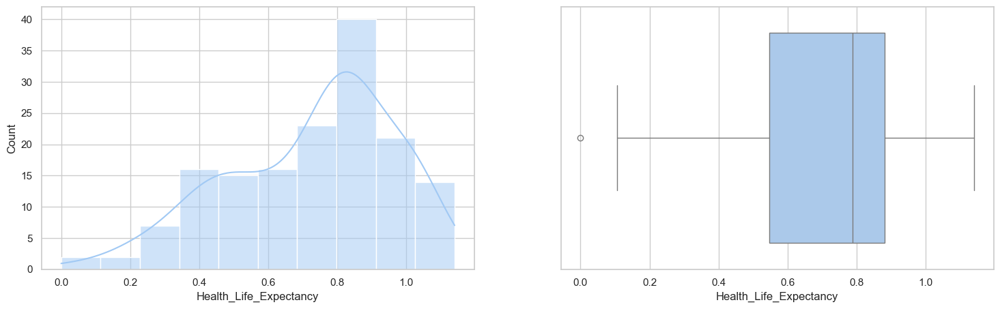

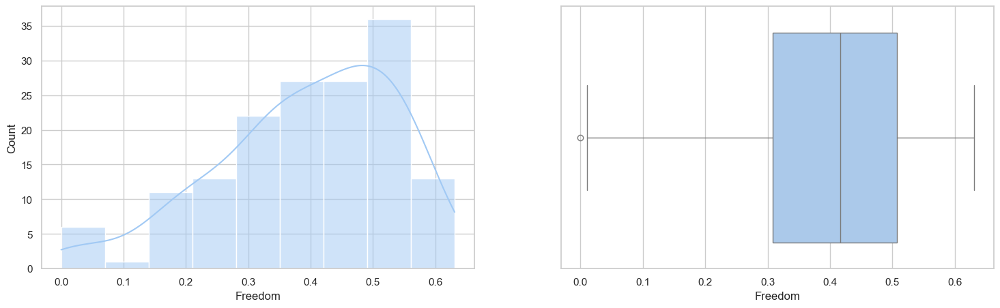

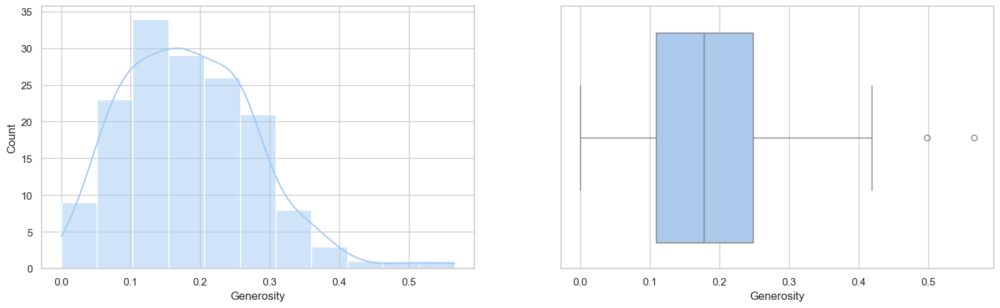

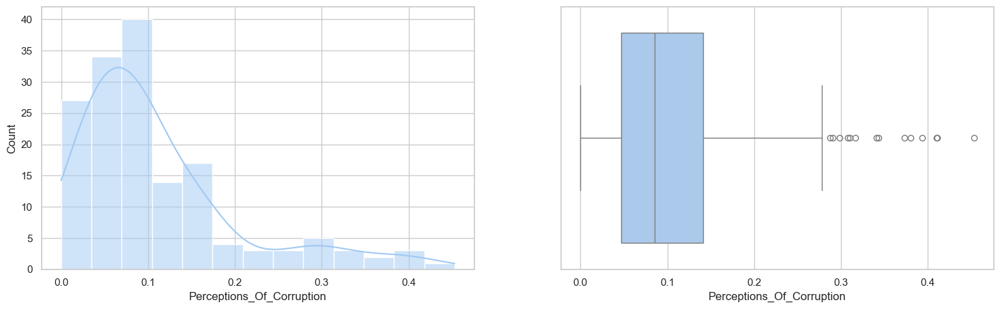

Dataset =  df_2020


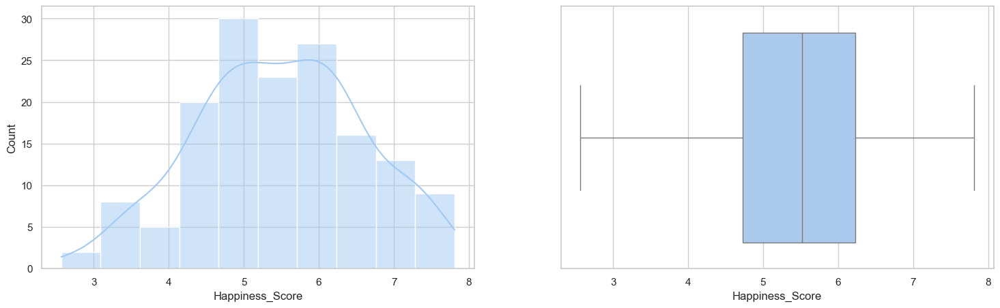

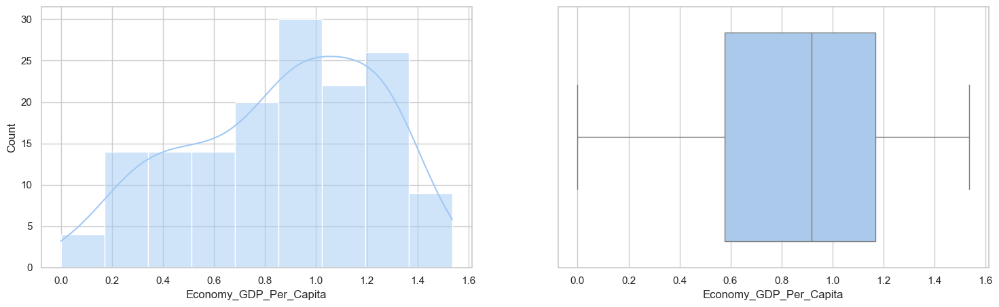

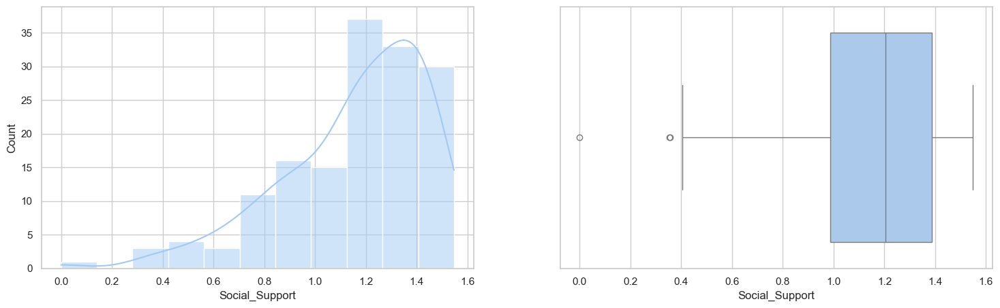

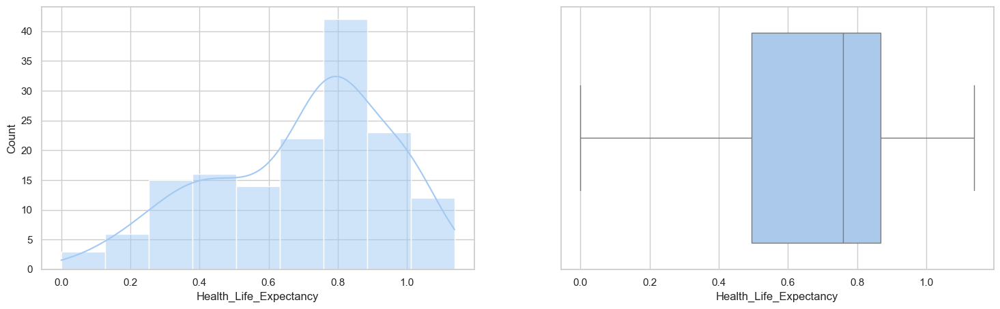

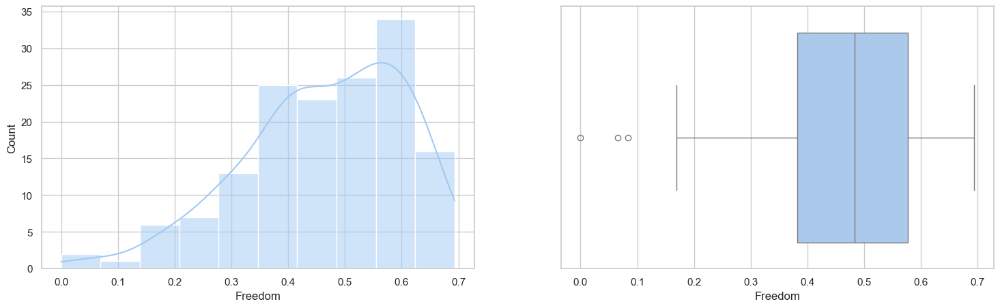

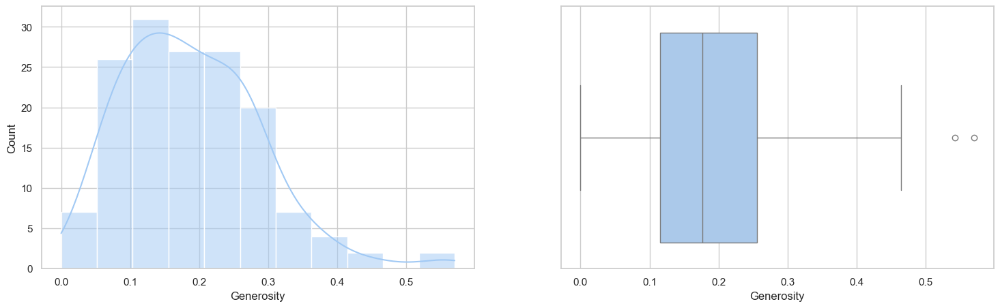

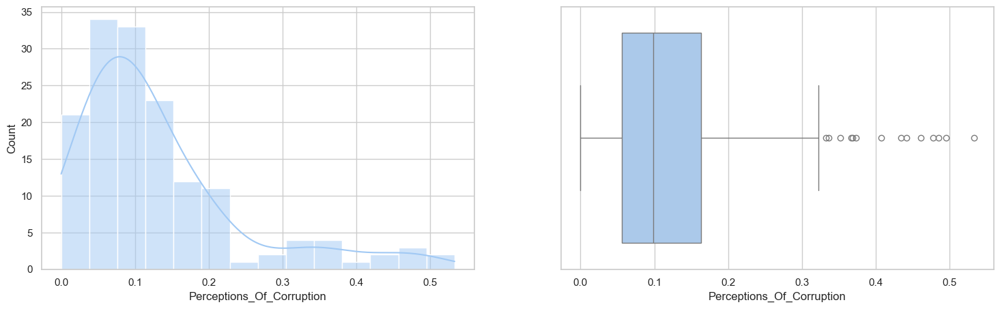

Dataset =  df_2021


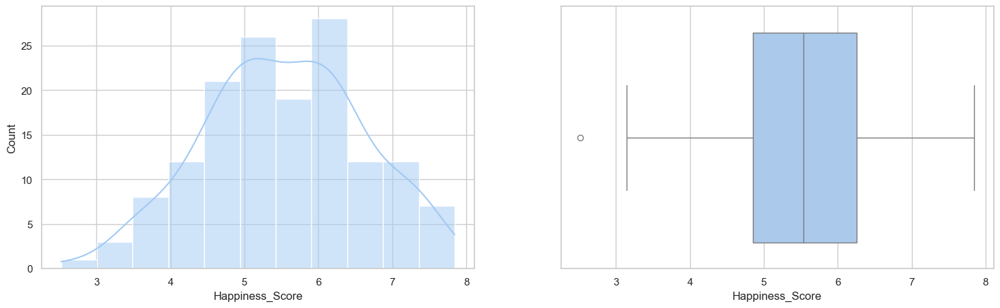

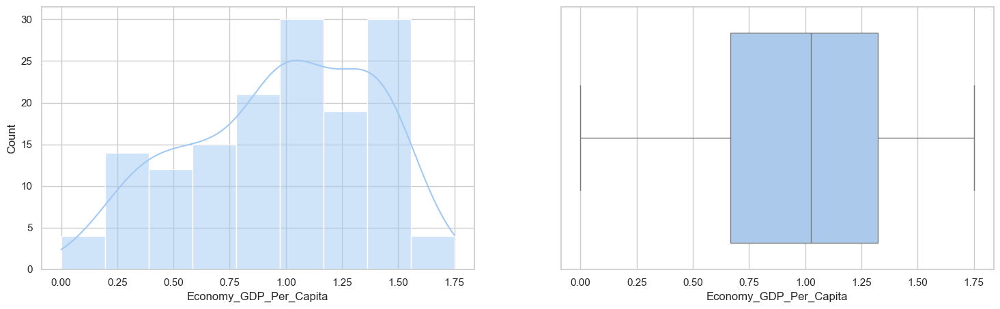

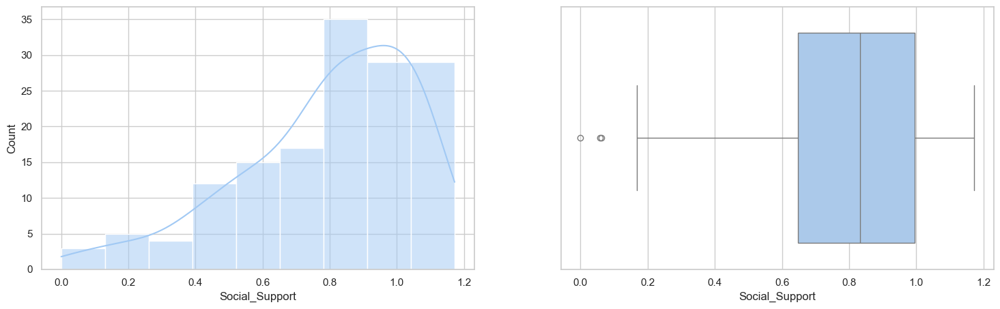

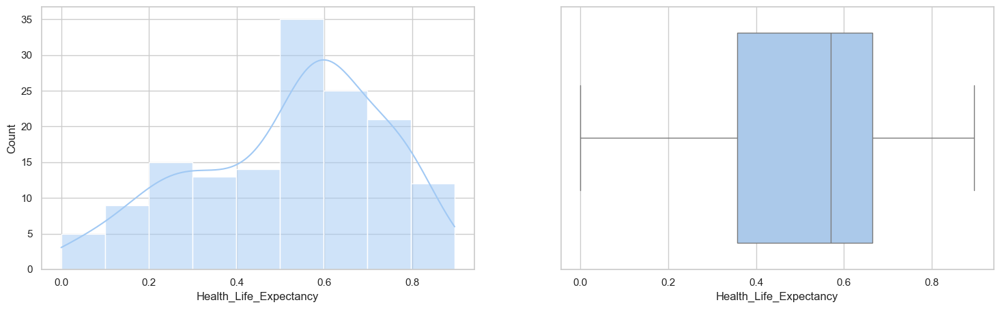

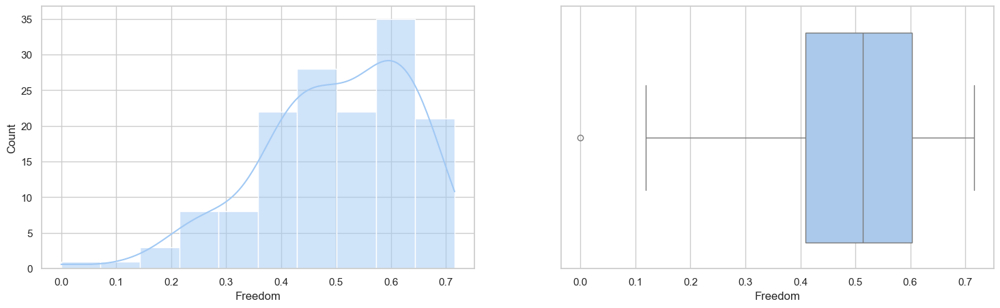

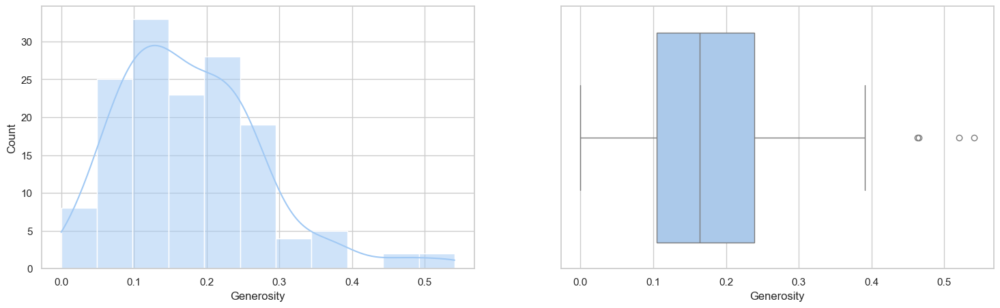

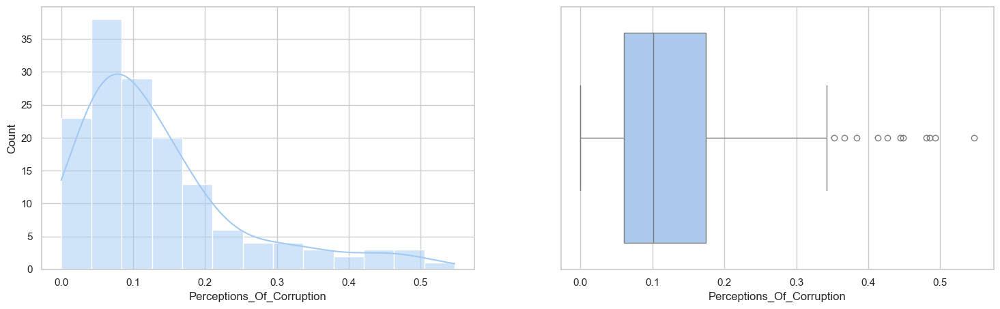

Dataset =  df_2022


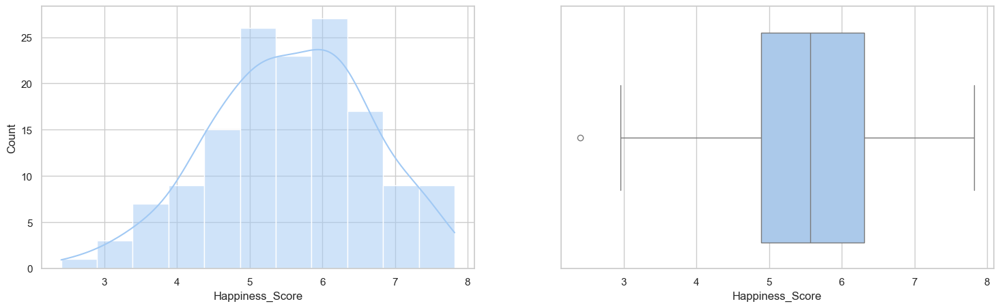

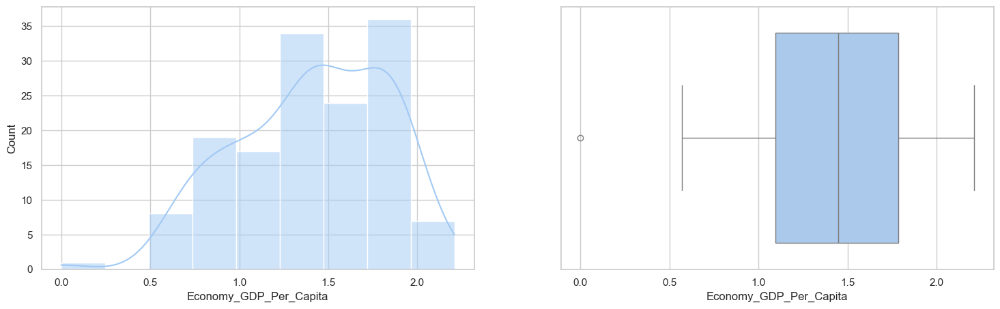

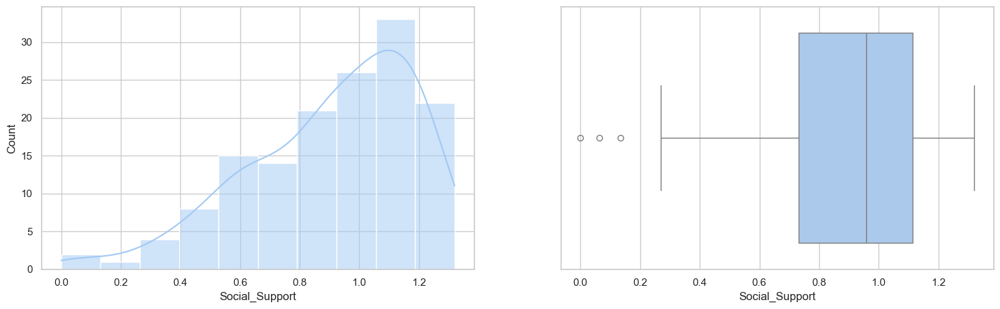

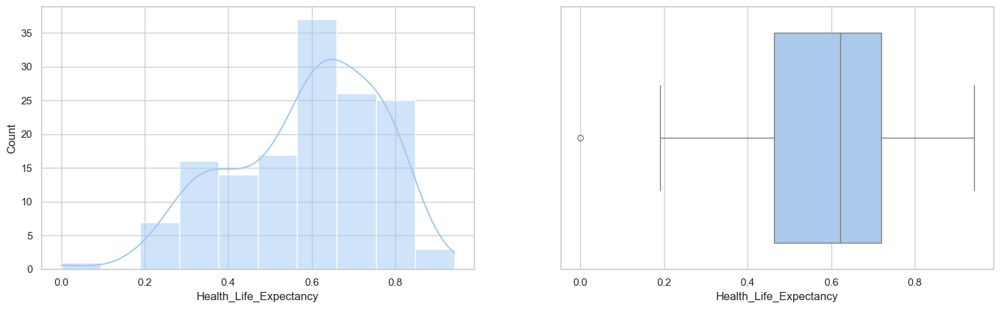

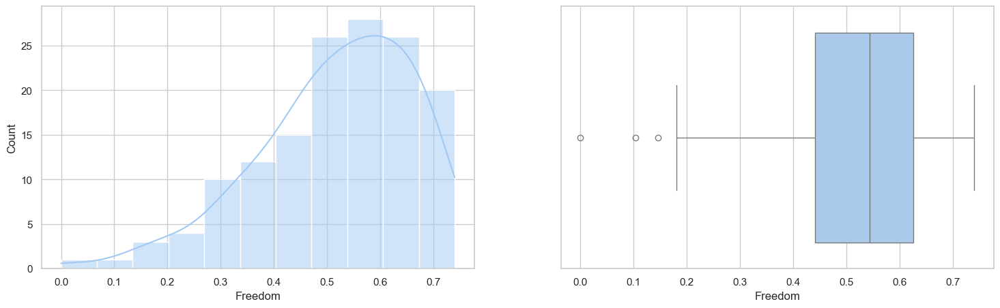

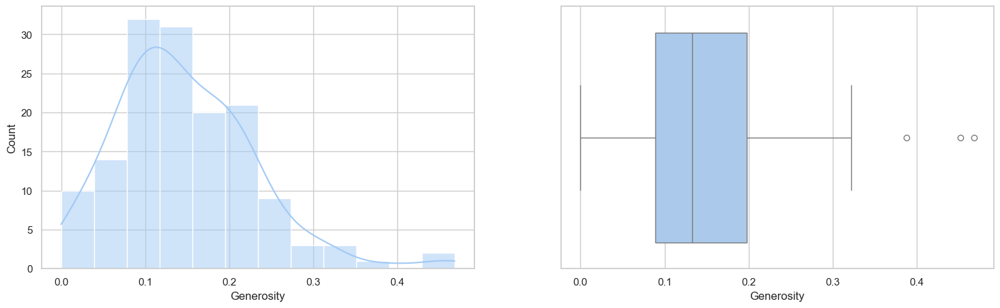

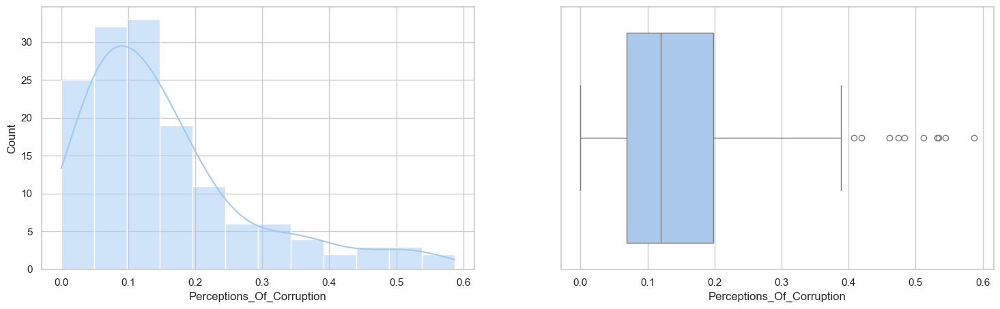

Dataset =  df_2023


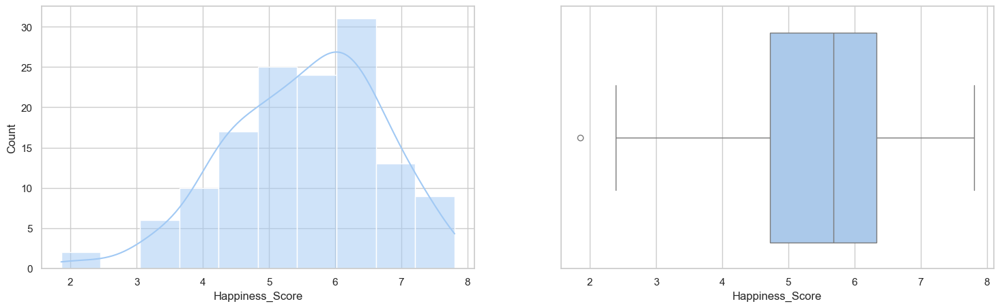

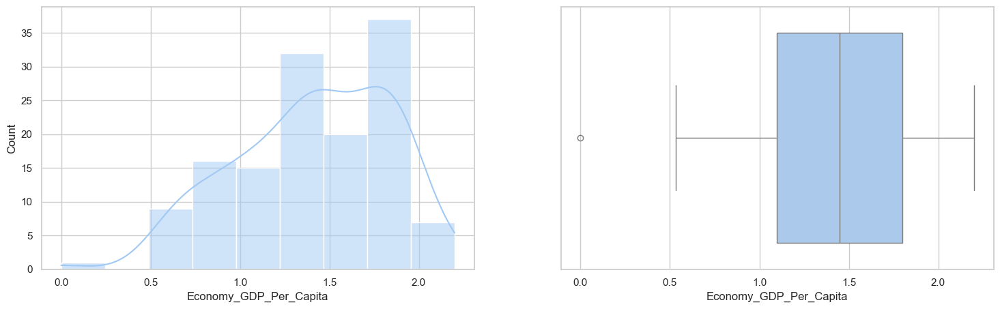

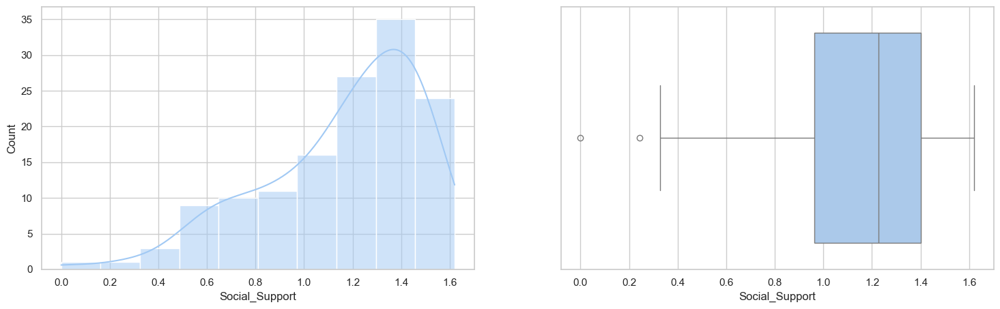

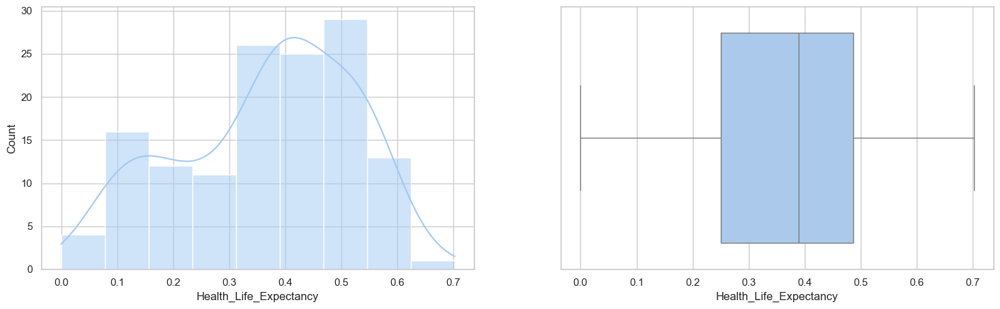

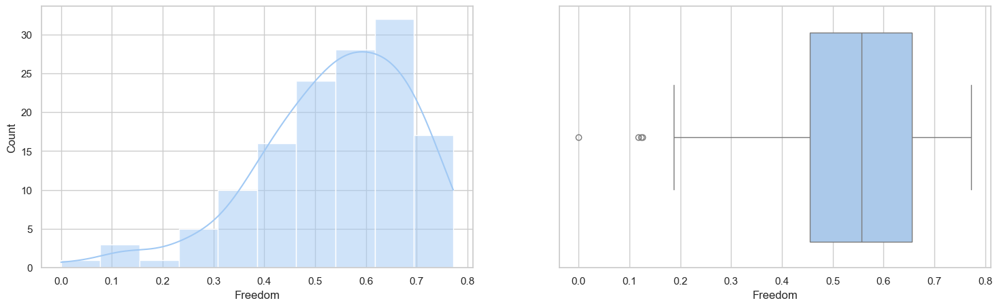

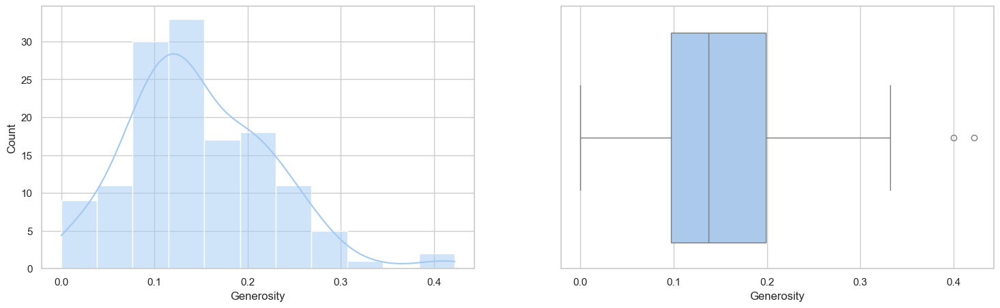

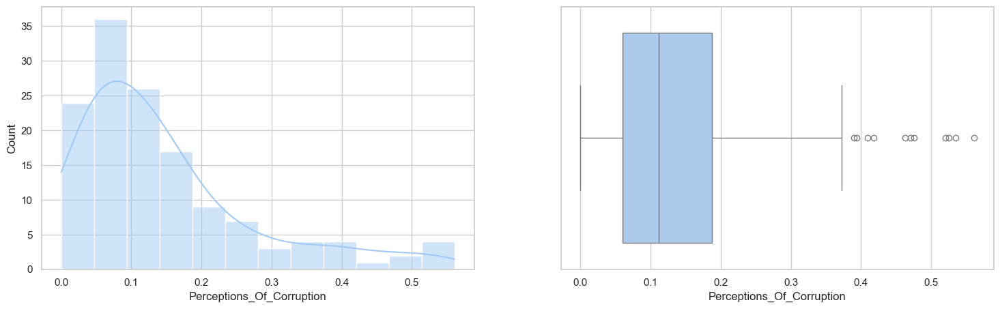

In [159]:
for i in df_list:
    print("Dataset = ", i.name)
    
    for col in numeric_cols:
        plt.figure(figsize=(18,5))
        plt.subplot(1,2,1)
        sns.histplot(i[col], kde=True)
        plt.subplot(1,2,2)
        sns.boxplot(x=col, data=i)
        plt.show()

# Analyse - Data distribution per YEAR

## Year 2015:
**After the analysis of the data we can see:** <br>
- in "Social Support", "Generosity" and “Perceptions of corruption” we’ve outliers <br>

**Data with normal distribution:** <br>
- Social Support <br>
- Freedom <br> 

## Year 2016:
**After the analysis of the data we can see:** <br>
- in "Social Support", "Generosity" and “Perceptions of corruption” we’ve outliers <br>

**Data with normal distribution:** <br>
- Happiness score <br>
- Social support <br>

## Year 2017:
**After the analysis of the data we can see:** <br>
- in "Social Support", "Generosity" and “Perceptions of corruption” we’ve outliers <br>

**Data with normal distribution:** <br>
- Happiness score <br>

## Year 2018:
**After the analysis of the data we can see:** <br>
- in “Economy GDP per capita”, "Social Support", “Freedom”, "Generosity" and “Perceptions of corruption” we’ve outliers <br>

**Data with normal distribution:** <br>
- Generosity <br>

## Year 2019:
**After the analysis of the data we can see:** <br>
- in "Social Support", “Health life expectancy”, “Freedom”, "Generosity" and “Perceptions of corruption” we’ve outliers <br>

**Data with normal distribution:** <br>
- Happiness score <br>
- Generosity <br>

## Year 2020:
**After the analysis of the data we can see:** <br>
- in "Social Support", “Freedom”, "Generosity" and “Perceptions of corruption” we’ve outliers <br>

**Data with normal distribution:** <br>
- Happiness Score <br>
- Social support <br>
- Freedom <br>

## Year 2021:
**After the analysis of the data we can see:** <br>
- in “Happiness score”, "Social Support", “Freedom”, "Generosity" and “Perceptions of corruption” we’ve outliers <br>

**Data with normal distribution:** <br>
- Happiness Score <br>
- Freedom <br> 

## Year 2022:
**After the analysis of the data we can see:** <br>
- in “Happiness Score”, “Economy GDP per capita”, "Social Support", “Health life expectancy”, “Freedom”, "Generosity" and “Perceptions of corruption” we’ve outliers <br>

**Data with normal distribution:** <br>
- Happiness Score <br>
- Economy GDP per capita <br>

## Year 2023:
**After the analysis of the data we can see:** <br>
- in “Happiness Score”, “Economy GDP per capita”, "Social Support", “Freedom”, "Generosity" and “Perceptions of corruption” we’ve outliers <br>

**Data with normal distribution:** <br>
- Economy GDP per capita <br>
- Freedom <br> 

In [160]:
df_numeric = df.select_dtypes('number') # select only numeric columns for next plots
#df_numeric = df_numeric.drop('Year')
df_numeric

,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year
0,7.804,1.888,1.585,0.535,0.772,0.126,0.535,2023
1,7.586,1.949,1.548,0.537,0.734,0.208,0.525,2023
2,7.530,1.926,1.620,0.559,0.738,0.250,0.187,2023
3,7.473,1.833,1.521,0.577,0.569,0.124,0.158,2023
4,7.403,1.942,1.488,0.545,0.672,0.251,0.394,2023
...,...,...,...,...,...,...,...,...
132,3.207,0.531,0.784,0.105,0.375,0.183,0.068,2023
133,3.204,0.758,0.881,0.069,0.363,0.112,0.117,2023
134,3.138,0.670,0.540,0.092,0.371,0.193,0.051,2023
135,2.392,1.417,0.476,0.398,0.123,0.061,0.027,2023


# PAIRPLOT
- print pairplots for each year
- delete year columns from plot

<Figure size 1000x1000 with 0 Axes>

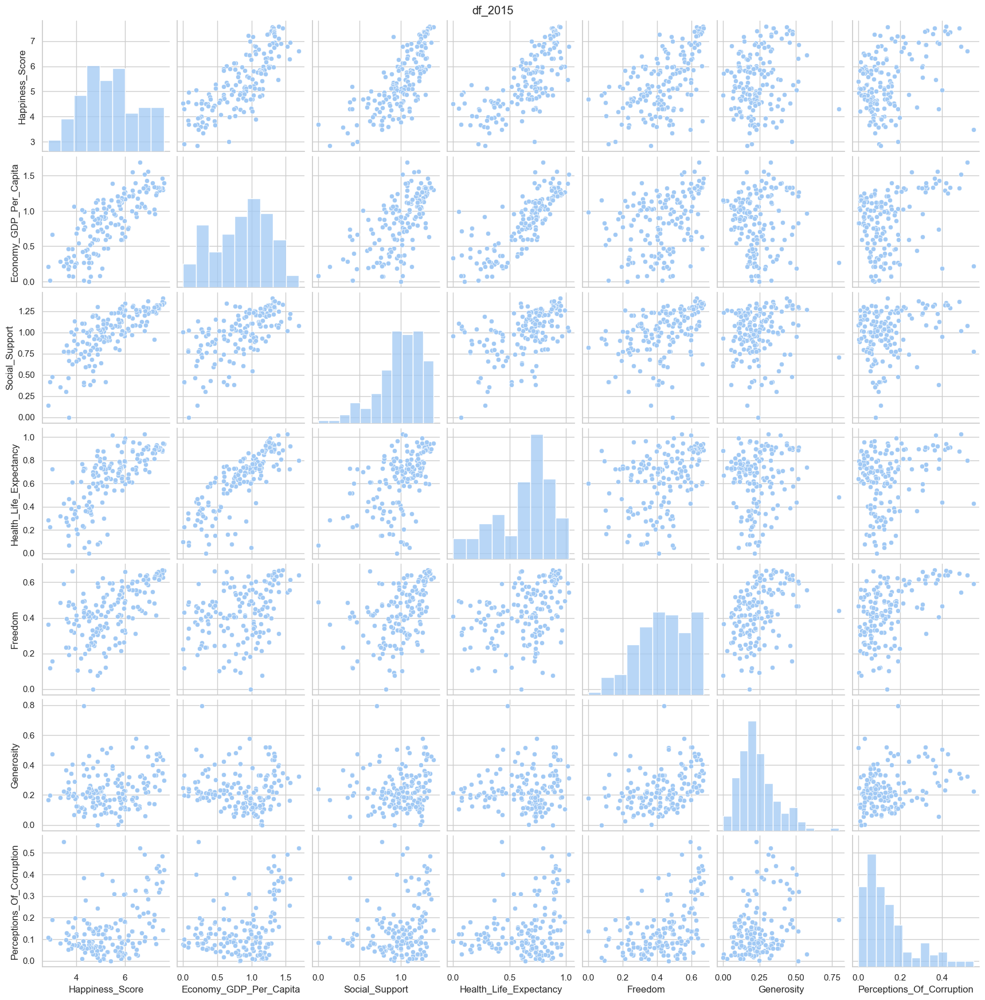

<Figure size 1000x1000 with 0 Axes>

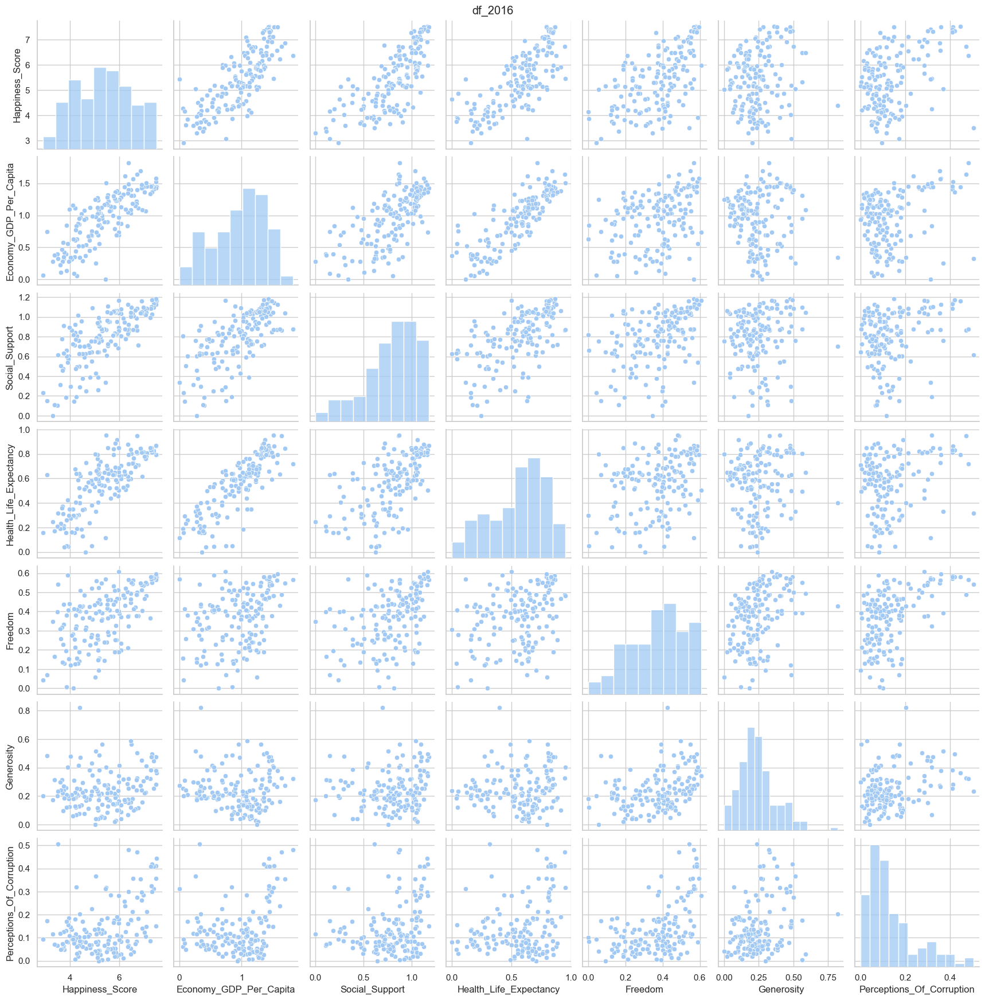

<Figure size 1000x1000 with 0 Axes>

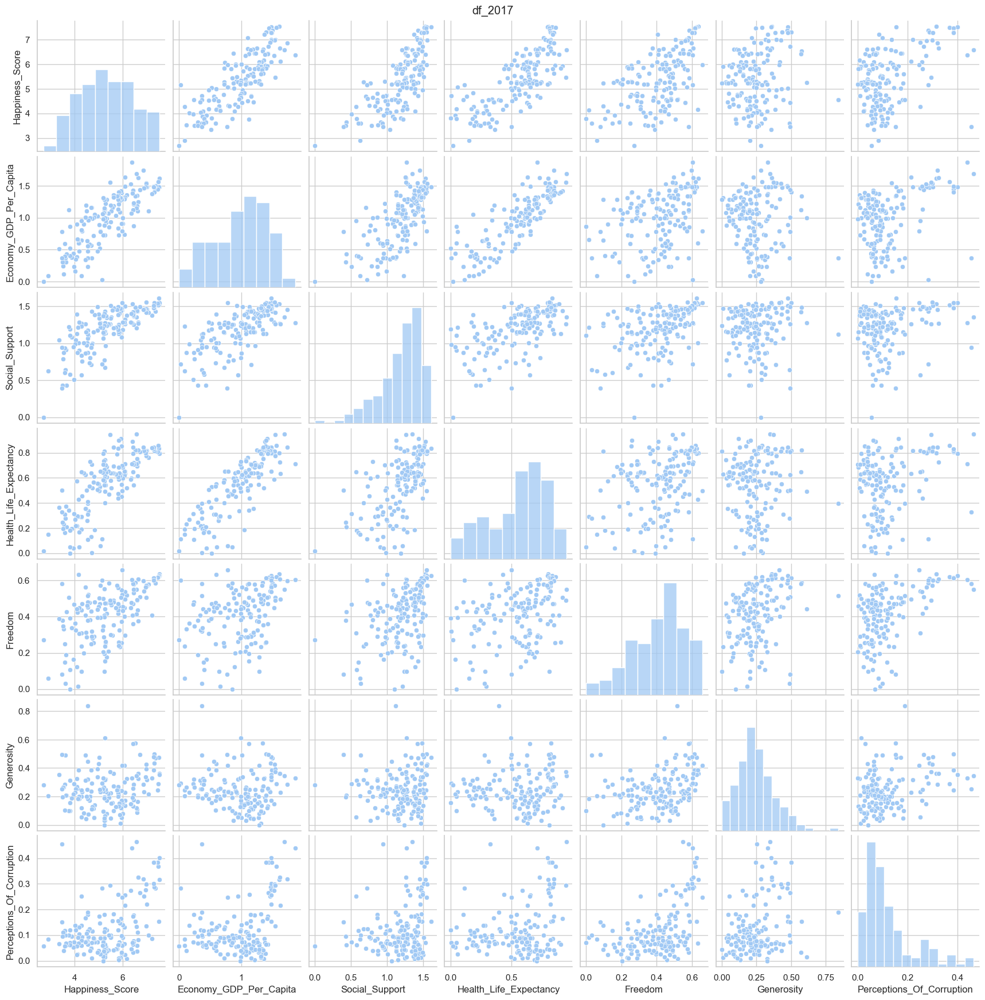

<Figure size 1000x1000 with 0 Axes>

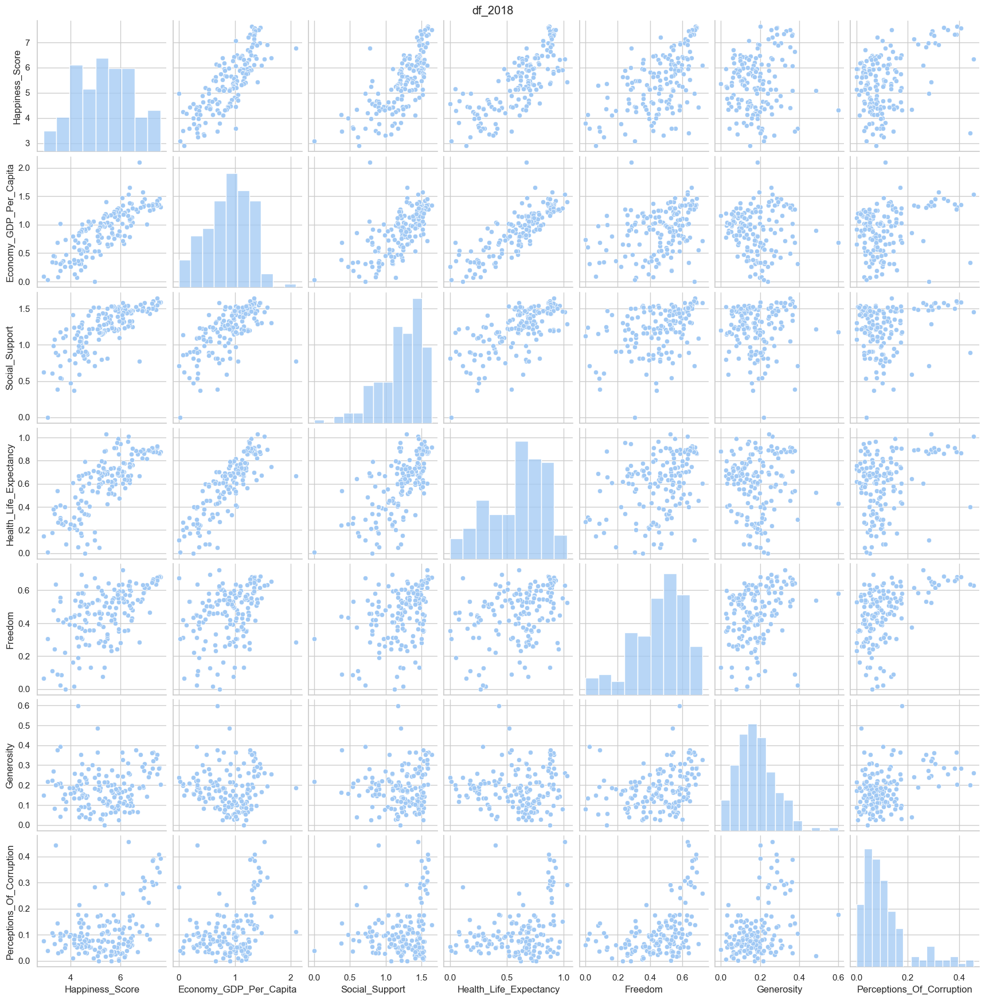

<Figure size 1000x1000 with 0 Axes>

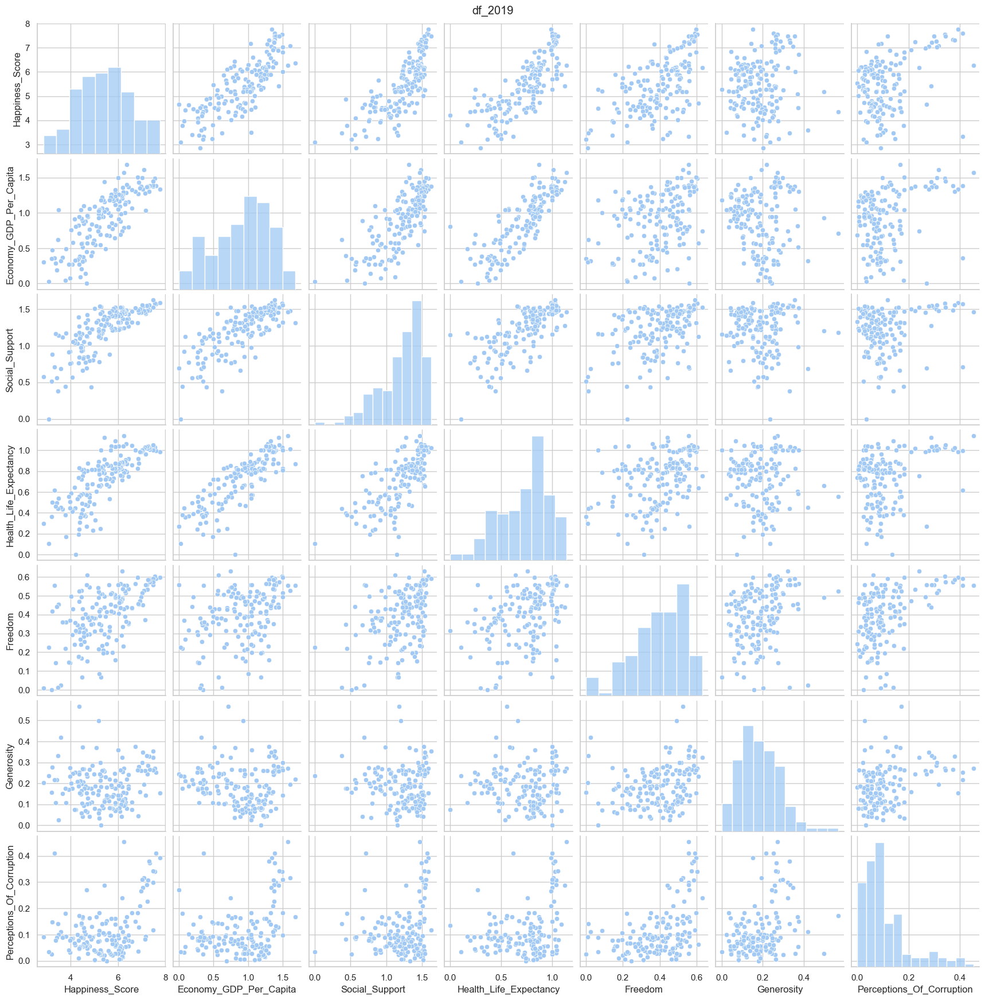

<Figure size 1000x1000 with 0 Axes>

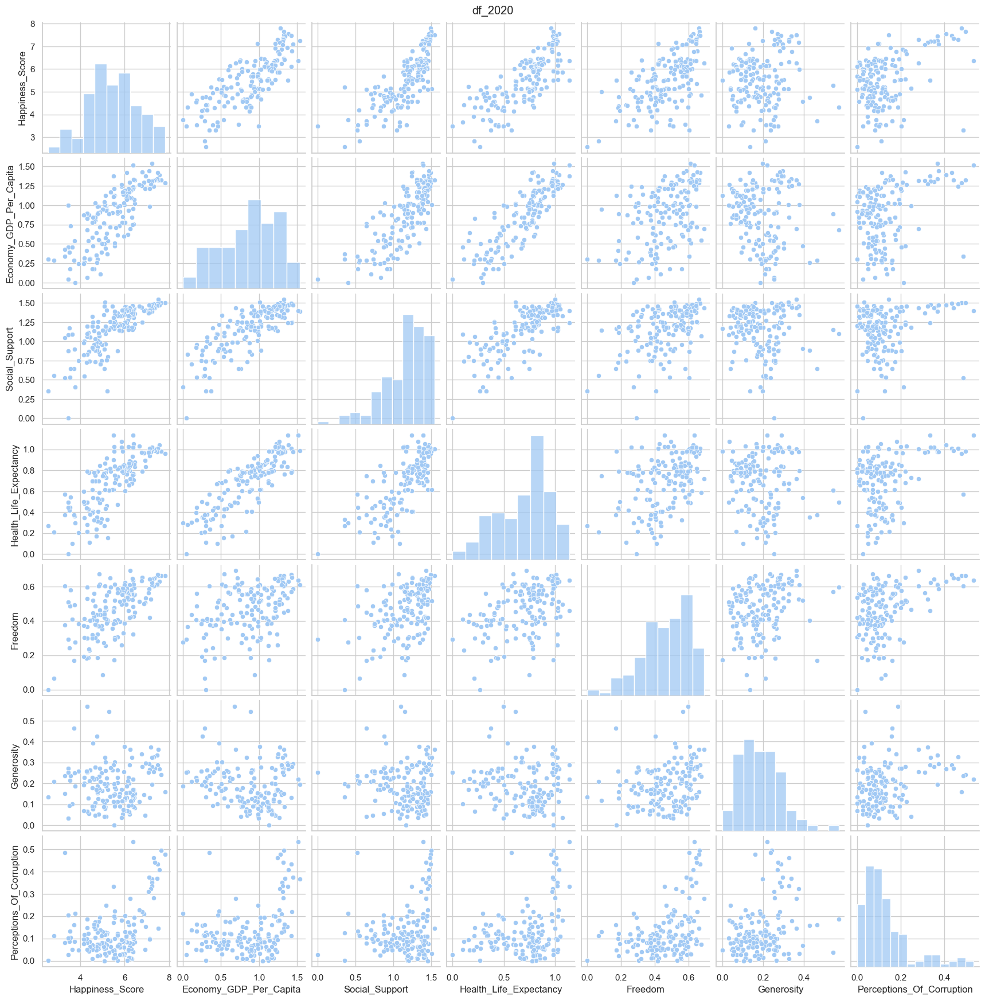

<Figure size 1000x1000 with 0 Axes>

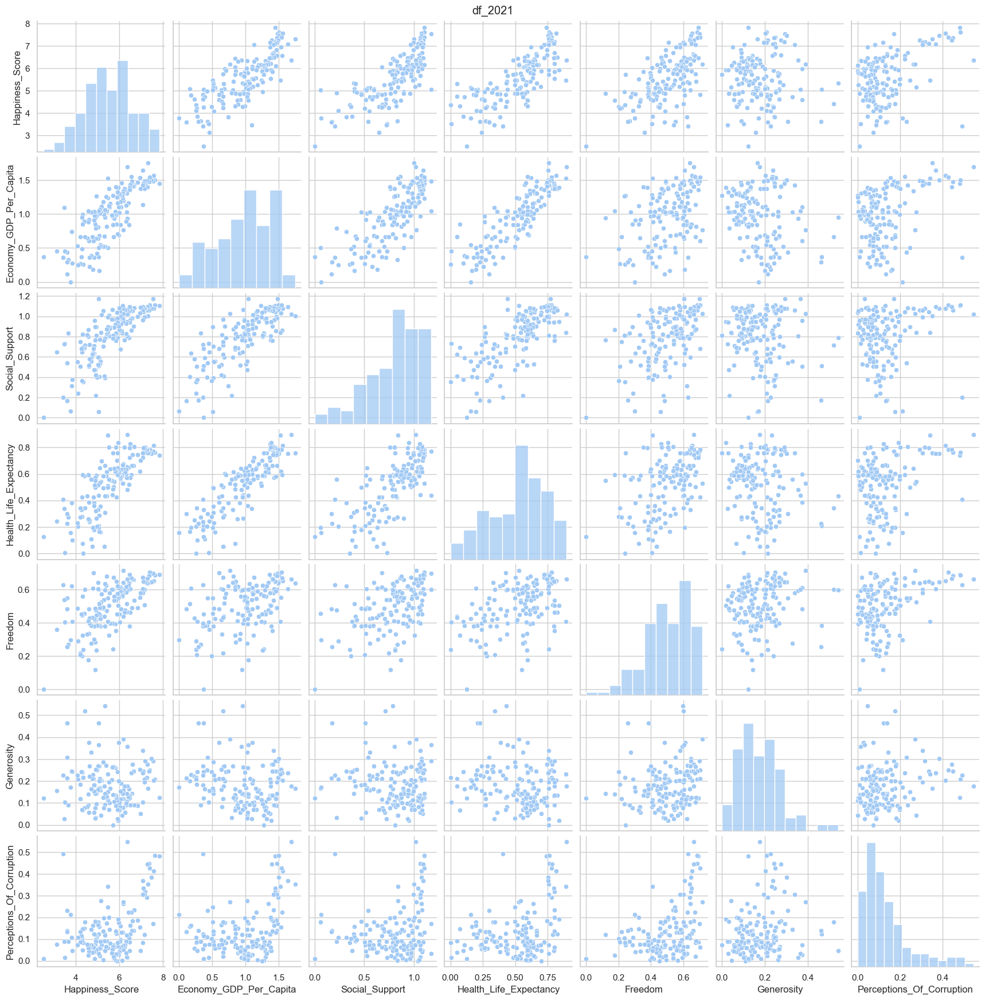

<Figure size 1000x1000 with 0 Axes>

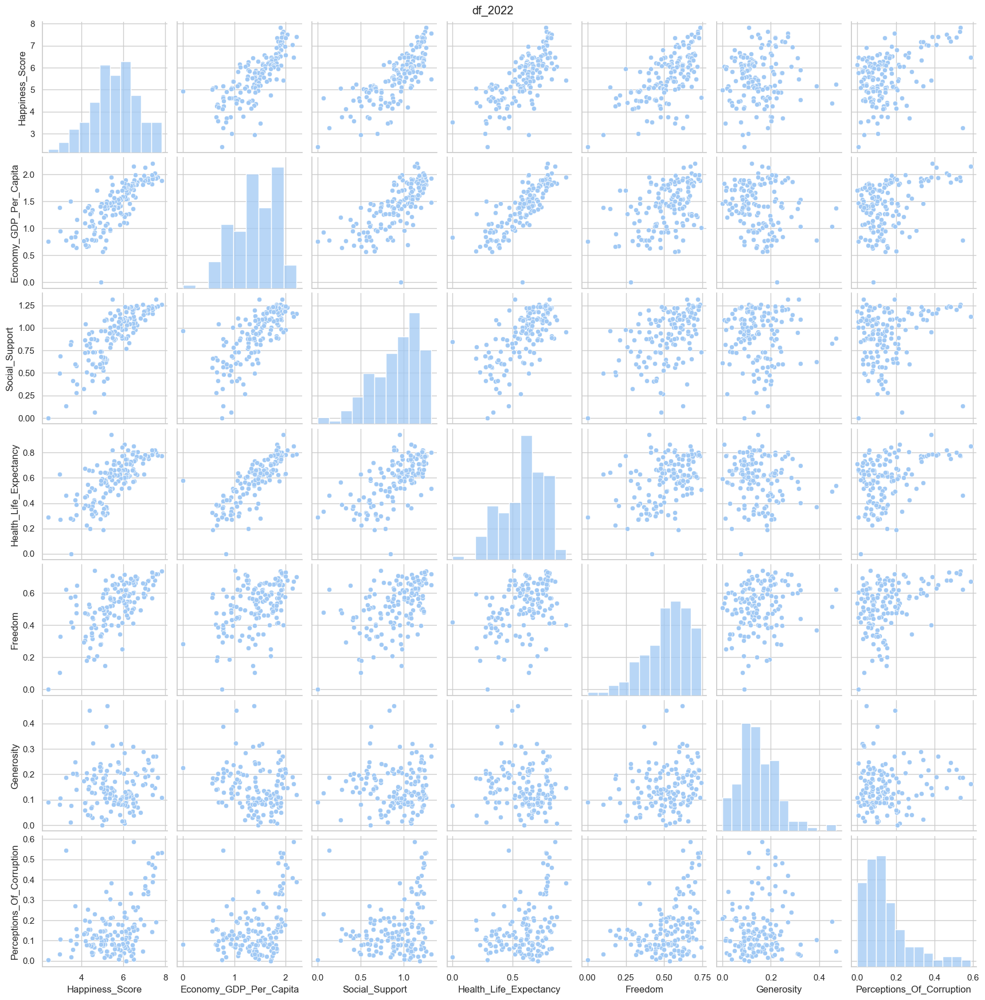

<Figure size 1000x1000 with 0 Axes>

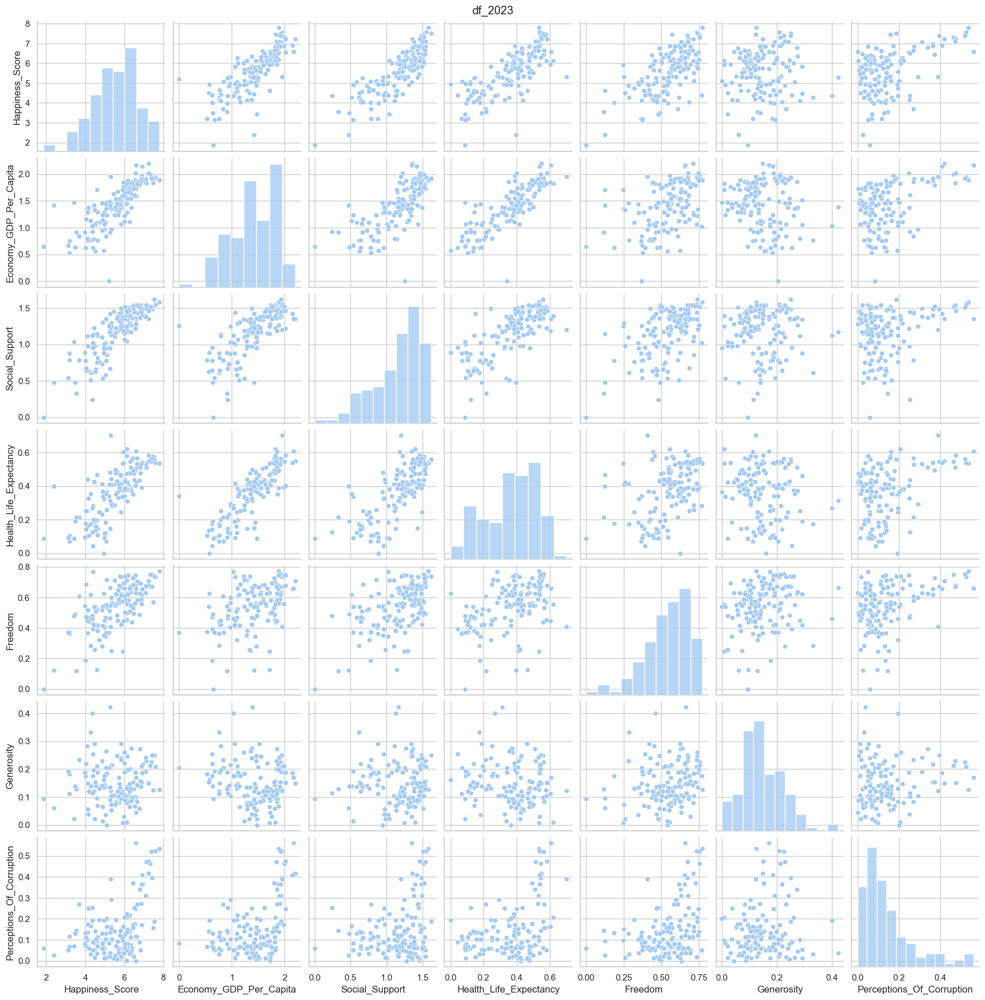

In [161]:
for i in df_list:
    df_numeric = i.select_dtypes('number')                             # select only numeric columns for next plots
    df_numeric.drop(df_numeric.columns[[7]], axis = 1, inplace = True) # delete year column 
    plt.figure(figsize=(10,10))                                        # size of plot 
    sns.pairplot(df_numeric)                                           # plot only numeric columns
    plt.suptitle(i.name, y = 1)                                        # set title

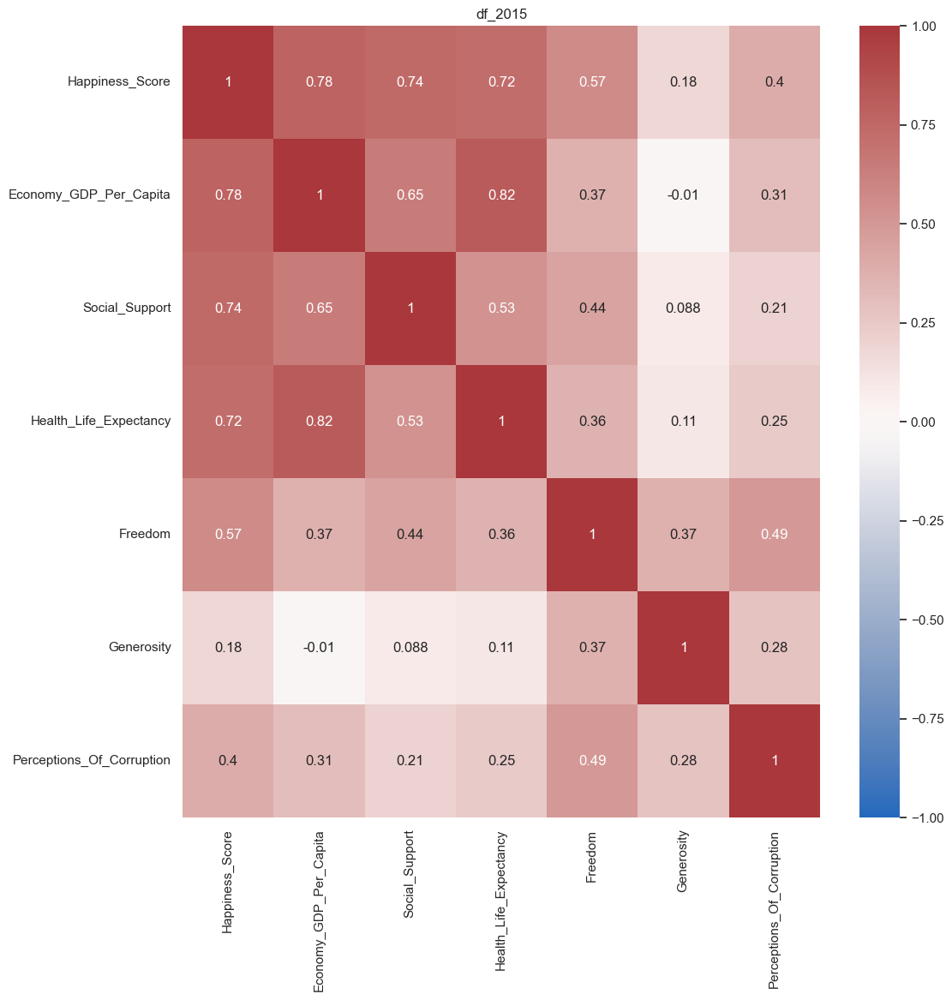

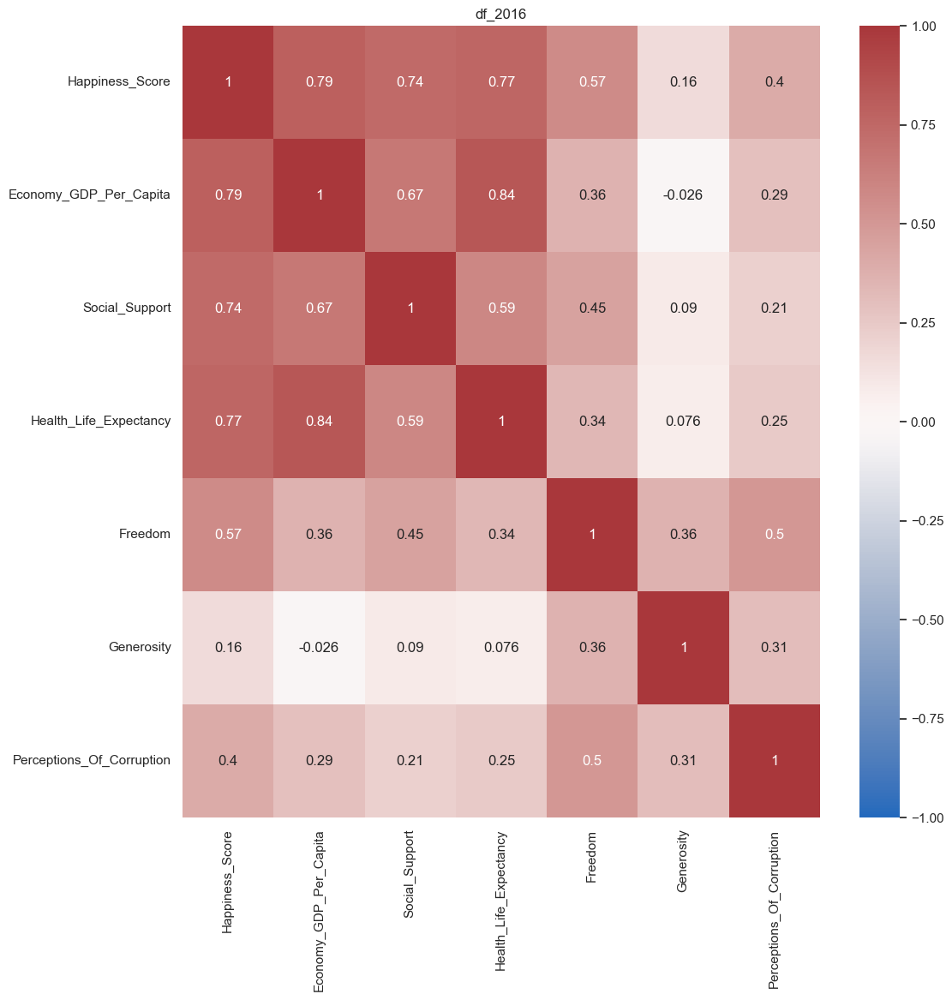

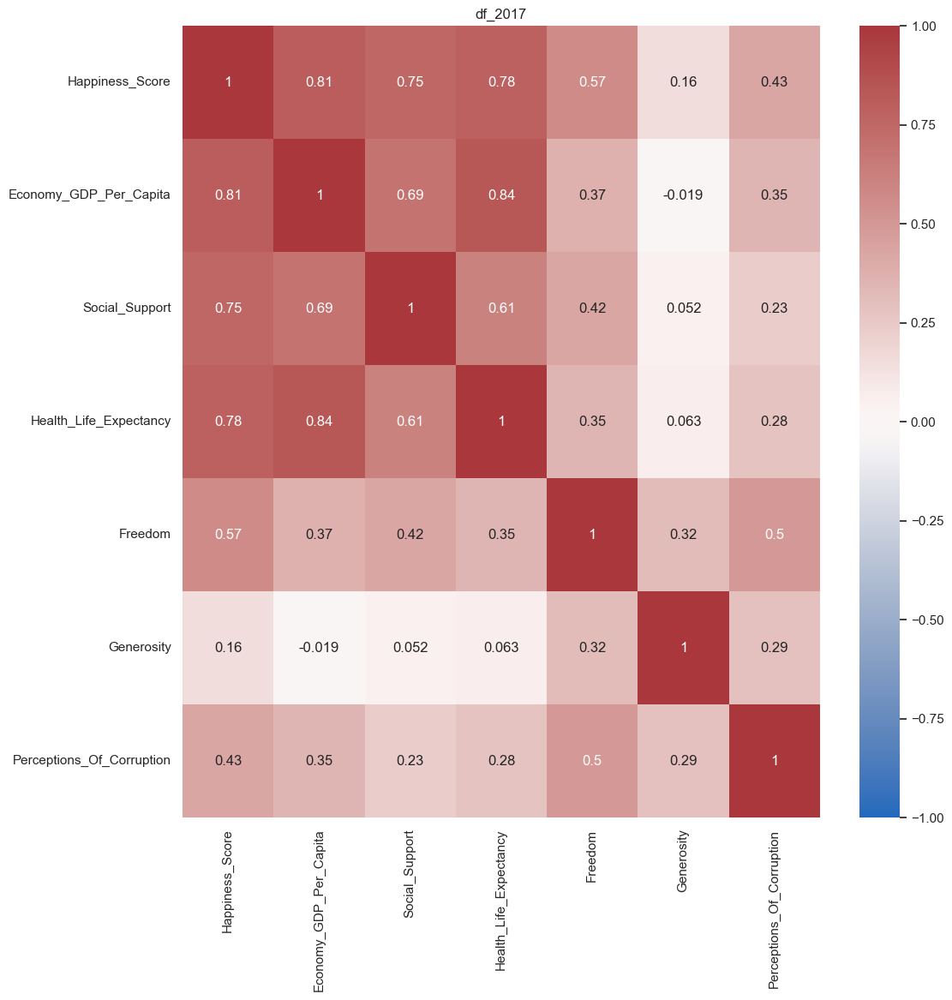

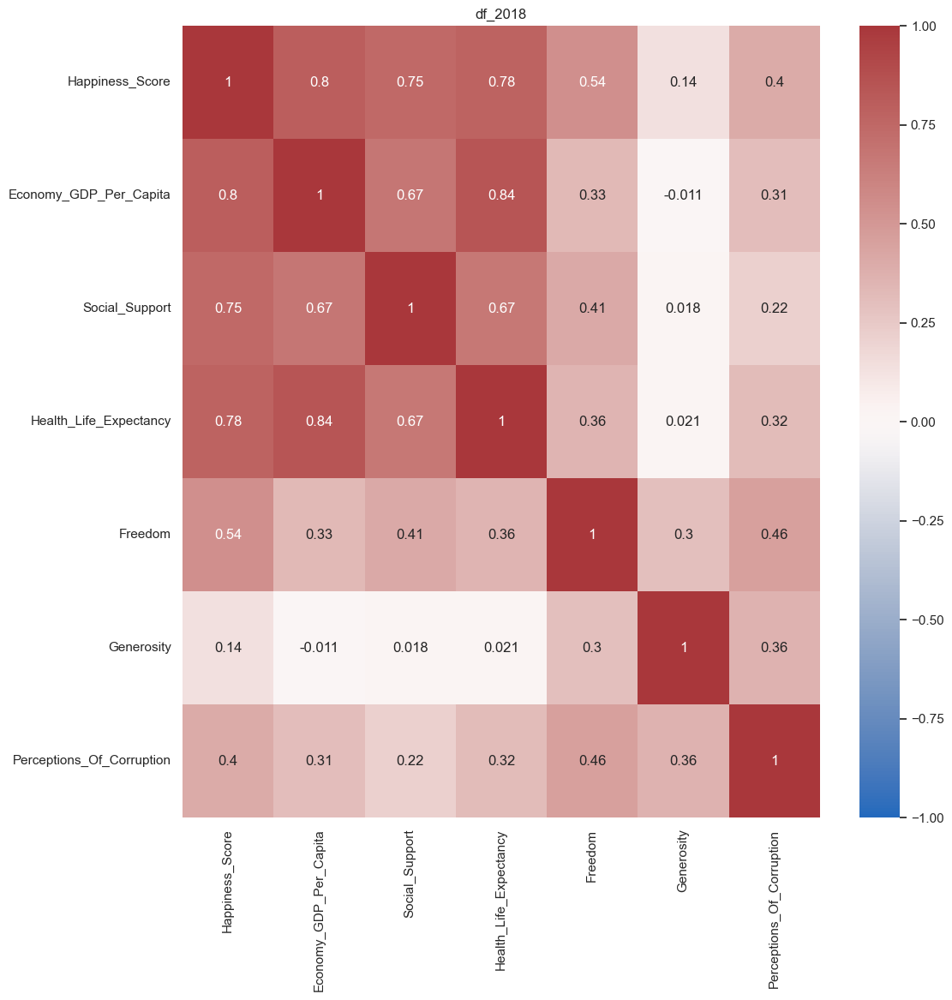

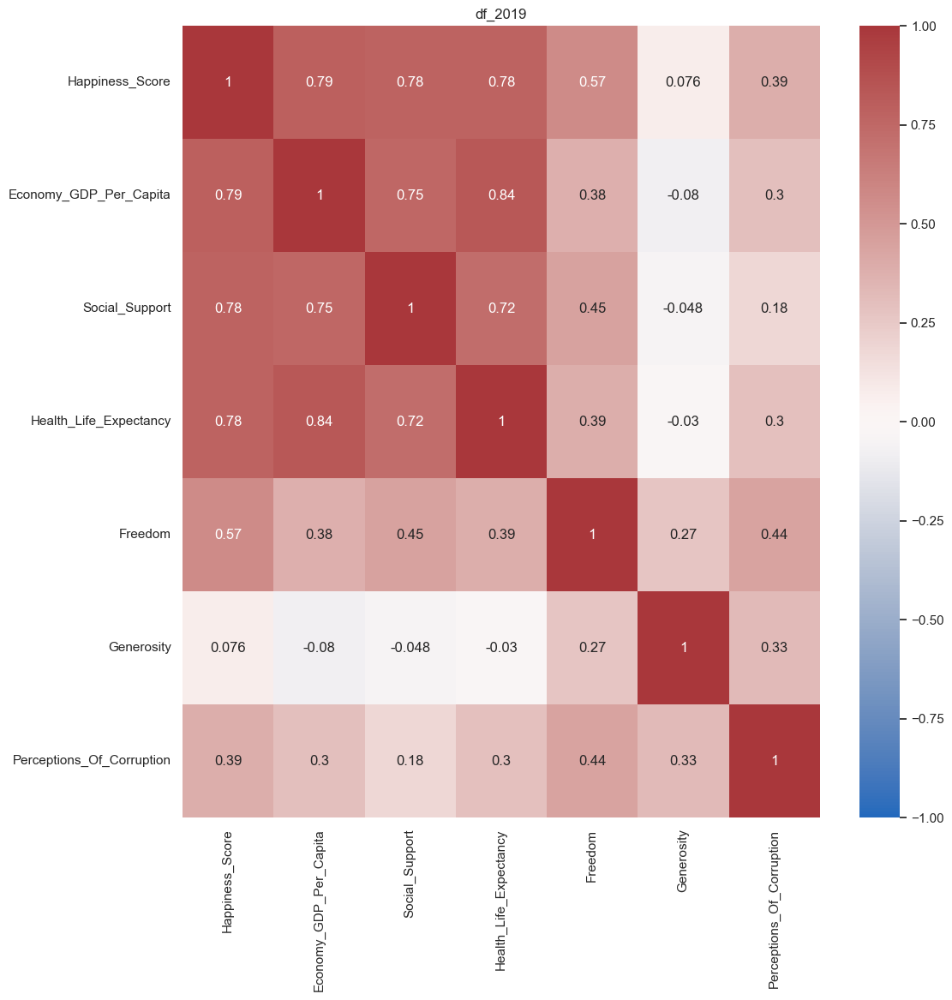

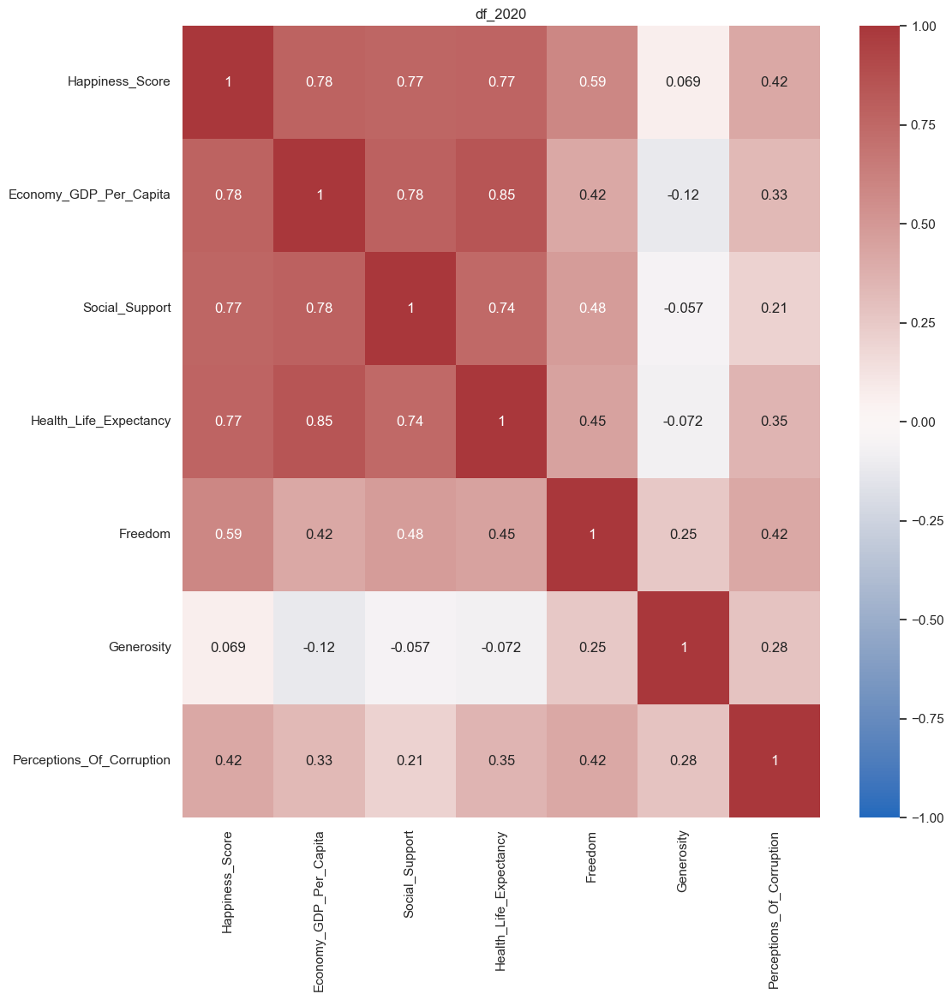

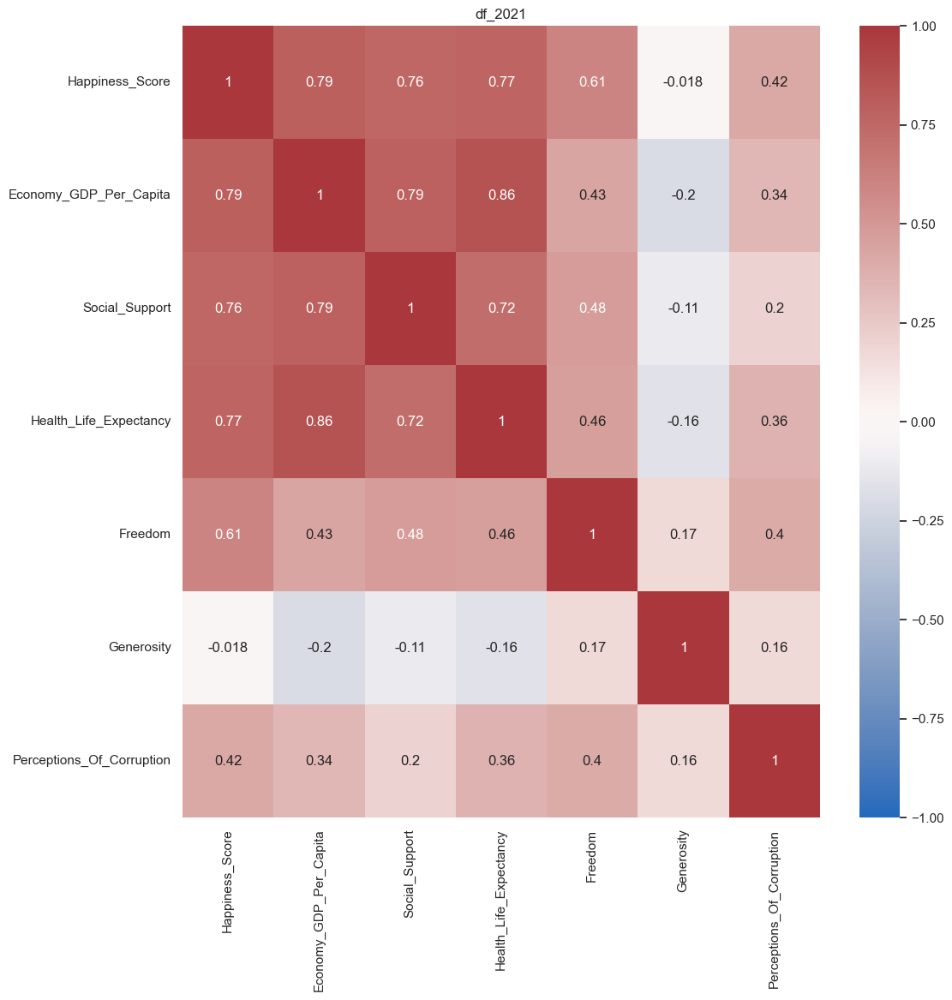

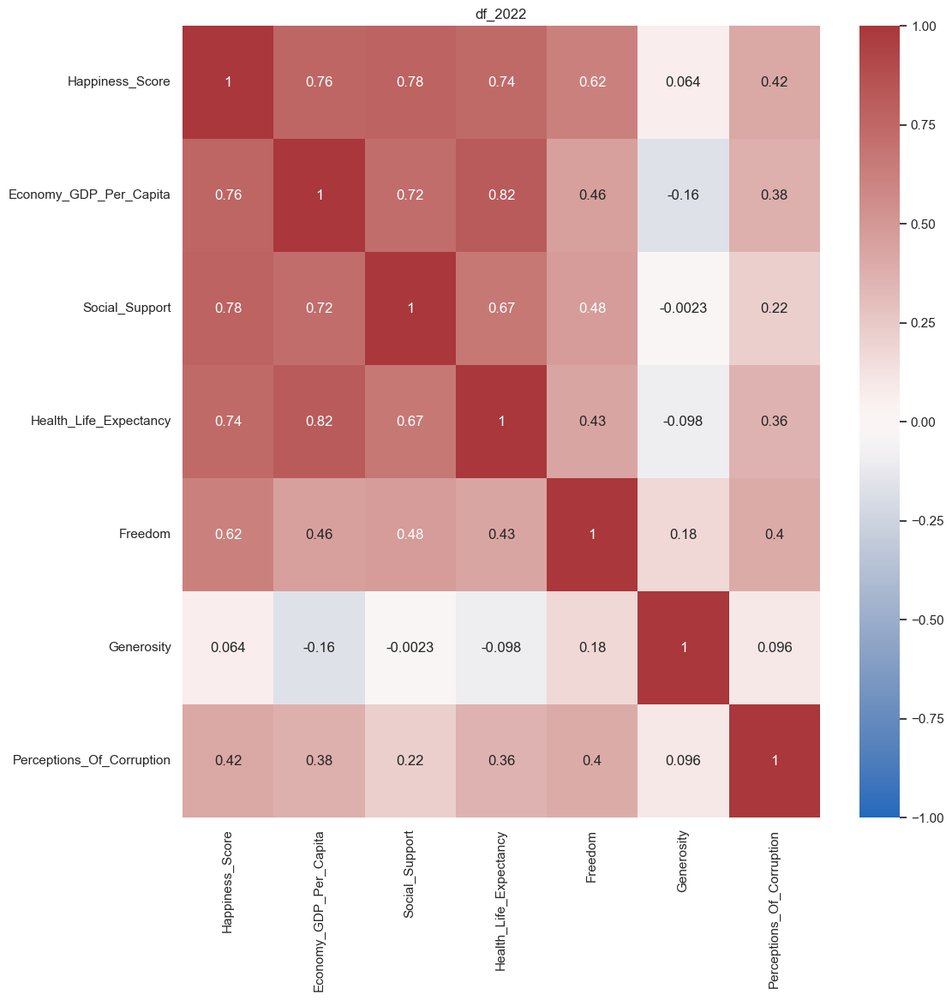

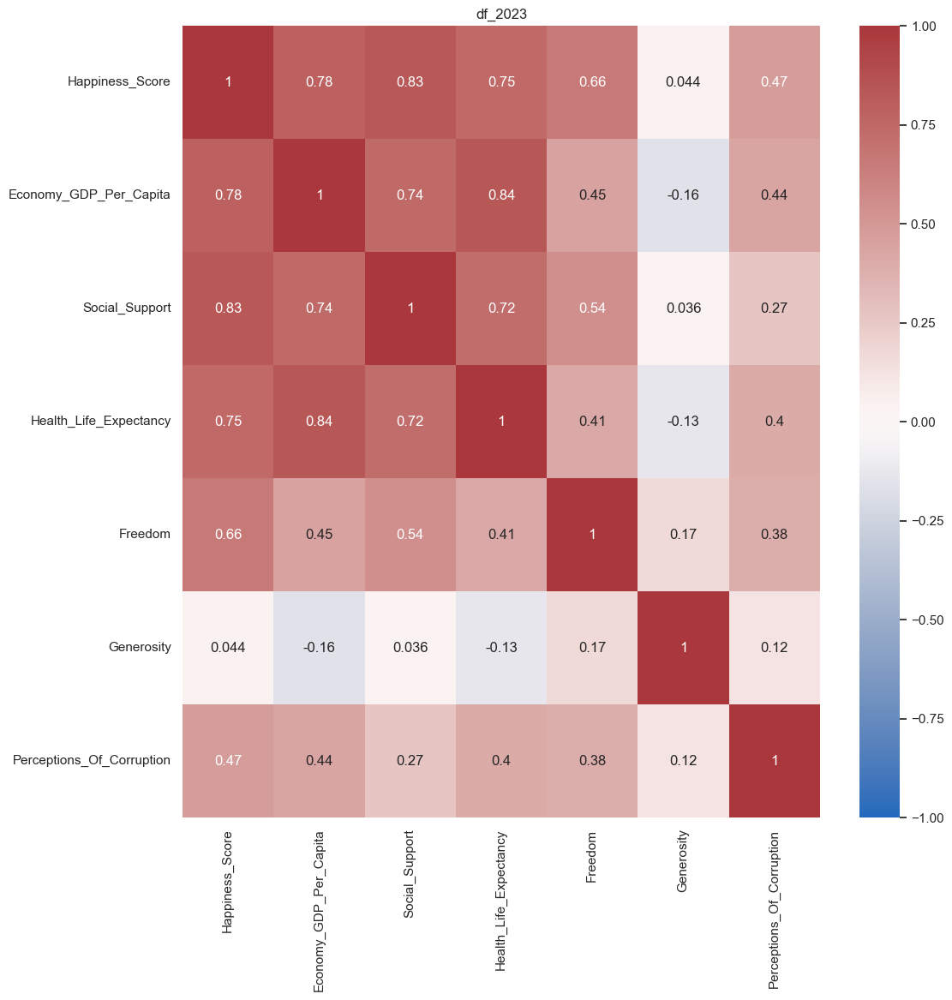

In [162]:
for i in df_list:
    df_numeric = i.select_dtypes('number')                             # select only numeric columns for next plots
    df_numeric.drop(df_numeric.columns[[7]], axis = 1, inplace = True) # delete year column 
    plt.figure(figsize=(12,12))                                        # size of plot
    ax = plt.axes()
    sns.heatmap(df_numeric.corr(),                                     # heatmap
                cbar=True, 
                annot=True, 
                cmap='vlag', 
                vmin = -1, 
                vmax = 1)
    ax.set_title(i.name, y = 1)                                        # title of heatmap

# Positive and negative correlations:

### Year 2015
- **Happiness Score:** we can see only positive correlations. With Generosity and Perception of corruption is the correlation very low. <br>
- **Economy GDP per capita:** We have a positive correlation with happiness score, social support and health life expectancy. For Freedom and perception of corruption we have a very low positive correlation. With generosity we have an extremely low negative correlation. <br>
- **Social Support:** We have a positive correlation with all other columns. We can say that the positive correlation with perception of corruption and generosity is extremely low. <br>  
- **Health life expectancy:** We have a strong positive correlation with happiness score and economy GDP per capita. With other columns we have also a positive correlation, but not so strong. <br> 
- **Freedom:** We have a positive correlation with all columns, but this correlation isn’t strong. <br>
- **Generosity:** We have a very weak negative correlation with economy GDP per capita. With other columns we have a weak positive correlation. <br> 
- **Perceptions of corruption:** We have here a positive correlation with all columns. This correlation is not strong. <br>

### Year 2016
- **Happiness Score:** we can see only positive correlations. With Generosity and Perception of corruption is the correlation very low. <br>
- **Economy GDP per capita:** We have a positive correlation with happiness score, social support and health life expectancy. For Freedom and perception of corruption we have a low positive correlation. With generosity we have an extremely low negative correlation. <br>
- **Social Support:** We have a positive correlation with all other columns. We can say that the positive correlation with perception of corruption and generosity is extremely low. <br>  
- **Health life expectancy:** We have a strong positive correlation with happiness score and economy GDP per capita. With other columns we have also a positive correlation, but not so strong. <br> 
- **Freedom:** We have a positive correlation with all columns, but this correlation isn’t strong. <br>
- **Generosity:** We have a very weak negative correlation with economy GDP per capita. With other columns we have a weak positive correlation. <br> 
- **Perceptions of corruption:** We have here a positive correlation with all columns. This correlation is not strong. <br>

### Year 2017
- **Happiness Score:** we can see only positive correlations. With Generosity and Perception of corruption is the correlation very low. <br>
- **Economy GDP per capita:** We have a positive correlation with happiness score, social support and health life expectancy. For Freedom and perception of corruption we have a very low positive correlation. With generosity we have an extremely low negative correlation. <br>
- **Social Support:** We have a positive correlation with all other columns. We can say that the positive correlation with perception of corruption and generosity is extremely low. <br>  
- **Health life expectancy:** We have a strong positive correlation with happiness score, economy GDP per capita and social support. With other columns we have also a positive correlation, but not so strong. <br> 
- **Freedom:** We have a positive correlation with all columns, but this correlation isn’t strong. <br>
- **Generosity:** We have a very weak negative correlation with economy GDP per capita. With other columns we have a weak positive correlation. <br> 
- **Perceptions of corruption:** We have here a positive correlation with all columns. This correlation is not strong. <br>

### Year 2018
- **Happiness Score:** we can see only positive correlations. With Generosity and Perception of corruption is the correlation very low. <br>
- **Economy GDP per capita:** We have a positive correlation with happiness score, social support and health life expectancy. For Freedom and perception of corruption we have a very low positive correlation. With generosity we have an extremely low negative correlation. <br>
- **Social Support:** We have a positive correlation with all other columns. We can say that the positive correlation with perception of corruption and generosity is extremely low. <br>  
- **Health life expectancy:** We have a strong positive correlation with happiness score, economy GDP per capita and social support. With other columns we have also a positive correlation, but not so strong. <br> 
- **Freedom:** We have a positive correlation with all columns, but this correlation isn’t strong. <br>
- **Generosity:** We have a very weak negative correlation with economy GDP per capita. With other columns we have a weak positive correlation. <br> 
- **Perceptions of corruption:** We have here a positive correlation with all columns. This correlation is not strong. <br>

### Year 2019
- **Happiness Score:** we can see only positive correlations. With Generosity is the correlation very low. <br>
- **Economy GDP per capita:** We have a positive correlation with happiness score, social support and health life expectancy. For Freedom and perception of corruption we have a very low positive correlation. With generosity we have an extremely low negative correlation. <br>
- **Social Support:** We have here a negative correlation with generosity. With all other columns we have a positive correlation. We can say that the positive correlation with perception of corruption is extremely low. <br>  
- **Health life expectancy:** We have a strong positive correlation with happiness score, economy GDP per capita and social support.  With generosity we have a negative correlation. With other columns we have also a positive correlation, but not so strong. <br> 
- **Freedom:** We have a positive correlation with all columns, but this correlation isn’t strong. <br>
- **Generosity:** We have a very weak negative correlation with economy GDP per capita, social support and health life expectancy. With other columns we have a weak positive correlation. <br> 
- **Perceptions of corruption:** We have here a positive correlation with all columns. This correlation is not strong. <br>

### Year 2020
- **Happiness Score:** we can see only positive correlations. With Generosity is the correlation very low. <br>
- **Economy GDP per capita:** We have a positive correlation with happiness score, social support and health life expectancy. For Freedom and perception of corruption we have a lower positive correlation. With generosity we have a negative correlation. <br>
- **Social Support:** We have a negative correlation with Generosity. With other columns we have a positive correlation. <br>  
- **Health life expectancy:** We have a strong positive correlation with happiness score, economy GDP per capita and social support. With generosity we have a negative correlation. With other columns we have also a positive correlation, but not so strong. <br> 
- **Freedom:** We have a positive correlation with all columns, but this correlation isn’t strong. <br>
- **Generosity:** We have a weak negative correlation with economy GDP per capita, social support and health live expectancy. With other columns we have a weak positive correlation. <br>
- **Perceptions of corruption:** We have here a positive correlation with all columns. This correlation is not strong. <br>

### Year 2021
- **Happiness Score:** With generosity we have a negative correlation. With others, we have a positive correlation. With Perception of corruption is the correlation low. <br>
- **Economy GDP per capita:** We have a positive correlation with happiness score, social support and health life expectancy. For Freedom and perception of corruption we have a low positive correlation. With generosity we have a low negative correlation. <br>
- **Social Support:** We have a negative correlation with generosity. With all other columns we have a positive correlation. We can say that the positive correlation with perception of corruption is low. <br> 
- **Health life expectancy:** We have a strong positive correlation with happiness score, economy GDP per capita and social support. With generosity we have a negative correlation. With other columns we have also a positive correlation, but not so strong. <br> 
- **Freedom:** We have a positive correlation with all columns, but this correlation isn’t strong. <br>
- **Generosity:** We have a very weak negative correlation with happiness score, economy GDP per capita, social support and health life expectancy. Only with freedom and perception of corruption we have a low positive correlation. <br> 
- **Perceptions of corruption:** We have here a positive correlation with all columns. This correlation is not strong. <br>

### Year 2022
- **Happiness Score:** we can see only positive correlations. With Generosity and is the correlation very low. <br>
- **Economy GDP per capita:** We have a positive correlation with happiness score, social support and health life expectancy. For Freedom and perception of corruption we have also a positive correlation. With generosity we have a low negative correlation. <br>
- **Social Support:** With perception of corruption, we have a negative correlation. We have a positive correlation with all other columns. <br> 
- **Health life expectancy:** We have a strong positive correlation with happiness score, economy GDP per capita and social support. With other columns we have also a positive correlation, but not so strong. <br> 
- **Freedom:** We have a positive correlation with all columns, but this correlation isn’t strong. <br>
- **Generosity:** We have a very weak negative correlation with economy GDP per capita, social support and health life expectancy. With other columns we have a weak positive correlation. <br> 
- **Perceptions of corruption:** We have here a positive correlation with all columns. This correlation is not strong. <br>

### Year 2023
- **Happiness Score:** we can see only positive correlations. With Generosity is the correlation very low. <br>
- **Economy GDP per capita:** We have a positive correlation with happiness score, social support and health life expectancy. For Freedom and perception of corruption we have a low positive correlation. With generosity we have a low negative correlation. <br>
- **Social Support:** We have a positive correlation with all other columns. We can say that the positive correlation with perception of corruption and generosity is extremely low. <br>  
- **Health life expectancy:** We have a strong positive correlation with happiness score, economy GDP per capita and social support. With generosity we have a negative correlation. With other columns we have also a positive correlation, but not so strong. <br> 
- **Freedom:** We have a positive correlation with all columns, but this correlation isn’t strong. <br>
- **Generosity:** We have a very weak negative correlation with economy GDP per capita and health life expectancy. With other columns we have a weak positive correlation. <br> 
- **Perceptions of corruption:** We have here a positive correlation with all columns. Whis correlation is not strong. <br>

# <font color=red>Feedback</font>

Good job with spotting and explaining the correlations.
These correlations will already give you an idea which features might be useful later on when you are creating your model.

# Barplots for defined data

Showing some bar plots to show the score by countrie's, for each year:
- Happiness score 
- Economy GDP per capita
- Health life expentancy

# <font color=red>Feedback</font>

These plots are quite dense and you have already checked out a summary of these features in the form of histogramms and boxplots above.
For the first set of plots I'd much rather check how the happiness score of a country has changed over time.

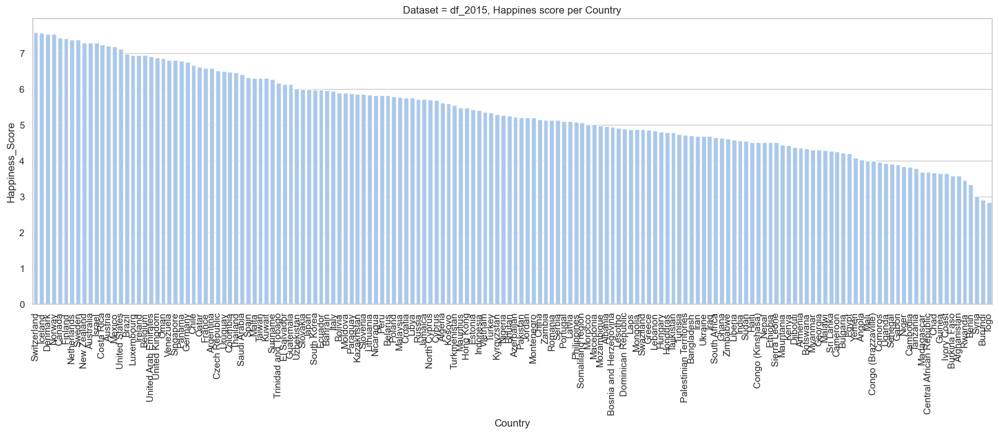

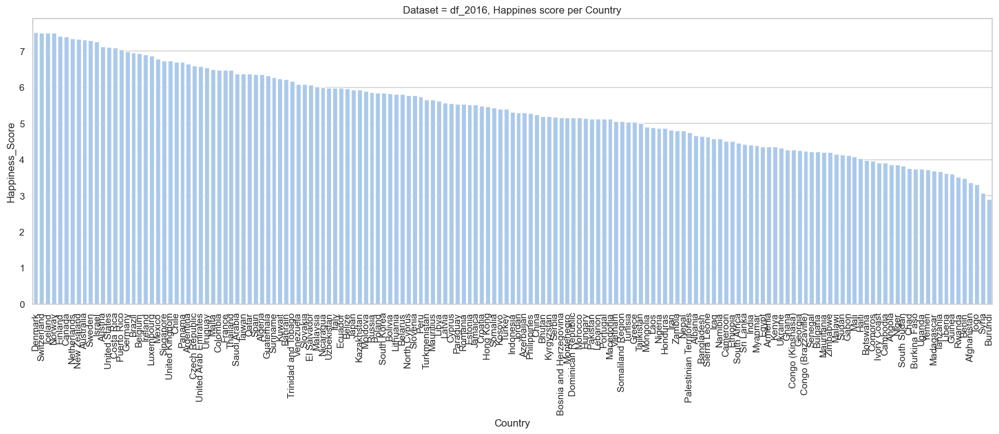

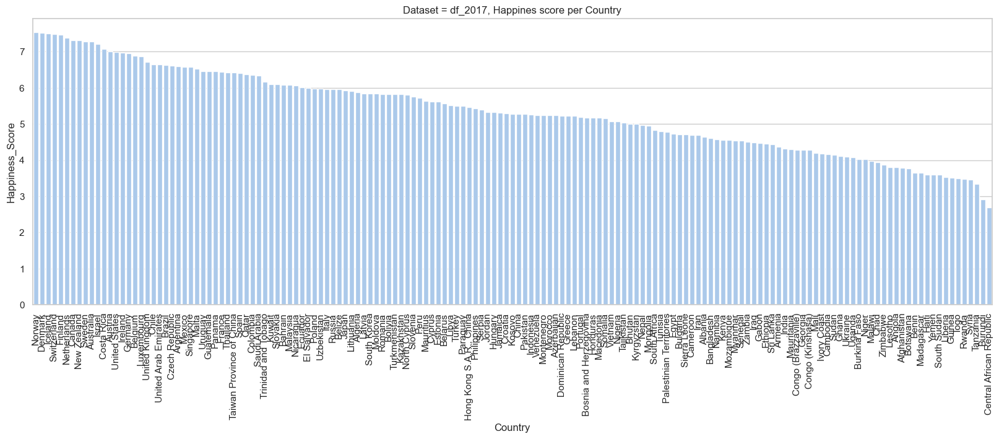

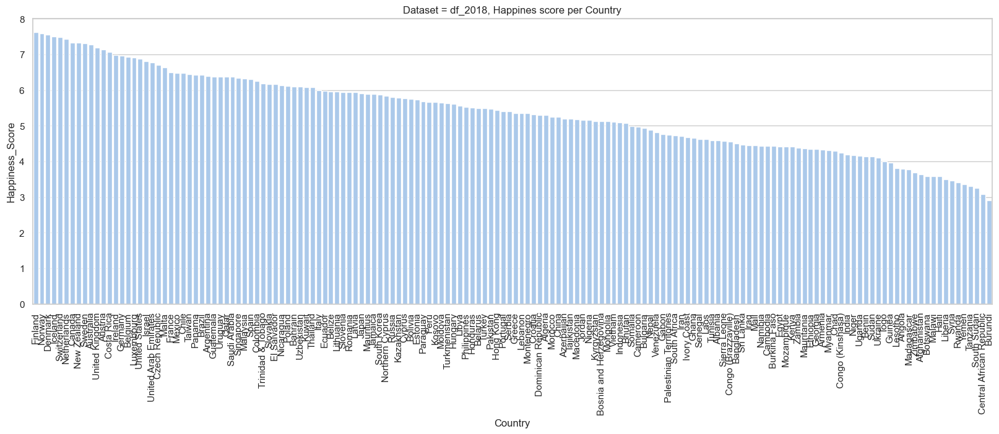

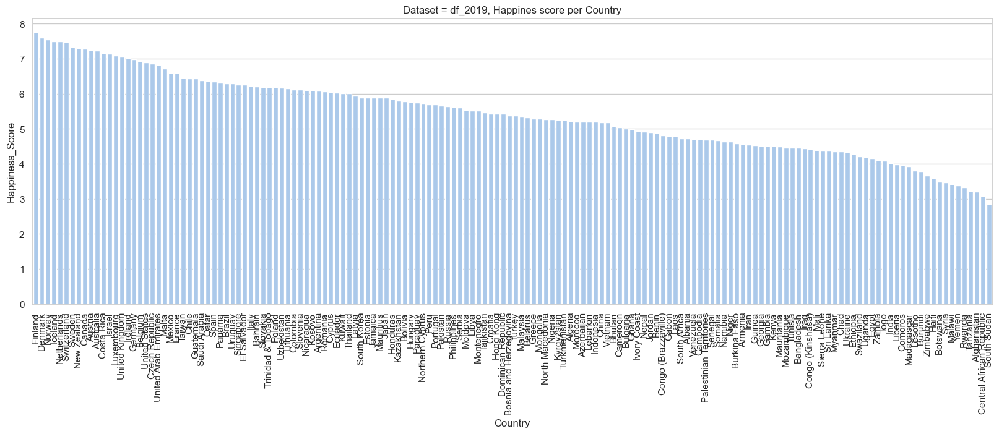

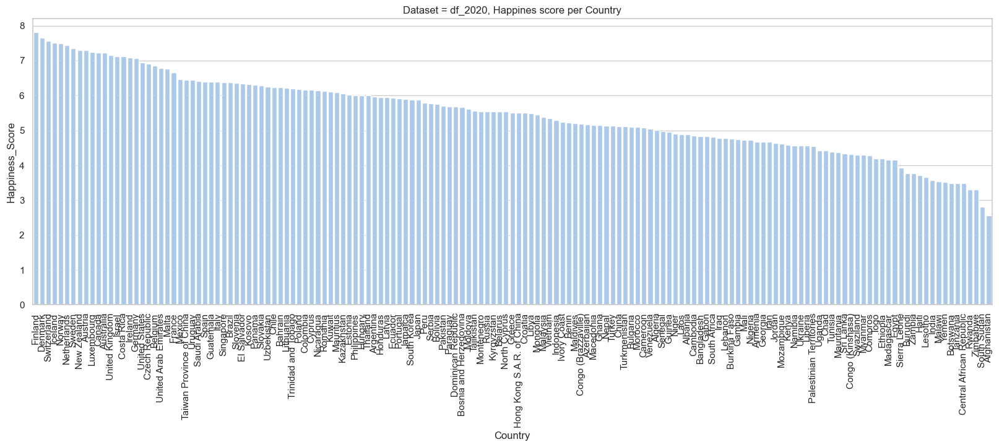

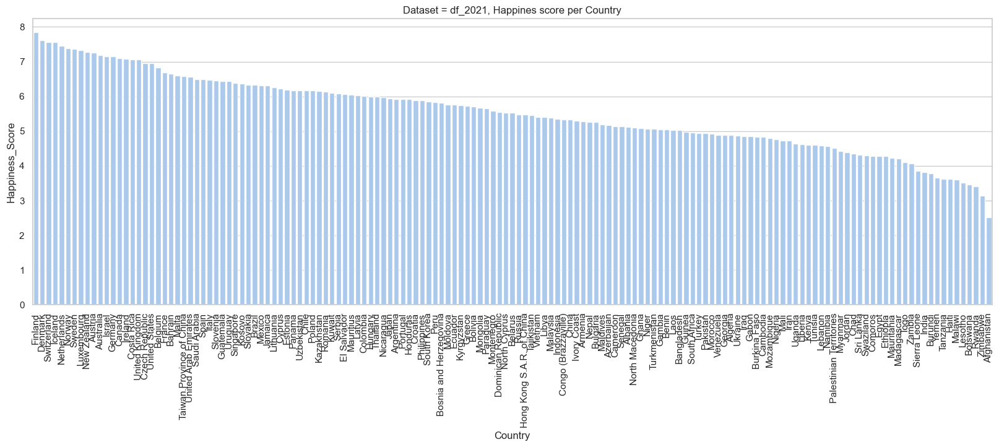

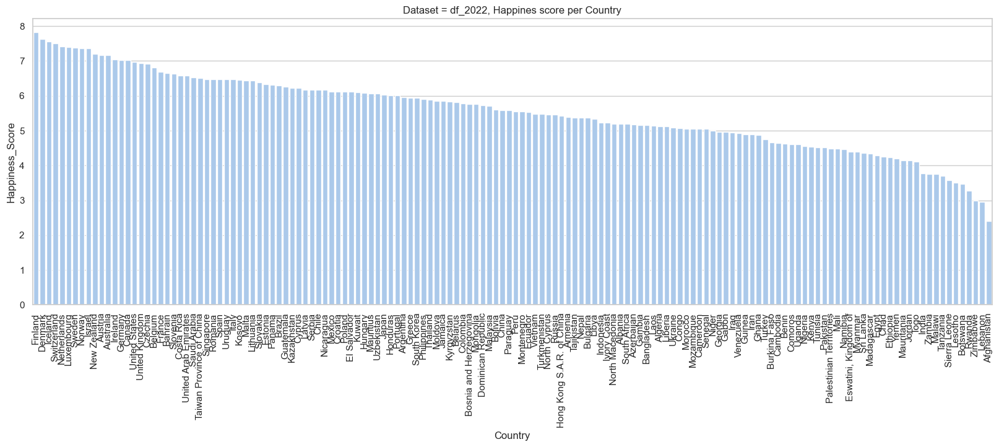

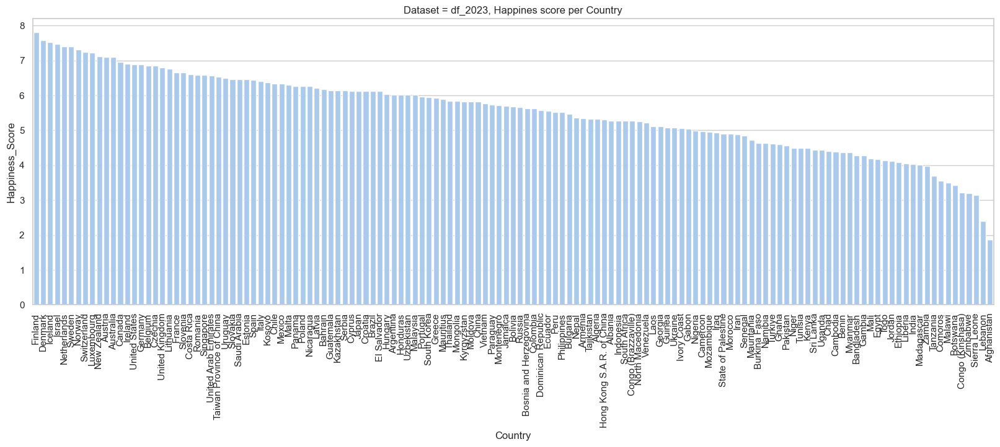

In [163]:
for i in df_list:
    fig, ax = plt.subplots(figsize=(20,6))
    
    sns.barplot(data = i, 
                x = 'Country', 
                y = 'Happiness_Score');
    ax.tick_params(axis='x', labelrotation = 90);
    ax.set(title = 'Dataset = ' + i.name + ', Happines score per Country');

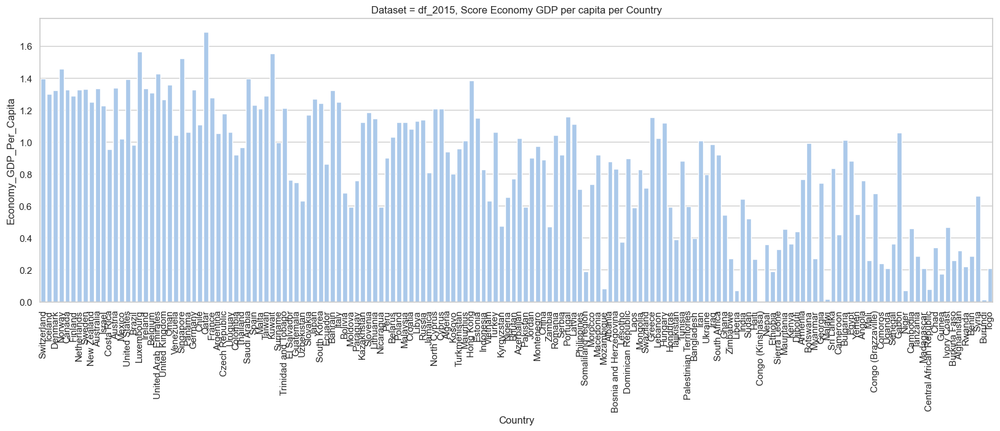

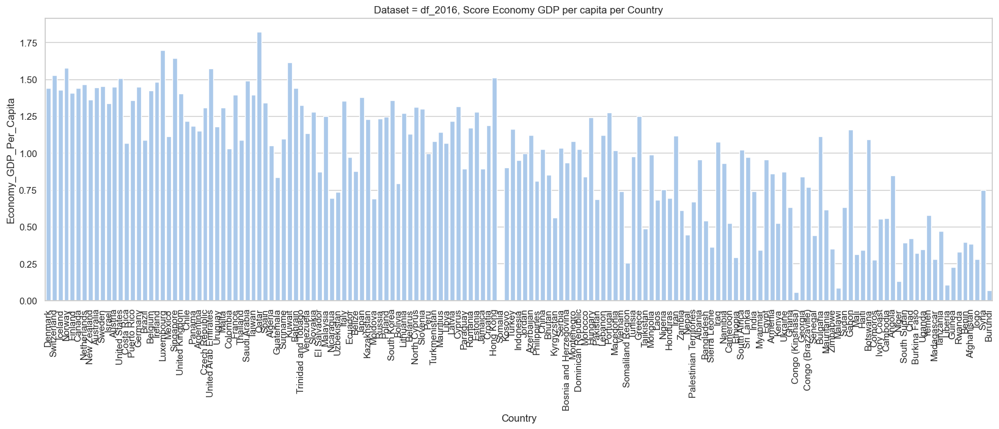

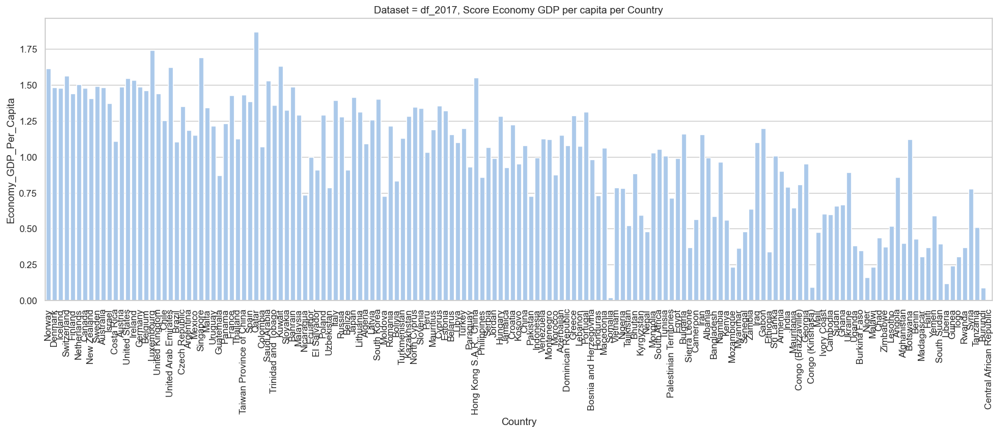

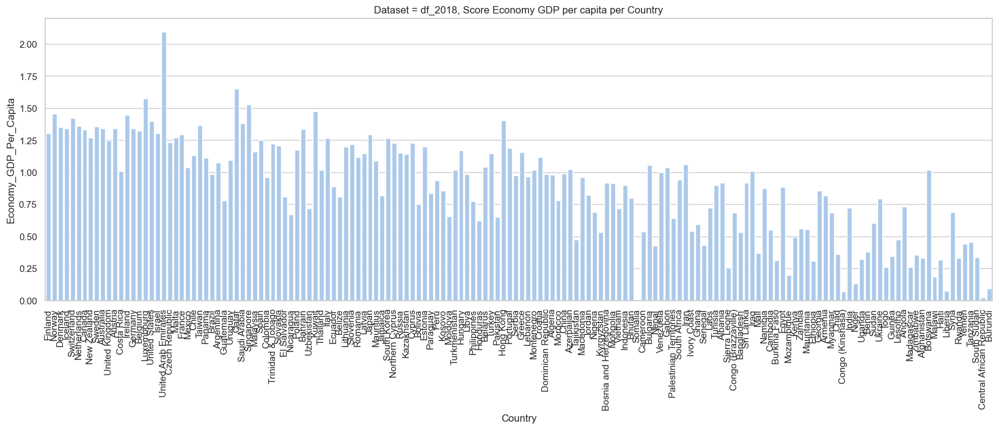

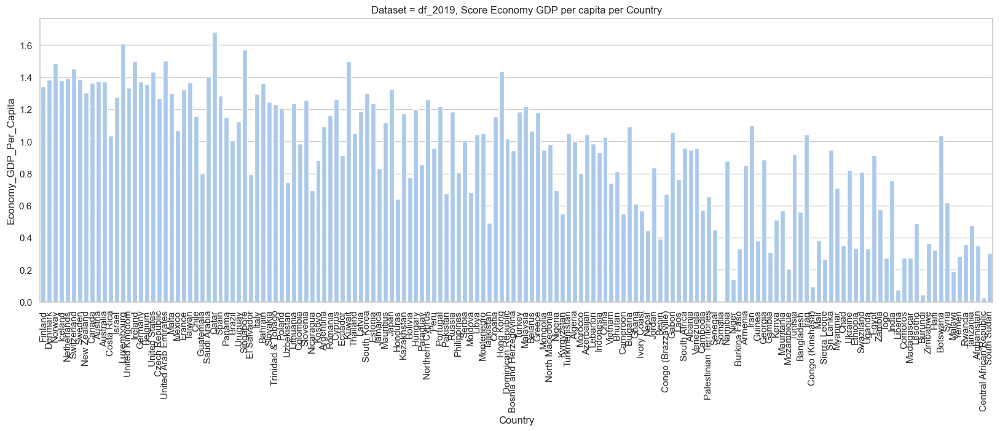

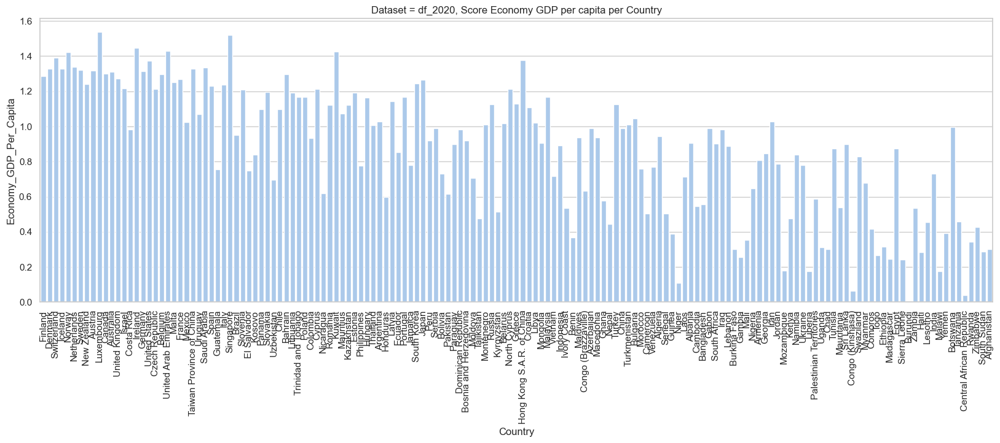

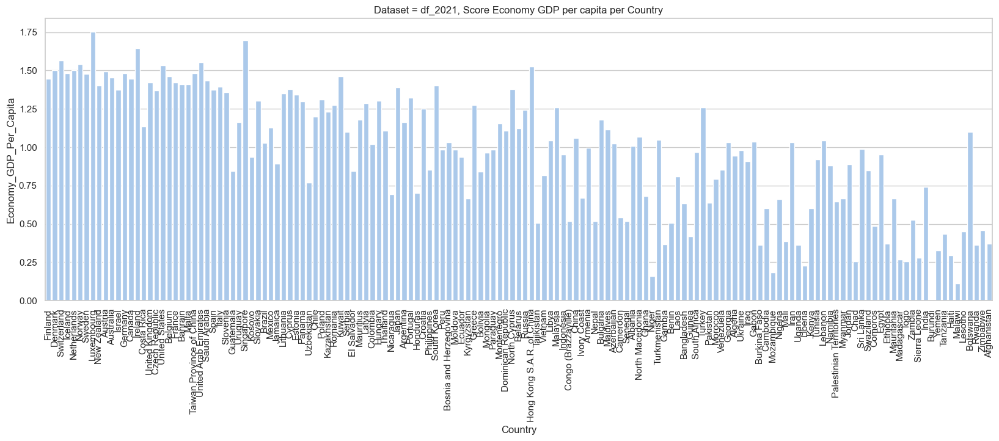

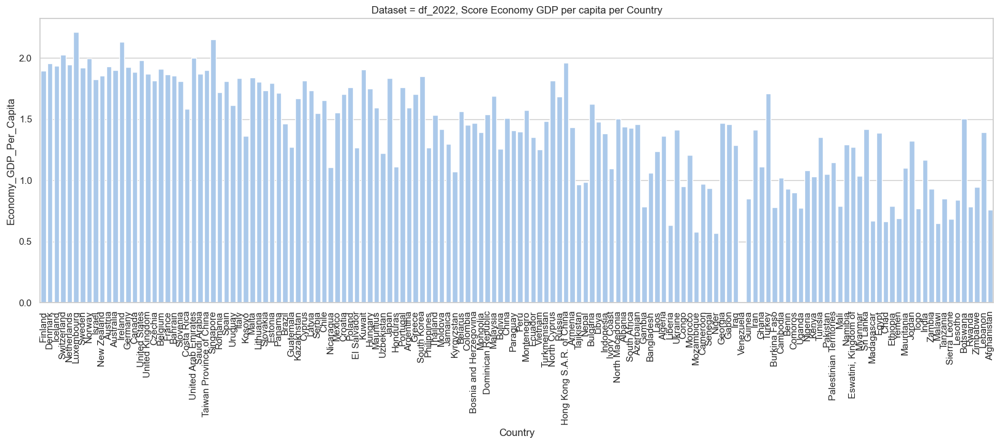

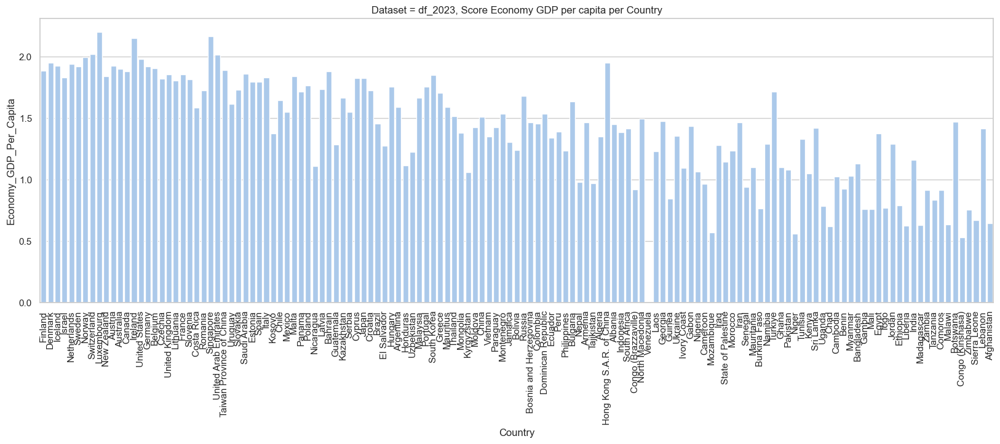

In [164]:
for i in df_list:
    fig, ax = plt.subplots(figsize=(20,6))   
    sns.set_theme(style="whitegrid", palette="pastel")
    sns.barplot(data = i, 
                x = 'Country', 
                y = 'Economy_GDP_Per_Capita');
    ax.tick_params(axis='x', labelrotation = 90);
    ax.set(title = 'Dataset = ' + i.name + ', Score Economy GDP per capita per Country');

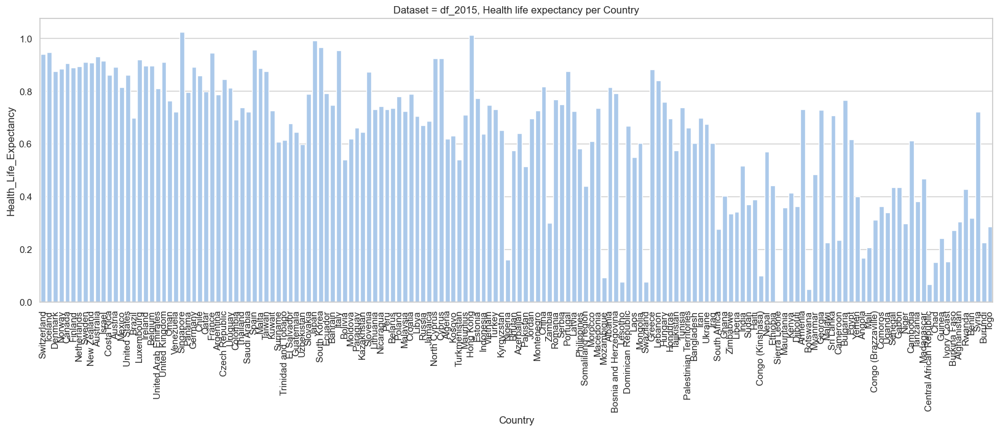

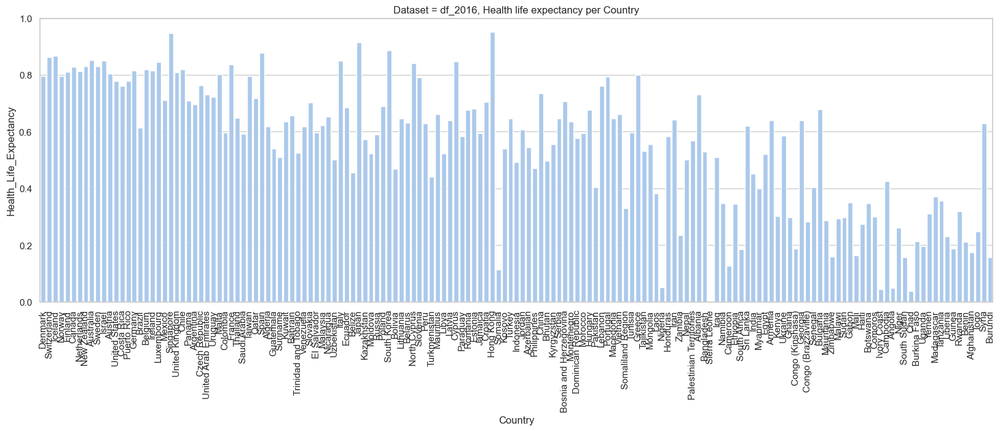

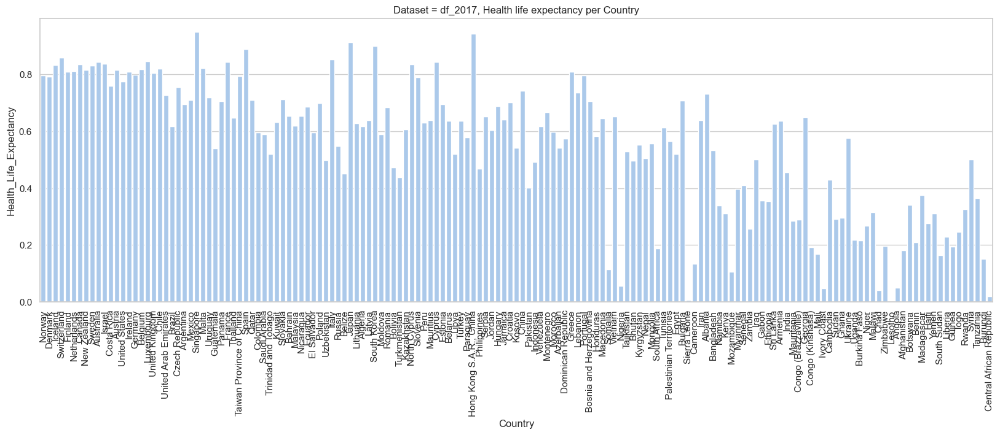

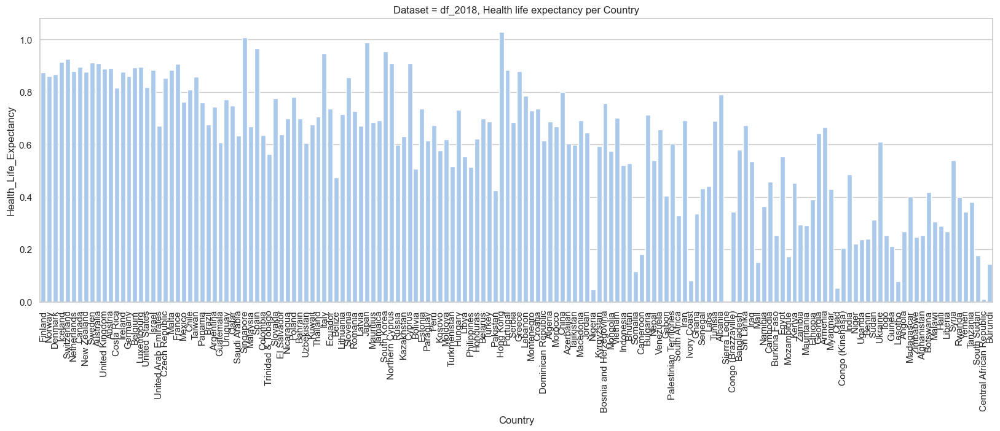

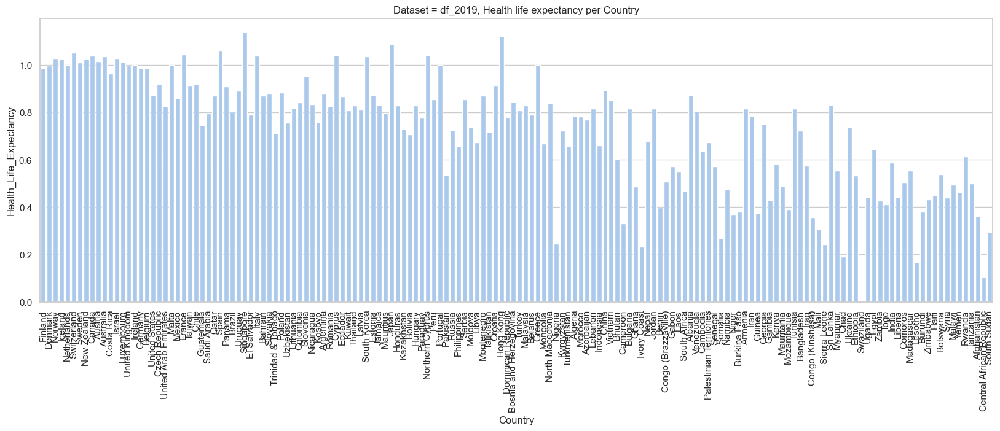

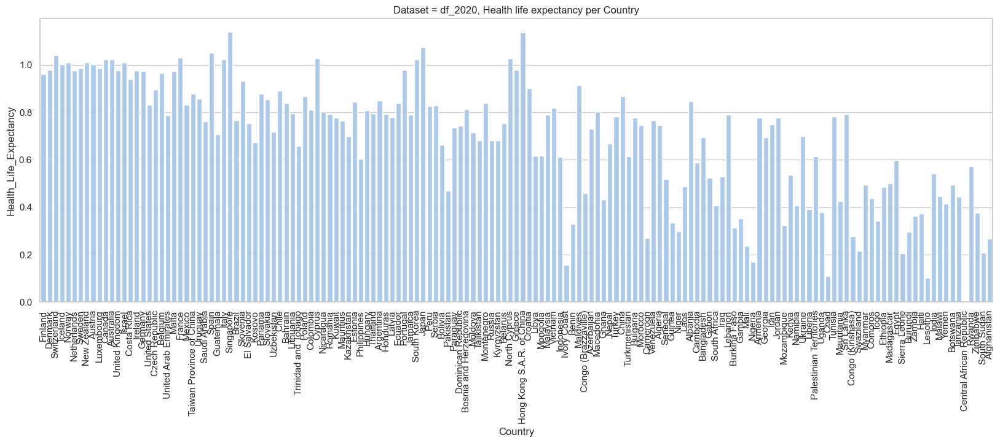

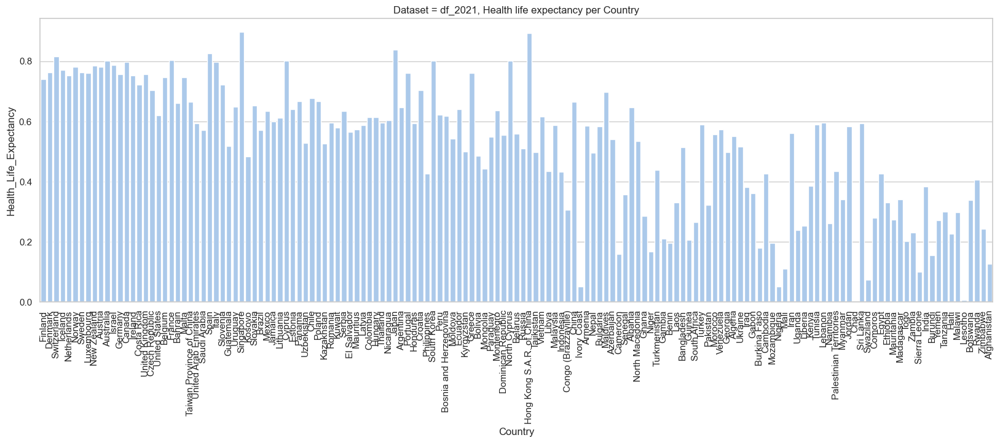

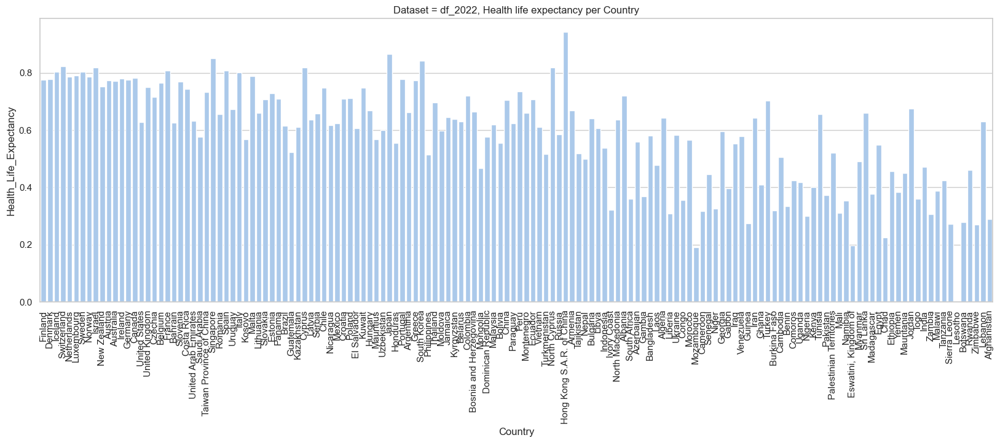

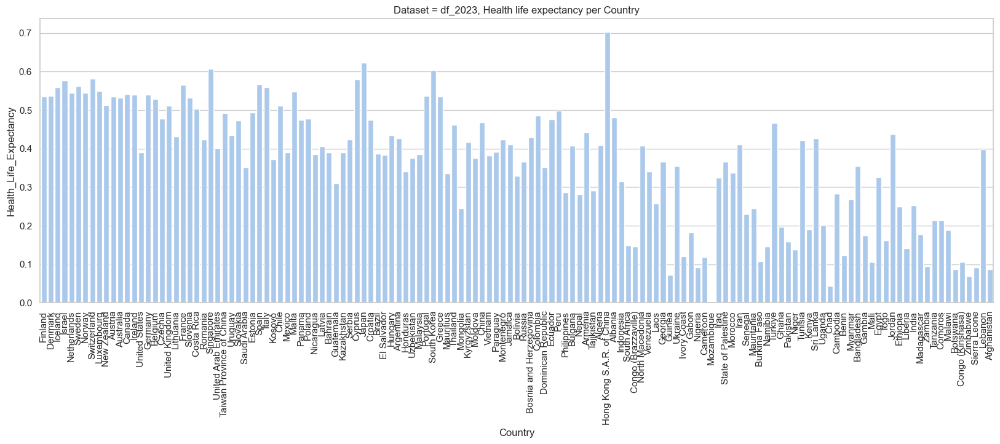

In [165]:
for i in df_list:
    fig, ax = plt.subplots(figsize=(20,6))
    sns.barplot(data = i, 
                x = 'Country', 
                y = 'Health_Life_Expectancy');
    ax.tick_params(axis='x', labelrotation = 90);
    ax.set(title = 'Dataset = ' + i.name + ', Health life expectancy per Country');

# Catplot Ladder Score (Happines score)

- in the first plot we can see, that a bigger GDP per capita also positive correlate the Ladder score
- in the second plot we can see, that a bigger Healthy life expectancy also positive correlate the Ladder score

# <font color=red>Feedback</font>
All of the catplots below are already present in the pairplots in one of the previous sections.
No additional insights are gained from them.

Sidenote: For this type of plot we'd recommend using [```sns.scatterplot()```](https://seaborn.pydata.org/generated/seaborn.scatterplot.html).
Catplot treats one of the axis as a categorical feature.
This means that the distances on the axis might not be to scale and every value is plotted as a label.

<Figure size 2000x600 with 0 Axes>

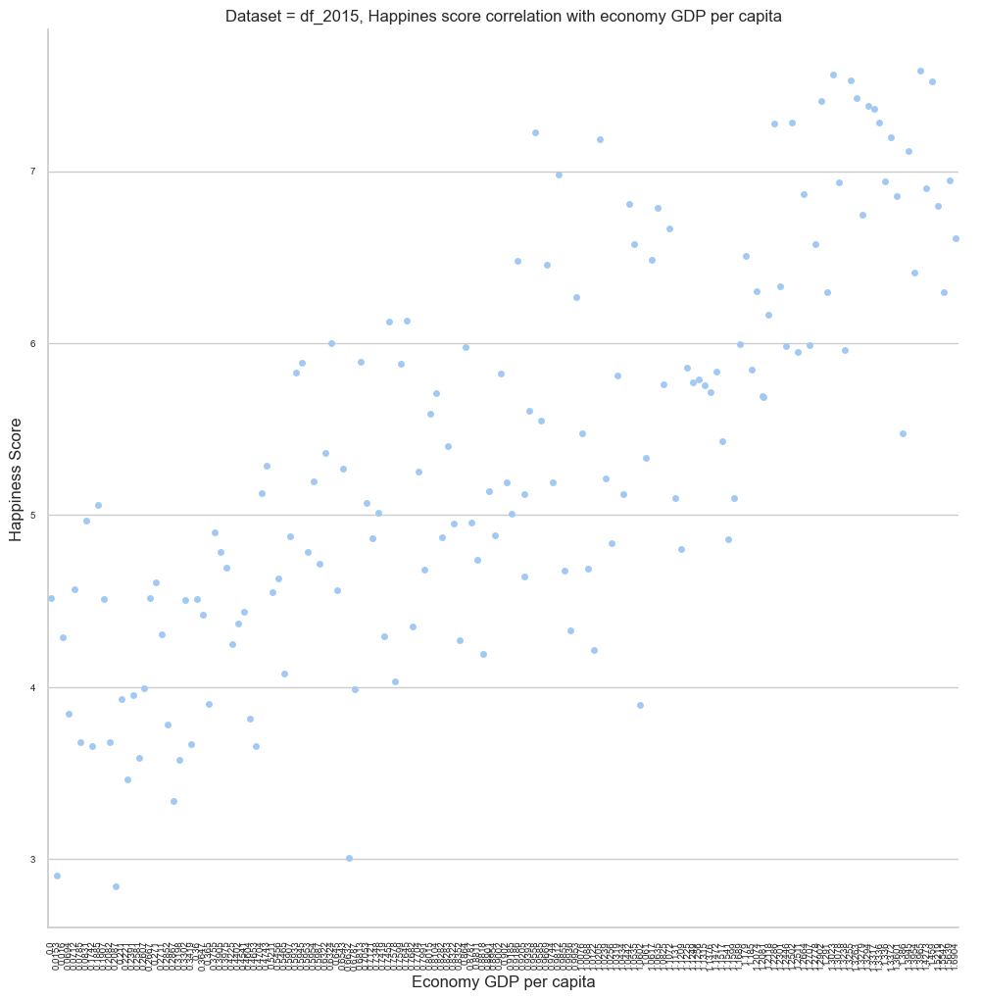

<Figure size 2000x600 with 0 Axes>

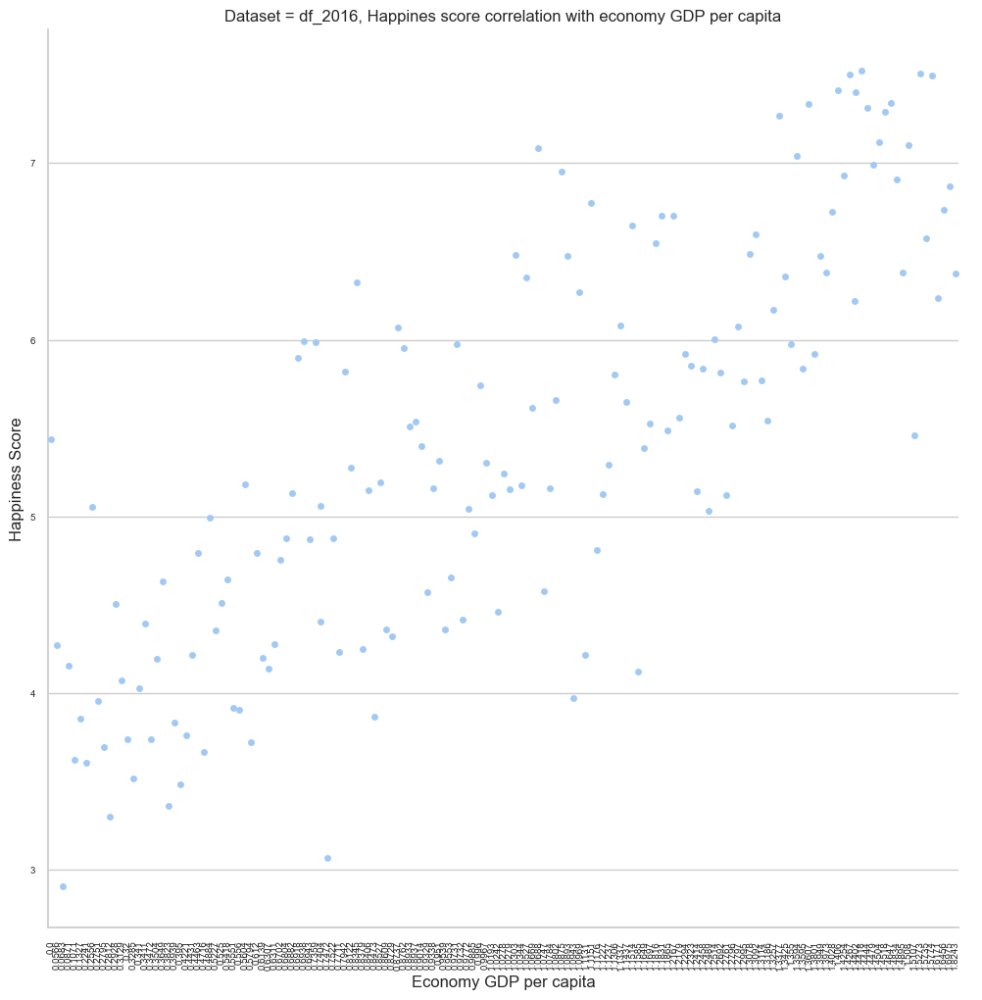

<Figure size 2000x600 with 0 Axes>

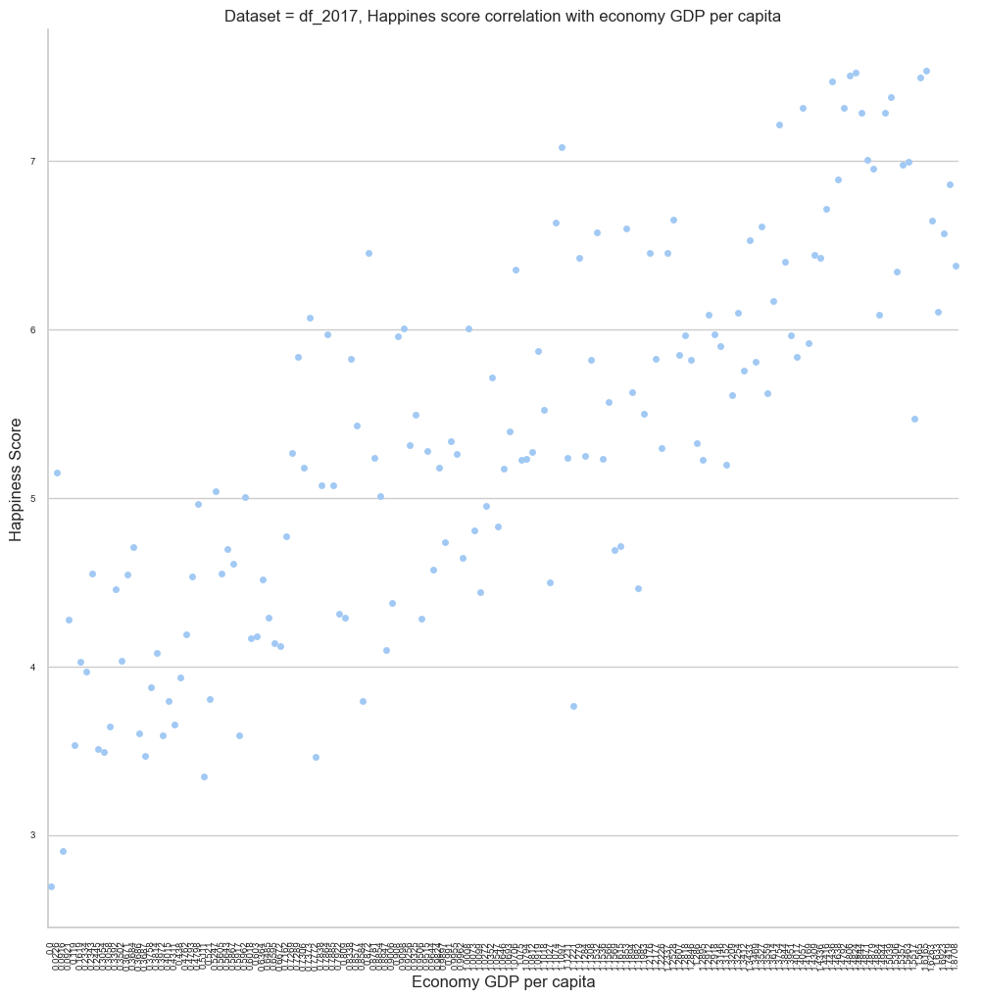

<Figure size 2000x600 with 0 Axes>

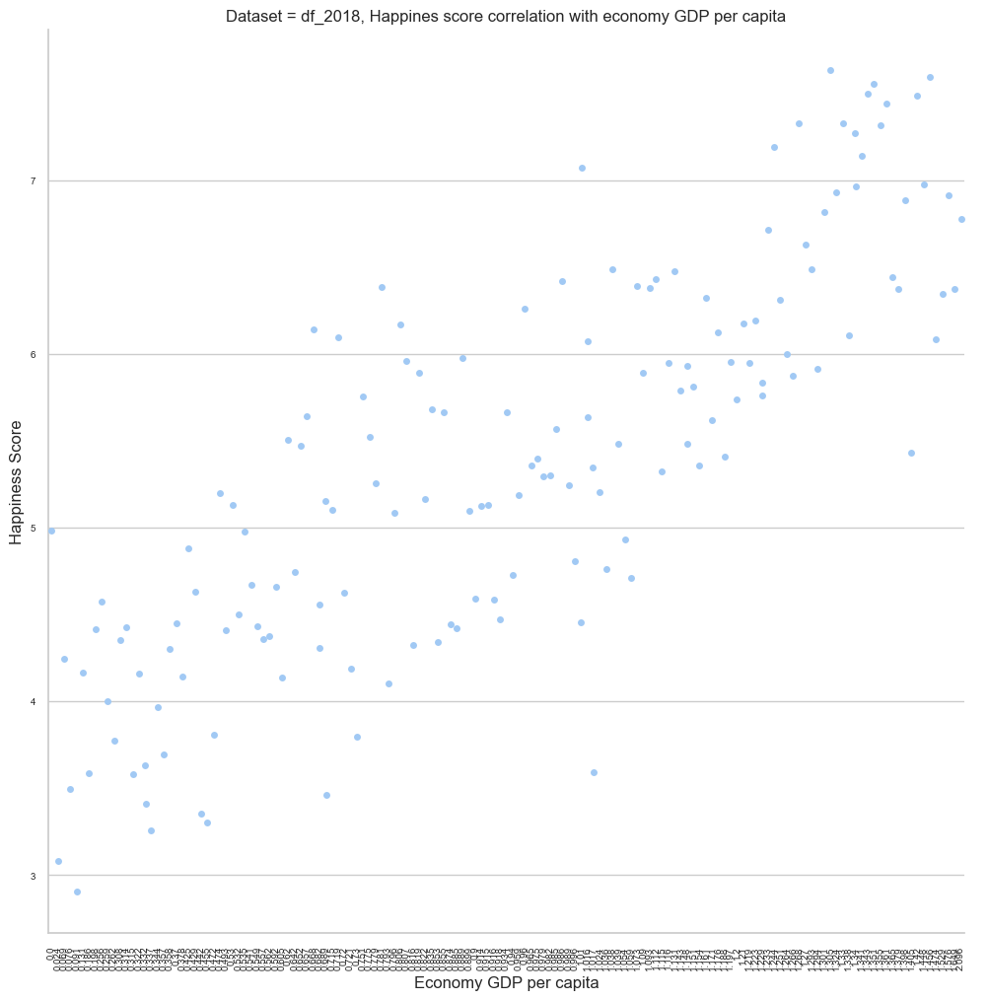

<Figure size 2000x600 with 0 Axes>

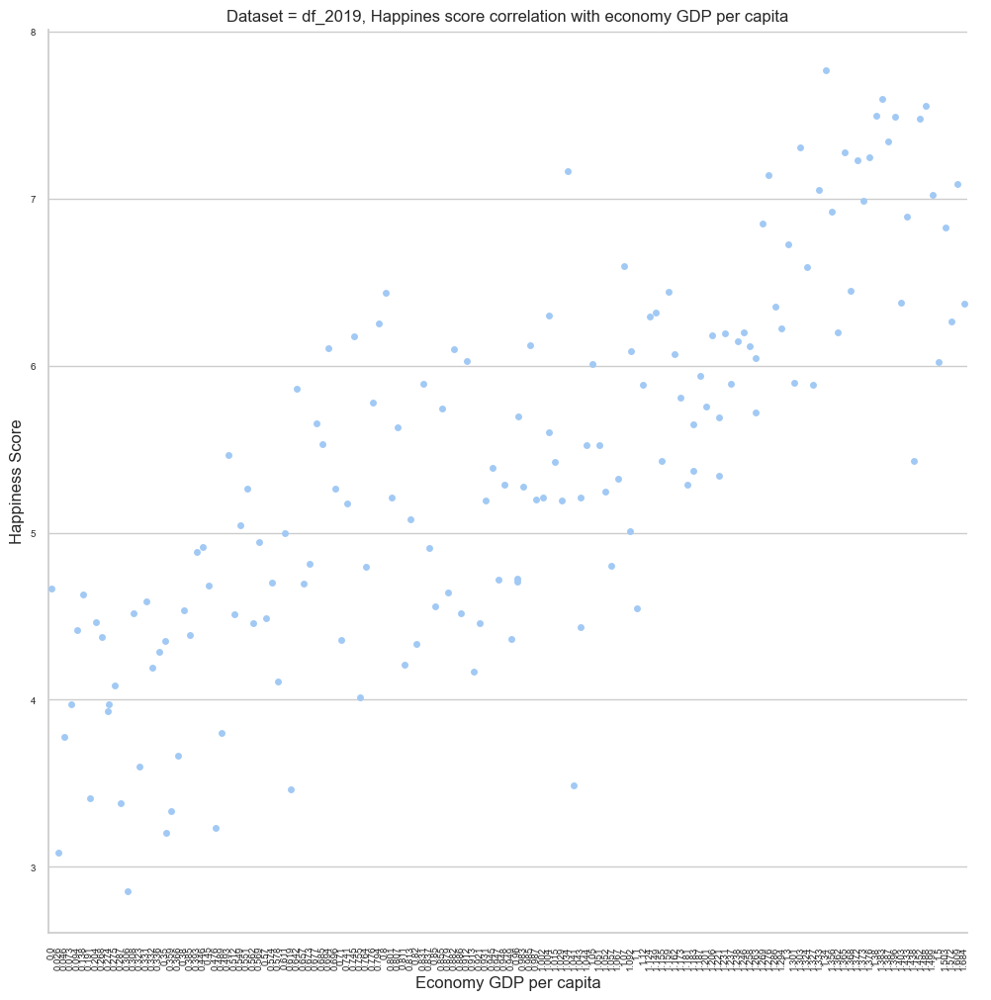

<Figure size 2000x600 with 0 Axes>

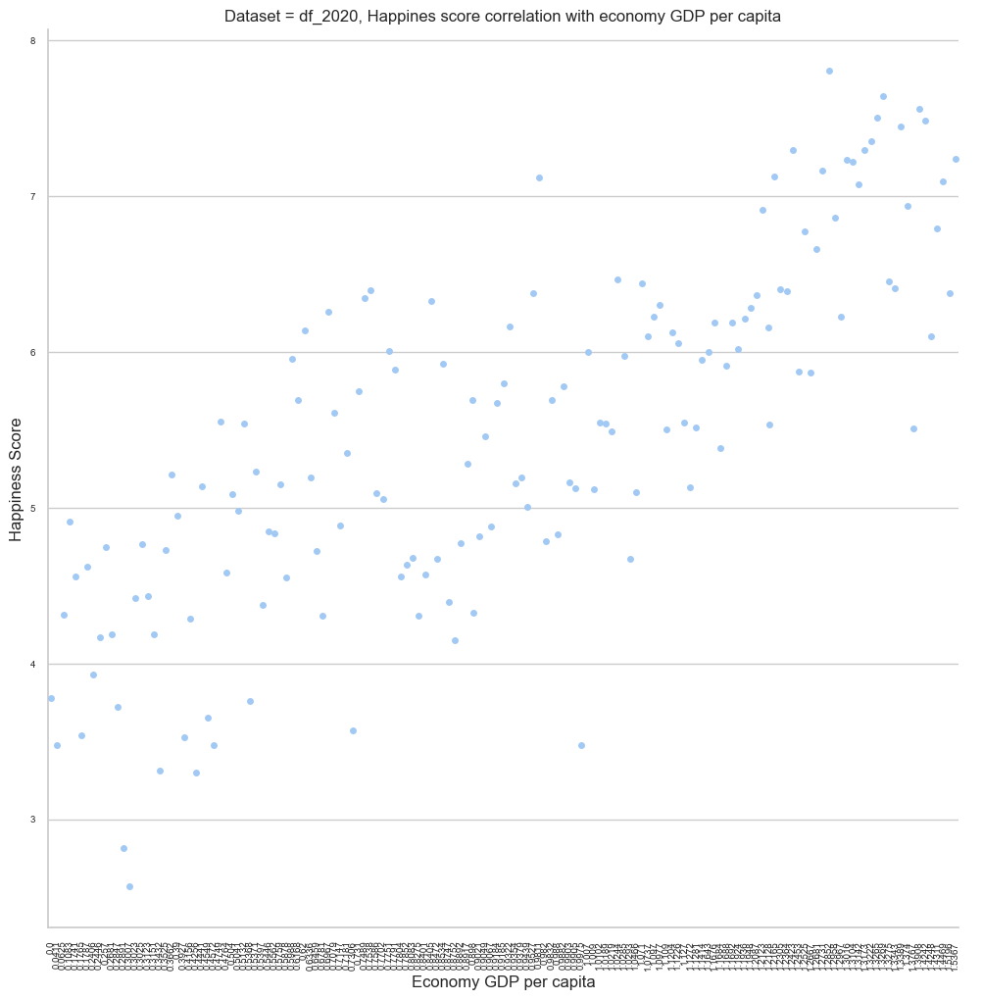

<Figure size 2000x600 with 0 Axes>

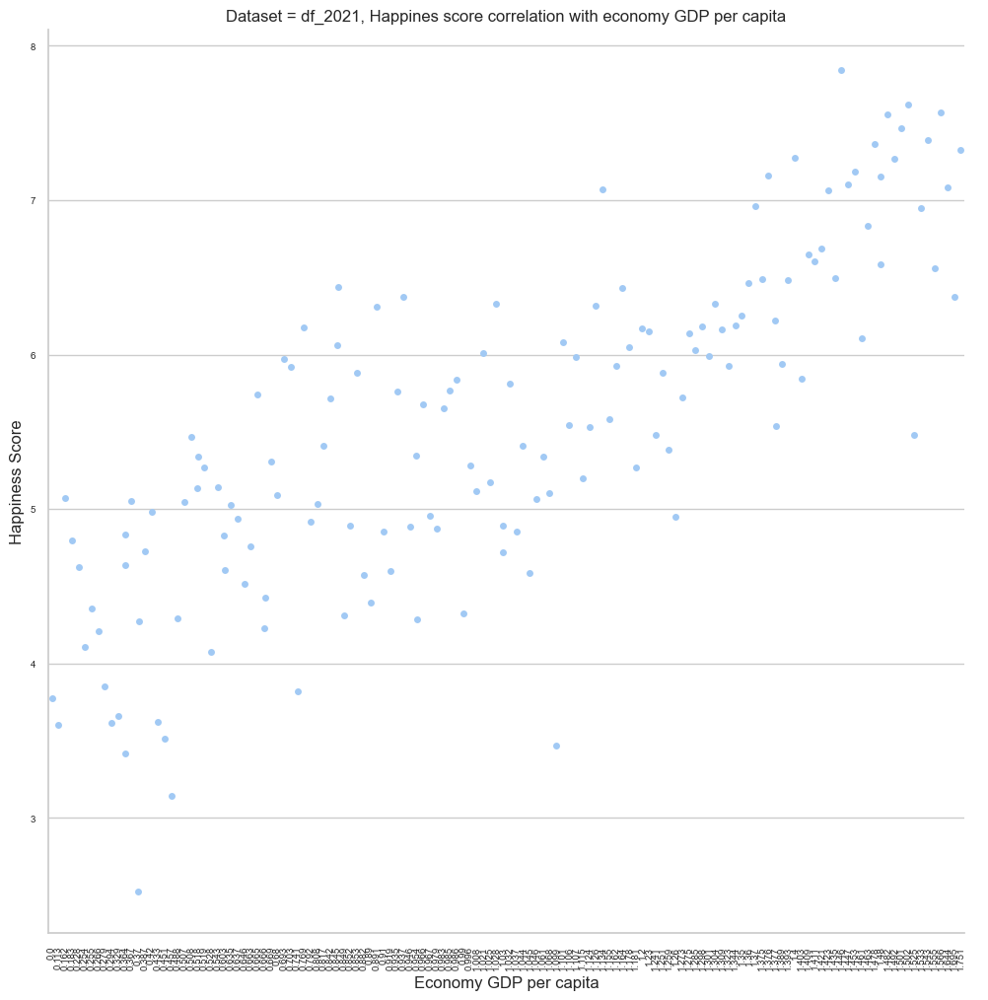

<Figure size 2000x600 with 0 Axes>

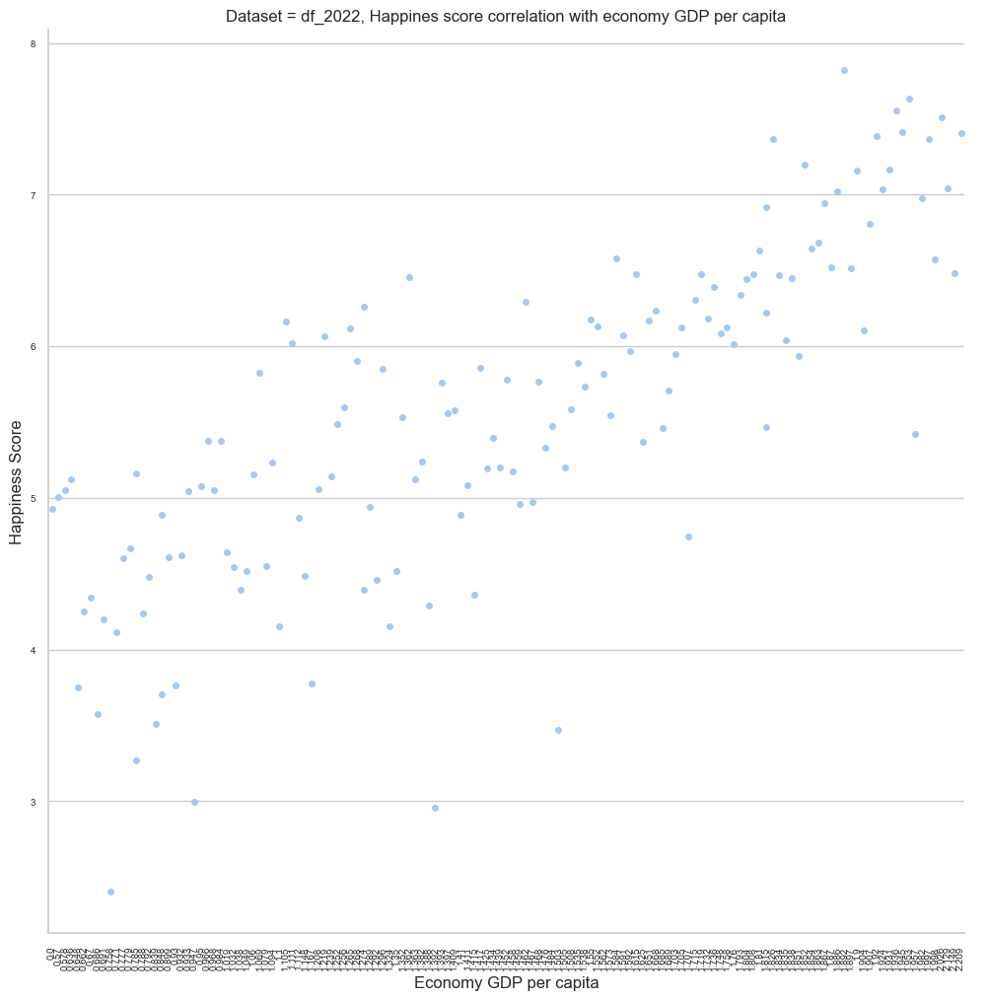

<Figure size 2000x600 with 0 Axes>

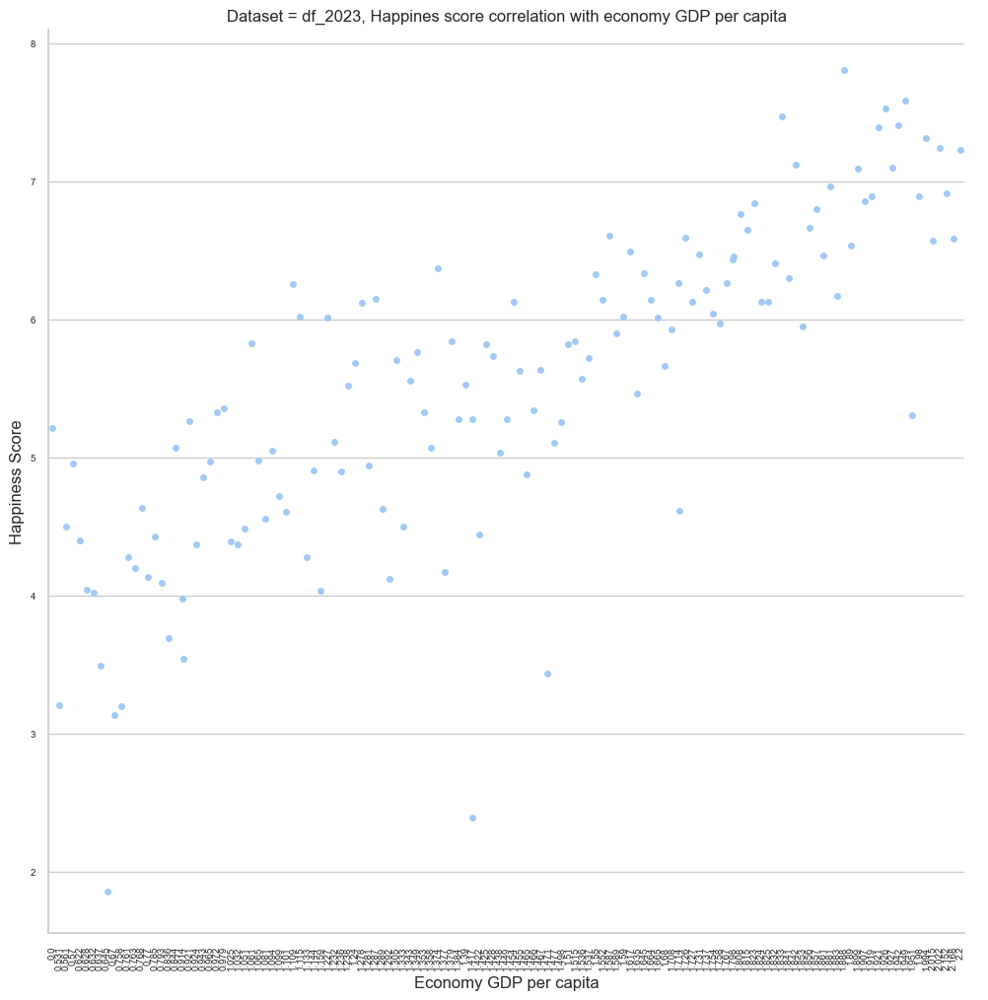

In [166]:
for i in df_list:
    plt.figure(figsize=(20,6))
    
    sns.catplot(data=i,
                x='Economy_GDP_Per_Capita',
                y='Happiness_Score',
                height = 10,
                width = 200);
    
    plt.xlabel('Economy GDP per capita');
    plt.ylabel('Happiness Score');
    plt.tick_params(axis='y', labelsize = 7);
    plt.tick_params(axis='x', labelrotation = 90, labelsize = 7);
    plt.title('Dataset = ' + i.name + ', Happines score correlation with economy GDP per capita');

In this catplots we can see, that the happiness score correlates with economy GDP per capita. We can tell, that with a bigger economy GDP per Capita also increase the happiness score. 

<Figure size 4000x600 with 0 Axes>

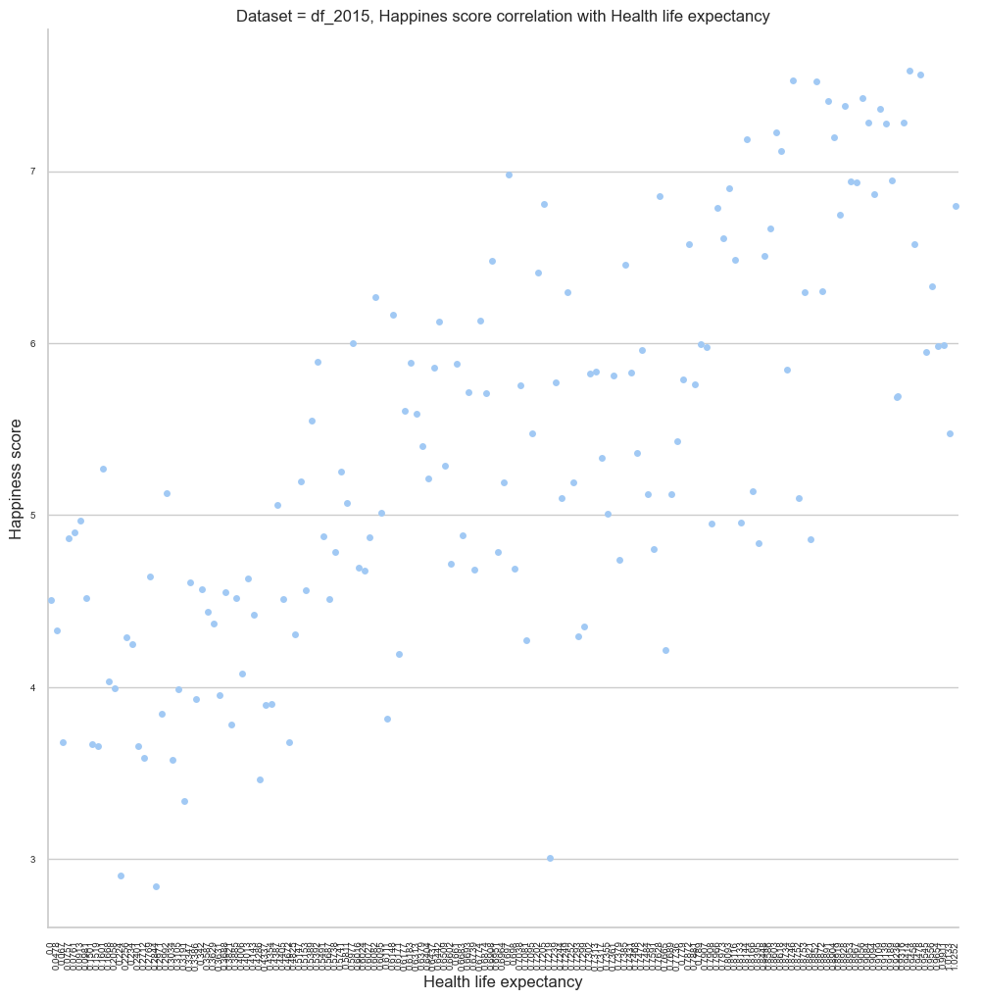

<Figure size 4000x600 with 0 Axes>

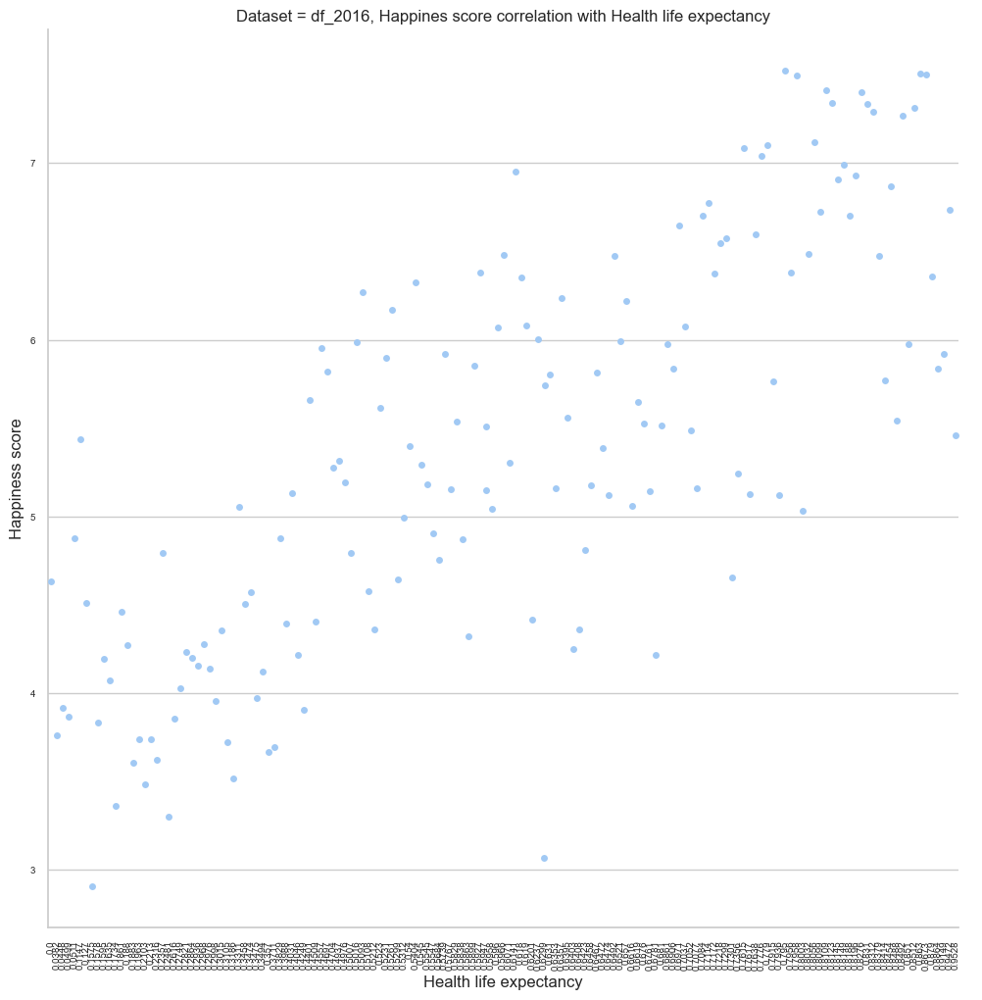

<Figure size 4000x600 with 0 Axes>

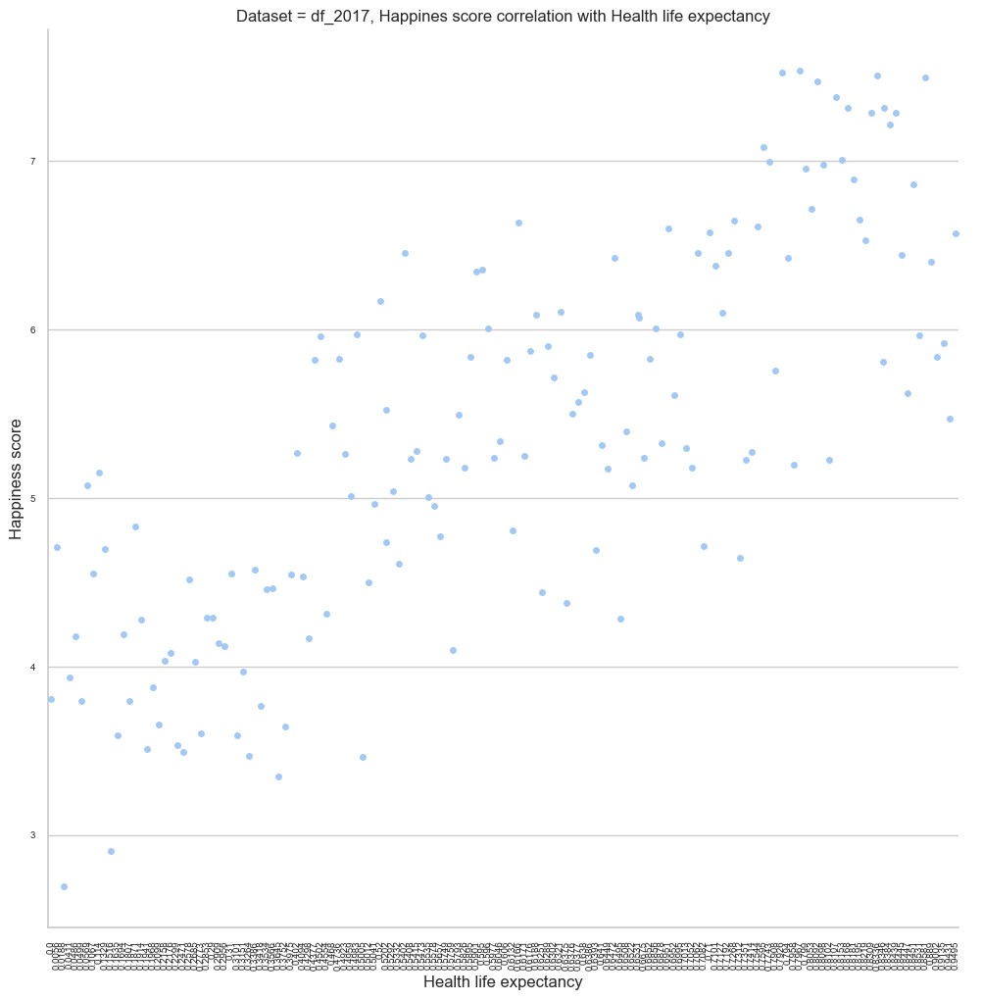

<Figure size 4000x600 with 0 Axes>

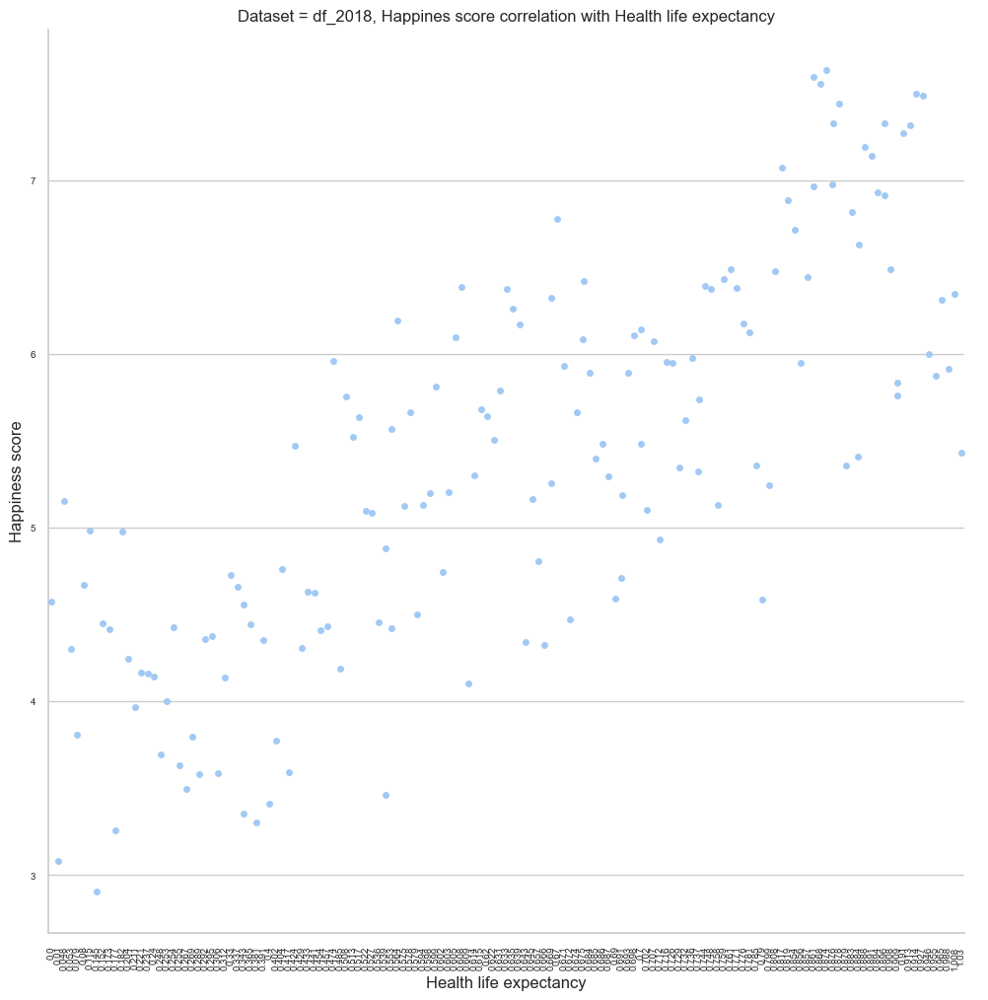

<Figure size 4000x600 with 0 Axes>

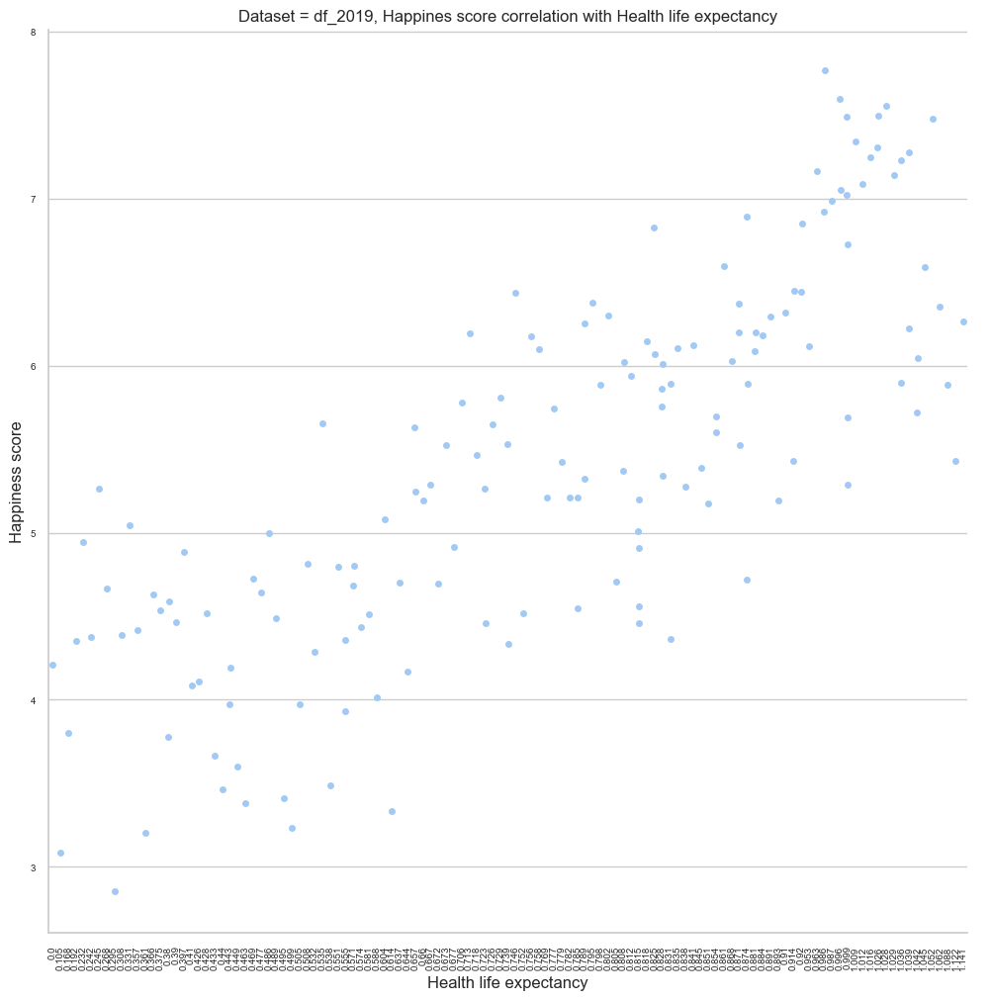

<Figure size 4000x600 with 0 Axes>

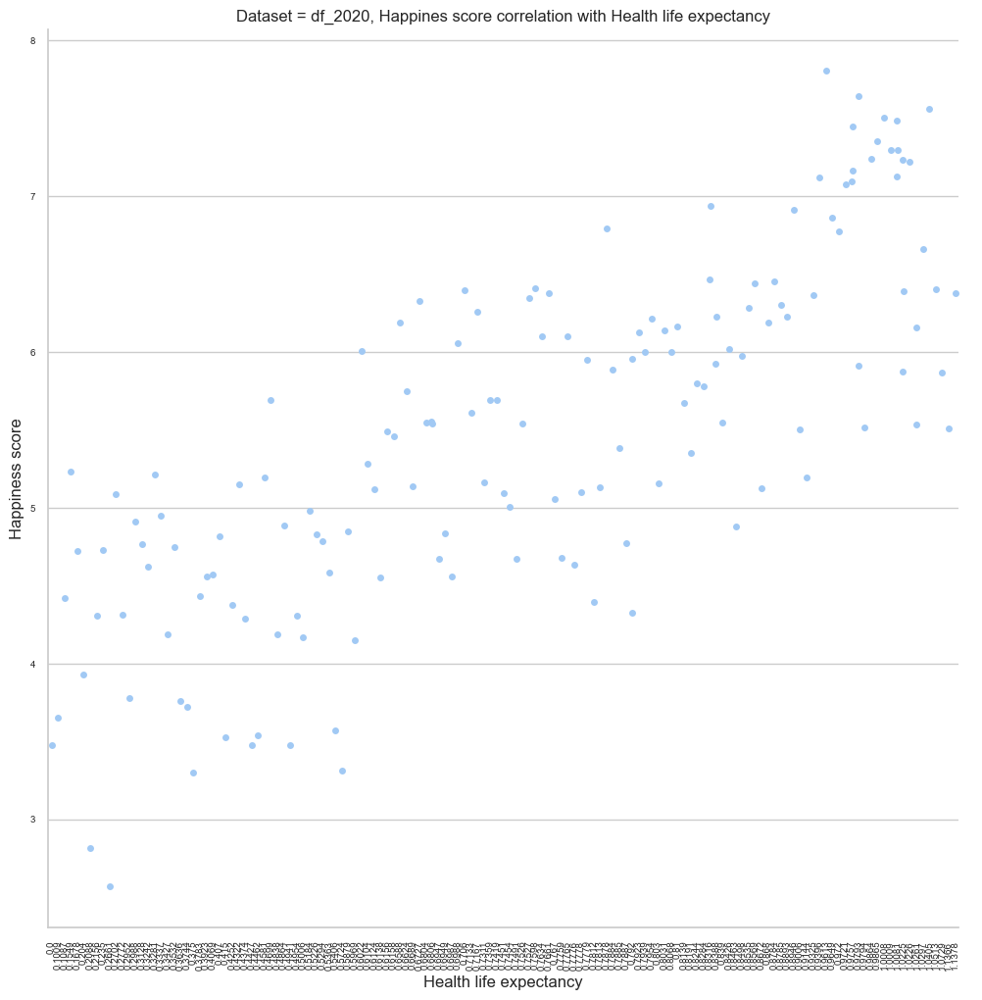

<Figure size 4000x600 with 0 Axes>

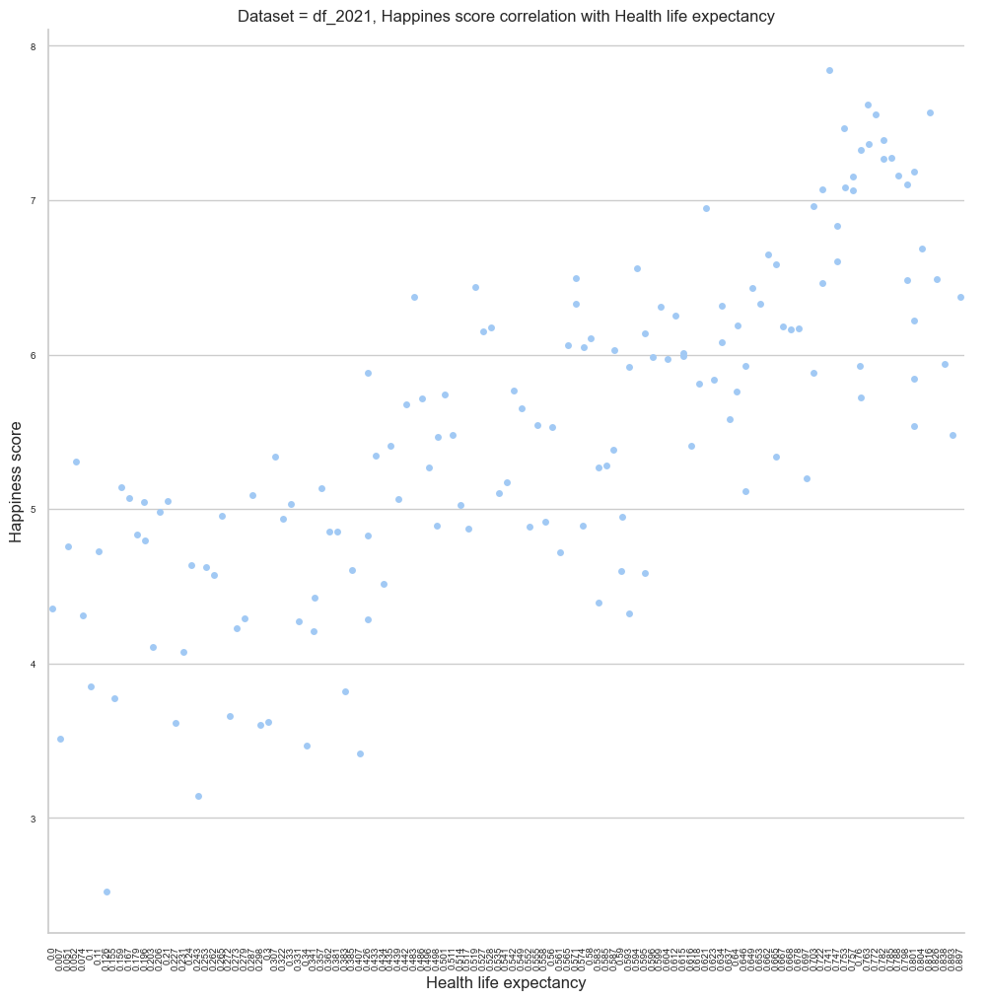

<Figure size 4000x600 with 0 Axes>

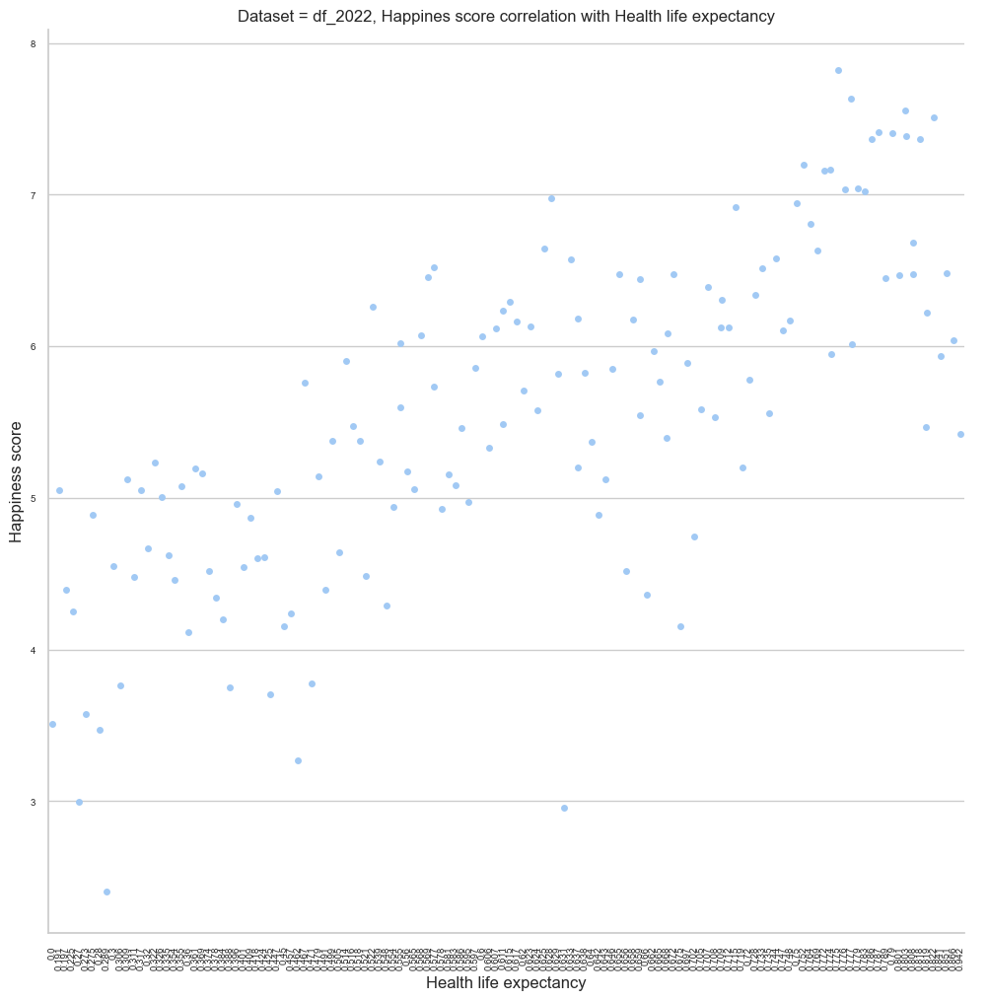

<Figure size 4000x600 with 0 Axes>

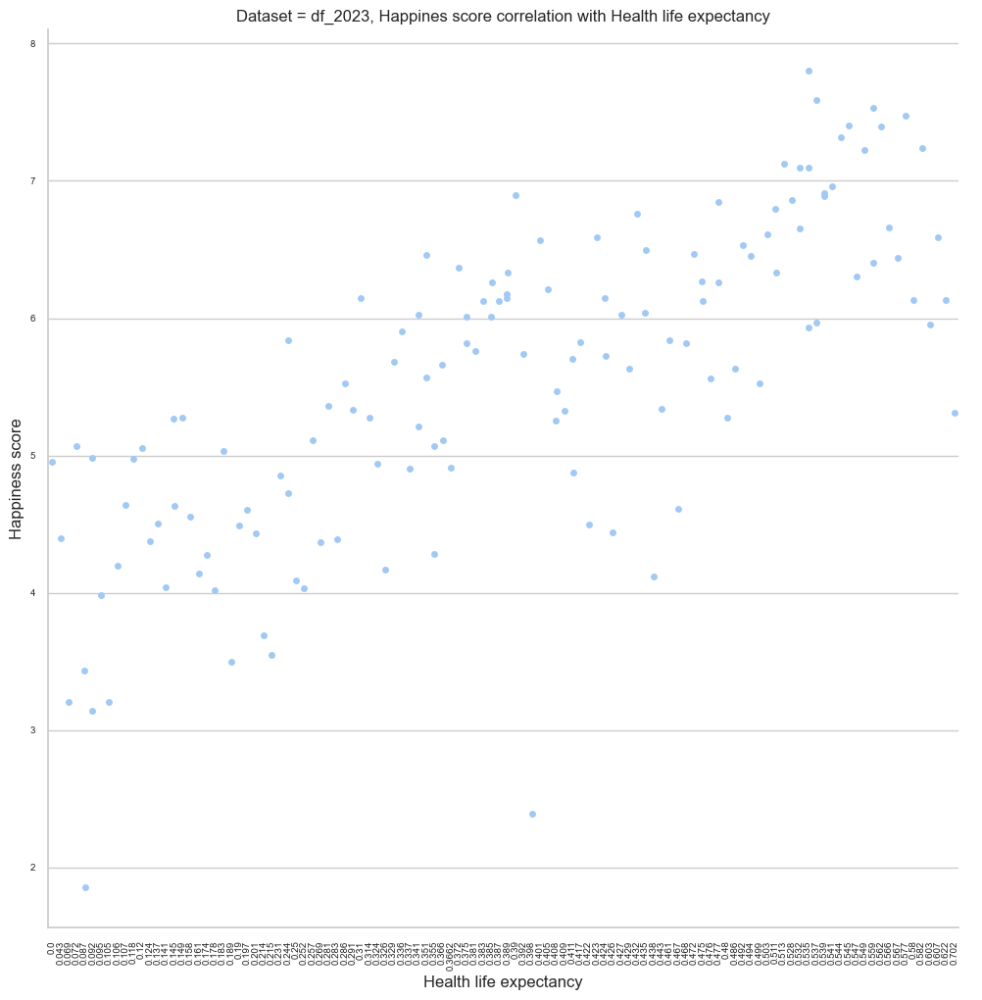

In [167]:
for i in df_list:
    plt.figure(figsize=(40,6))
    
    sns.catplot(data=i,
                x='Health_Life_Expectancy',
                y='Happiness_Score',
                height = 10,
                width = 150);
    
    plt.xlabel('Health life expectancy');
    plt.ylabel('Happiness score');
    plt.tick_params(axis='y', labelsize = 7);
    plt.tick_params(axis='x', labelrotation = 90, labelsize = 7);
    plt.title('Dataset = ' + i.name + ', Happines score correlation with Health life expectancy');

In this catplots we can see, that the happiness score correlates with health life expectancy. We can tell, that with a bigger health life expentancy also increase the happiness score. 

# Dataframe

After data analysis and data distribution for every year, we create a one big dataframe with all the data.

In [168]:
df = pd.concat(df_list) # concat all dataset into one big dataframe
display(df)             # display dataframe

,Country,Happiness_Score,Economy_GDP_Per_Capita,Social_Support,Health_Life_Expectancy,Freedom,Generosity,Perceptions_Of_Corruption,Year
0,Switzerland,7.587,1.3965,1.3495,0.9414,0.6656,0.2968,0.4198,2015
1,Iceland,7.561,1.3023,1.4022,0.9478,0.6288,0.4363,0.1414,2015
2,Denmark,7.527,1.3255,1.3606,0.8746,0.6494,0.3414,0.4836,2015
3,Norway,7.522,1.4590,1.3310,0.8852,0.6697,0.3470,0.3650,2015
4,Canada,7.427,1.3263,1.3226,0.9056,0.6330,0.4581,0.3296,2015
...,...,...,...,...,...,...,...,...,...
132,Congo (Kinshasa),3.207,0.5310,0.7840,0.1050,0.3750,0.1830,0.0680,2023
133,Zimbabwe,3.204,0.7580,0.8810,0.0690,0.3630,0.1120,0.1170,2023
134,Sierra Leone,3.138,0.6700,0.5400,0.0920,0.3710,0.1930,0.0510,2023
135,Lebanon,2.392,1.4170,0.4760,0.3980,0.1230,0.0610,0.0270,2023


we created a big dataframe with 1367 columns. In this dataframe, we've the same columns